## 1查看字段

In [7]:
import pandas as pd
from scipy.stats import pearsonr

# 读取 Excel 文件
file_path = 'preprocessed_data_filled.xlsx'  # 确保路径正确
df = pd.read_excel(file_path)

target_variable = 'prob_change'

# 获取所有特征列（不包括目标变量）
features = [
    'rm_1750_acc at baseline', 'rm_750_acc at baseline', 'stroop_incongruent_rt at baseline', 
    'stroop_interference_effect_rt at baseline', 'nogo_acc at baseline', 'switch_cost at baseline', 
    'dsbt_span at baseline', 'Age', 'Education years', 'BMI', 'SES', 'Gender_2', 'Ethnic', 
    'Residence_2', 'Only child', 'Smoking status_2', 'Smoking status_3', 'Alcohol consumption_2', 
    'Alcohol consumption_3', 'Employed_2', 'Marital status_2.0', 'Marital status_3.0', 
    'Marital status_3.5', 'First episode', 'Frequency of episodes', 'Age at onset', 
    'Duration of disorder', 'Dose equivalent to olanzapine (mg/day)'
]

# 对分类变量进行One-Hot编码
categorical_features = ['Gender', 'Ethnic', 'Residence', 'Smoking status', 'Alcohol consumption', 
                        'Employed', 'Marital status', 'First episode']  # 需要编码的分类变量

# 使用One-Hot编码处理分类变量
df_encoded = pd.get_dummies(df, columns=categorical_features, drop_first=True)

# 打印处理后的DataFrame列名
print(f"Data columns after One-Hot Encoding: {df_encoded.columns.tolist()}")

# 打印每个特征与目标变量的皮尔逊相关系数
for feature in features:
    print(f"Processing feature: {feature}")  # 打印当前正在处理的特征名
    # 检查每个特征是否在数据中存在
    if feature in df_encoded.columns:
        # 计算皮尔逊相关系数
        correlation, _ = pearsonr(df_encoded[feature], df_encoded[target_variable])
        print(f"Correlation between {feature} and {target_variable}: {correlation}")
    else:
        print(f"Feature {feature} not found in the data.")

Data columns after One-Hot Encoding: ['rm_1750_acc at baseline', 'rm_750_acc at baseline', 'stroop_incongruent_rt  at baseline', 'stroop_interference_effect_rt  at baseline', 'dsbt_span at baseline', 'prob_change', 'Education years', 'nogo_acc  at baseline', 'switch_cost  at baseline', 'Age', 'BMI', 'SES', 'Only child', 'Frequency of episodes', 'Age at onset', 'Duration of disorder', 'Dose equivalent to olanzapine (mg/day)', 'Gender_2', 'Residence_2', 'Smoking status_2', 'Smoking status_3', 'Alcohol consumption_2', 'Alcohol consumption_3', 'Employed_2', 'Marital status_2.0', 'Marital status_3.0', 'Marital status_3.5']
Processing feature: rm_1750_acc at baseline
Correlation between rm_1750_acc at baseline and prob_change: 0.3051583627774315
Processing feature: rm_750_acc at baseline
Correlation between rm_750_acc at baseline and prob_change: 0.2488289175727598
Processing feature: stroop_incongruent_rt at baseline
Feature stroop_incongruent_rt at baseline not found in the data.
Processin

In [8]:
import pandas as pd

# 读取 Excel 文件
file_path = 'preprocessed_data_filled.xlsx'  # 确保路径正确
data = pd.read_excel(file_path)

# 打印所有字段（列名）
print("字段名称：")
print(data.columns.tolist())

# 检查缺失值
missing_values = data.isnull().sum()
print("\n缺失值统计：")
print(missing_values[missing_values > 0])

字段名称：
['rm_1750_acc at baseline', 'rm_750_acc at baseline', 'stroop_incongruent_rt  at baseline', 'stroop_interference_effect_rt  at baseline', 'dsbt_span at baseline', 'prob_change', 'Education years', 'nogo_acc  at baseline', 'switch_cost  at baseline', 'Age', 'BMI', 'SES', 'Gender', 'Ethnic', 'Residence', 'Only child', 'Smoking status', 'Alcohol consumption', 'Employed', 'Marital status', 'First episode', 'Frequency of episodes', 'Age at onset', 'Duration of disorder', 'Dose equivalent to olanzapine (mg/day)']

缺失值统计：
Series([], dtype: int64)


## 2.Xgboost训练

### 2.1训练

C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2025-02-21 12:19:07,598] A new study created in memory with name: no-name-fa6f1251-fb1a-42bc-91ee-ae2185784327
d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(


全部特征数据集拆分并保存成功！


[I 2025-02-21 12:19:10,787] Trial 8 finished with value: -0.08575176163344334 and parameters: {'n_estimators': 137, 'max_depth': 9, 'learning_rate': 0.2607817921869041, 'subsample': 0.7407219923030259, 'colsample_bytree': 0.5390909717326697, 'gamma': 0.20524503620739656, 'reg_alpha': 0.5455441253240471, 'reg_lambda': 0.6122445388971496, 'min_child_weight': 5}. Best is trial 8 with value: -0.08575176163344334.
[I 2025-02-21 12:19:10,931] Trial 9 finished with value: 0.18832473898288105 and parameters: {'n_estimators': 104, 'max_depth': 4, 'learning_rate': 0.02624631698967303, 'subsample': 0.6070585200152927, 'colsample_bytree': 0.37361442228220176, 'gamma': 0.0979989496940683, 'reg_alpha': 0.023315072738870964, 'reg_lambda': 0.01571691263135332, 'min_child_weight': 10}. Best is trial 9 with value: 0.18832473898288105.
[I 2025-02-21 12:19:11,625] Trial 0 finished with value: -0.1715920779112338 and parameters: {'n_estimators': 148, 'max_depth': 6, 'learning_rate': 0.2642473957479881, 'su

交叉验证结果已保存至 ./table/all_features！
最佳参数: {'n_estimators': 260, 'max_depth': 4, 'learning_rate': 0.015335804306488532, 'subsample': 0.7739481631232596, 'colsample_bytree': 0.7731950269888733, 'gamma': 0.19970715977786063, 'reg_alpha': 0.014643453120499752, 'reg_lambda': 0.0017132630842885924, 'min_child_weight': 1}
最佳模型已保存至 ./table/all_features/best_model.pkl


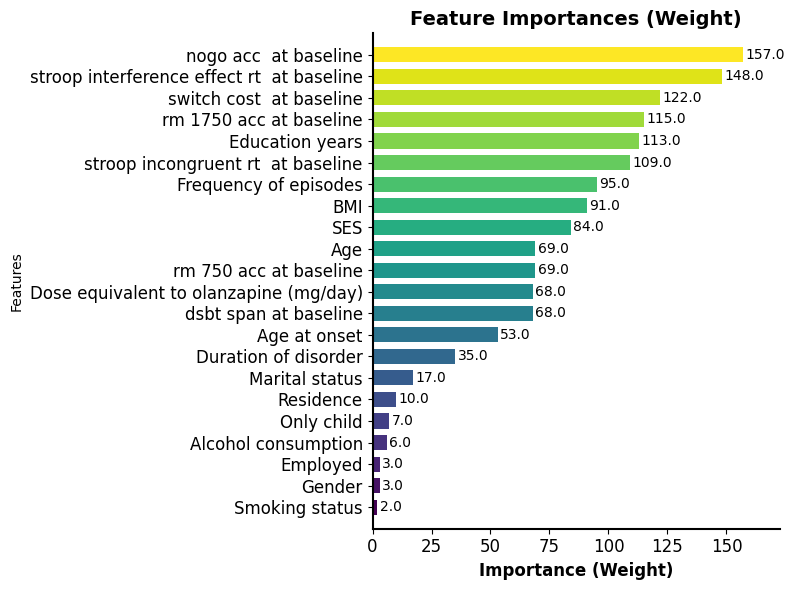

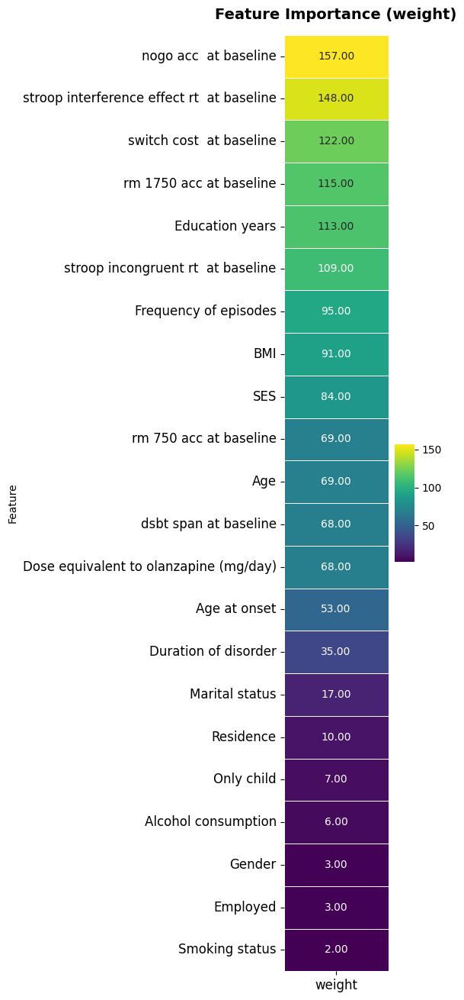

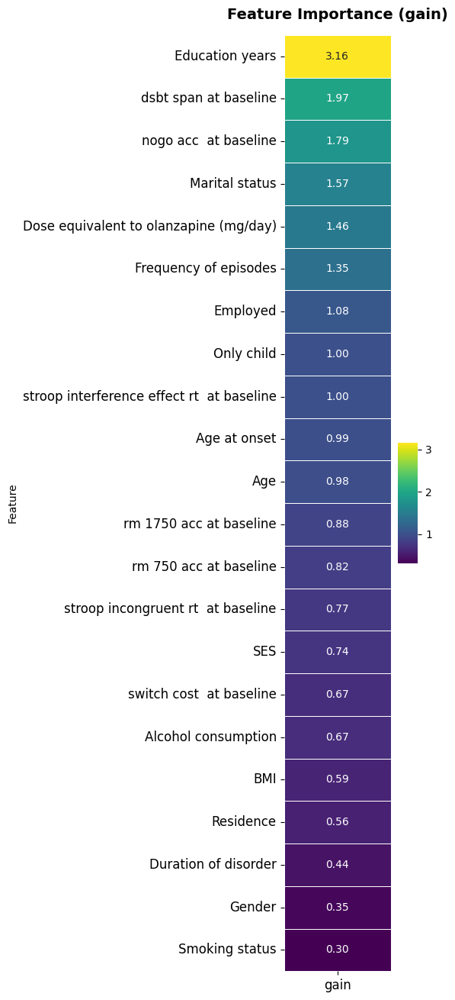

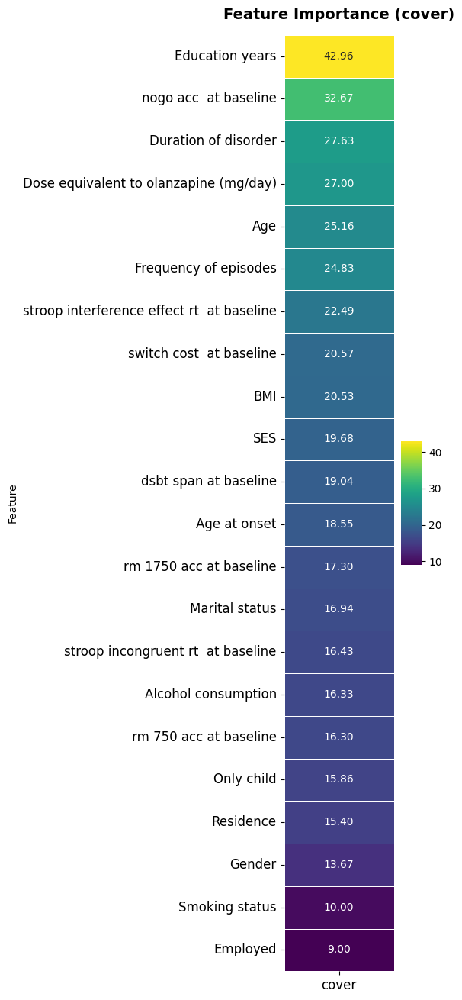

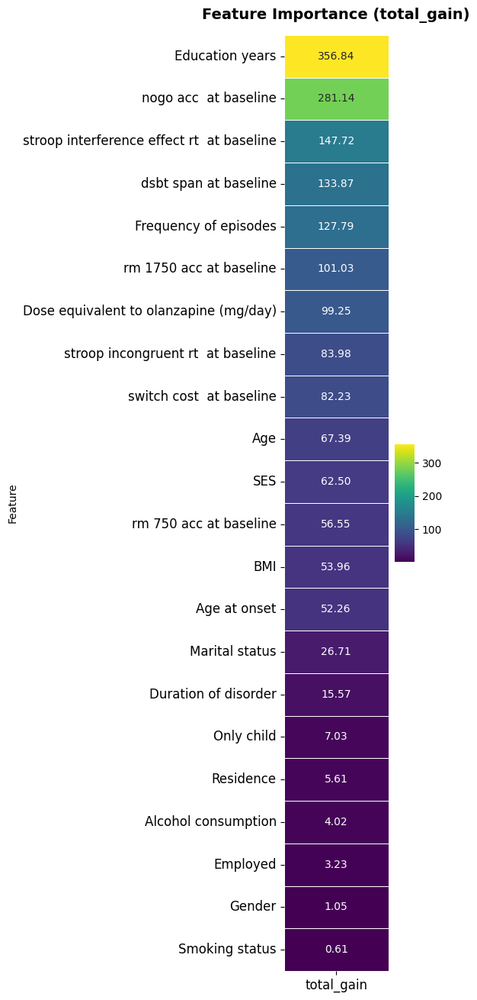

[I 2025-02-21 12:19:41,448] A new study created in memory with name: no-name-7223a97f-a019-45f1-a9df-0d67aaa3267c


全部特征测试集 MSE: 0.03
全部特征测试集 R²: 0.5181
全部特征 individual-level prediction errors 已保存
去除第 1 个特征: rm_1750_acc at baseline
去除第 1 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:19:44,197] Trial 21 finished with value: -0.17937389140462096 and parameters: {'n_estimators': 110, 'max_depth': 5, 'learning_rate': 0.204451030219351, 'subsample': 0.6182850056171197, 'colsample_bytree': 0.9543249137549312, 'gamma': 0.007858053967521445, 'reg_alpha': 0.012087985405652353, 'reg_lambda': 0.0011463891571340203, 'min_child_weight': 1}. Best is trial 21 with value: -0.17937389140462096.
[I 2025-02-21 12:19:46,333] Trial 12 finished with value: 0.17804211601924047 and parameters: {'n_estimators': 153, 'max_depth': 7, 'learning_rate': 0.011321036492466722, 'subsample': 0.527236141040772, 'colsample_bytree': 0.7208506904892069, 'gamma': 0.1323941162633567, 'reg_alpha': 0.0037868549141327522, 'reg_lambda': 0.5952407186250286, 'min

交叉验证结果已保存至 ./table/reduce_1！
最佳参数: {'n_estimators': 279, 'max_depth': 4, 'learning_rate': 0.021899170205340202, 'subsample': 0.9248989467949866, 'colsample_bytree': 0.40434101430508096, 'gamma': 0.5022539666528276, 'reg_alpha': 0.09245025375782596, 'reg_lambda': 0.02116689573508868, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_1/best_model.pkl


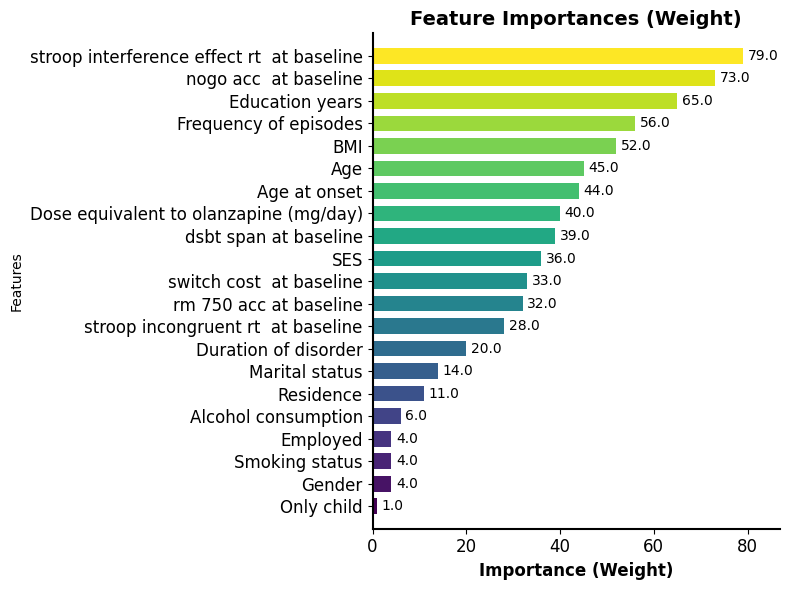

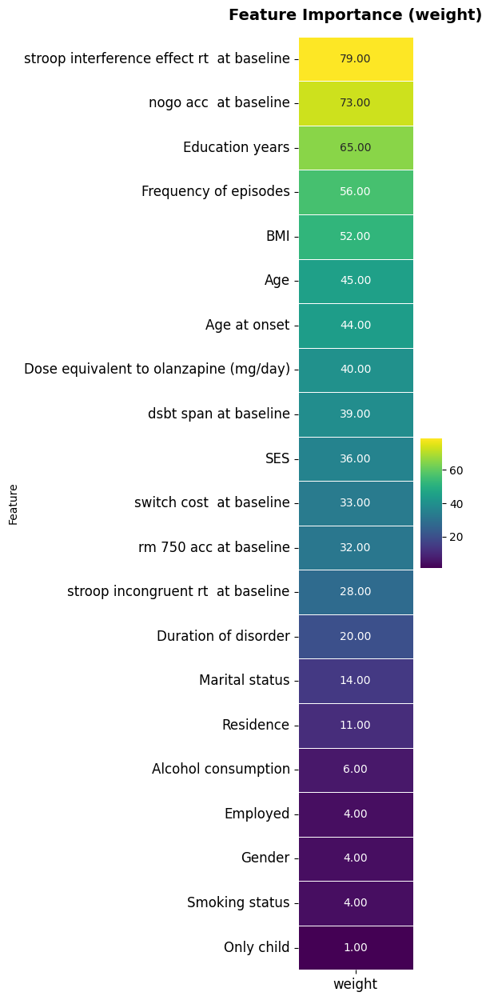

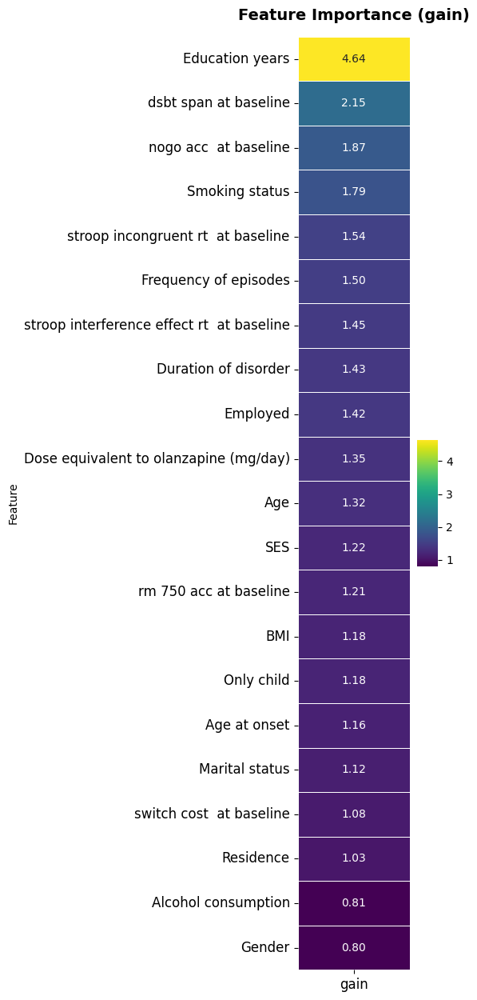

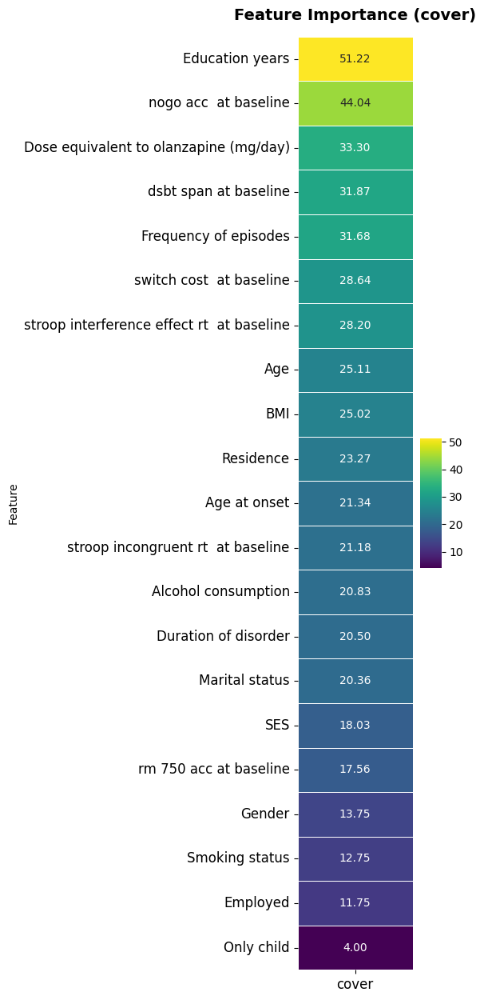

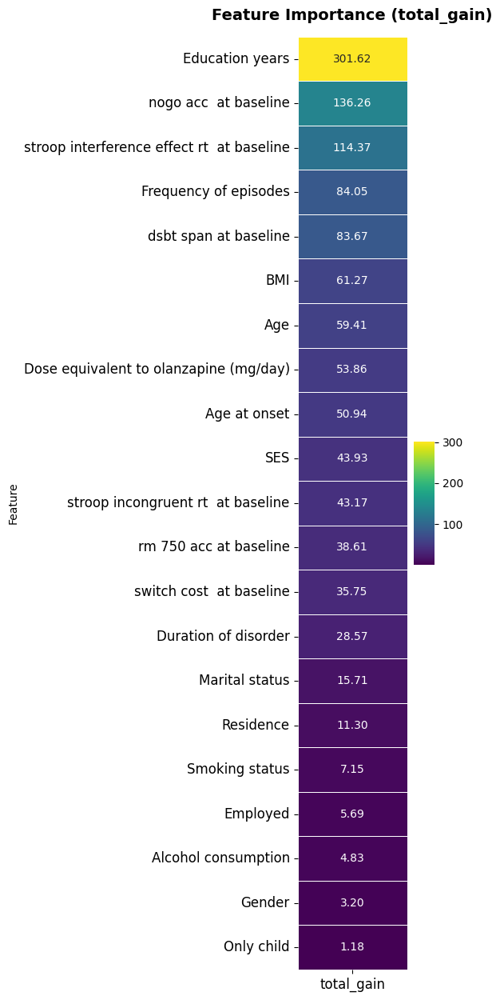

[I 2025-02-21 12:20:13,865] A new study created in memory with name: no-name-8204861b-9119-4b10-906a-befa549a43de


去除第 1 个特征测试集 MSE: 0.04
去除第 1 个特征测试集 R²: 0.4533
去除第 1 个特征 individual-level prediction errors 已保存
去除第 2 个特征: rm_750_acc at baseline
去除第 2 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:20:17,863] Trial 4 finished with value: 0.07399796488994022 and parameters: {'n_estimators': 104, 'max_depth': 3, 'learning_rate': 0.05432070463070861, 'subsample': 0.6828124392216642, 'colsample_bytree': 0.7552929558631727, 'gamma': 0.11404345997248377, 'reg_alpha': 0.0012223981789567064, 'reg_lambda': 0.12409562432199549, 'min_child_weight': 3}. Best is trial 4 with value: 0.07399796488994022.
[I 2025-02-21 12:20:18,807] Trial 12 finished with value: 0.18217496965100566 and parameters: {'n_estimators': 117, 'max_depth': 8, 'learning_rate': 0.013246893490701144, 'subsample': 0.5106048252056152, 'colsample_bytree': 0.8358234906356099, 'gamma': 0.06388272514209367, 'reg_alpha': 0.05101352844088474, 'reg_lambda': 0.020395641941917845, 'min_c

交叉验证结果已保存至 ./table/reduce_2！
最佳参数: {'n_estimators': 451, 'max_depth': 8, 'learning_rate': 0.010309403320231723, 'subsample': 0.8563506293357535, 'colsample_bytree': 0.34429397003061524, 'gamma': 0.053173395355542885, 'reg_alpha': 0.5533766143376938, 'reg_lambda': 0.005288335352625377, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_2/best_model.pkl


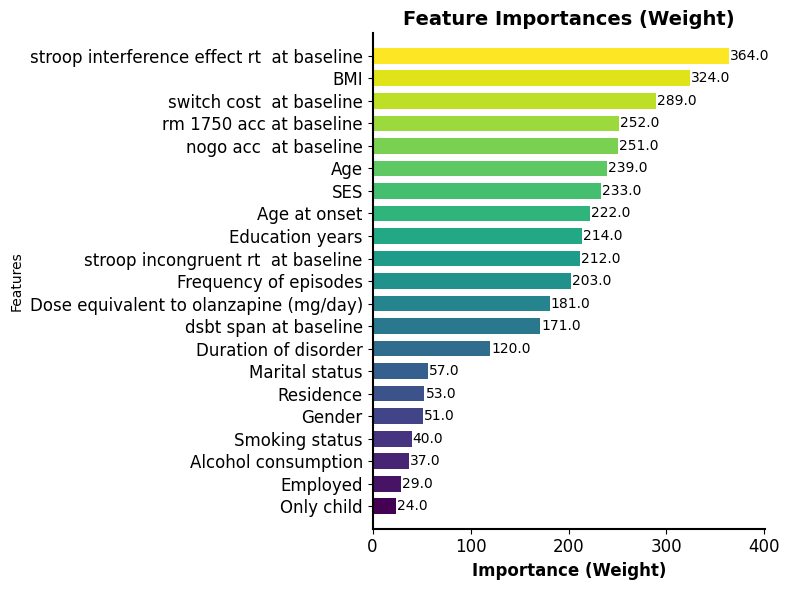

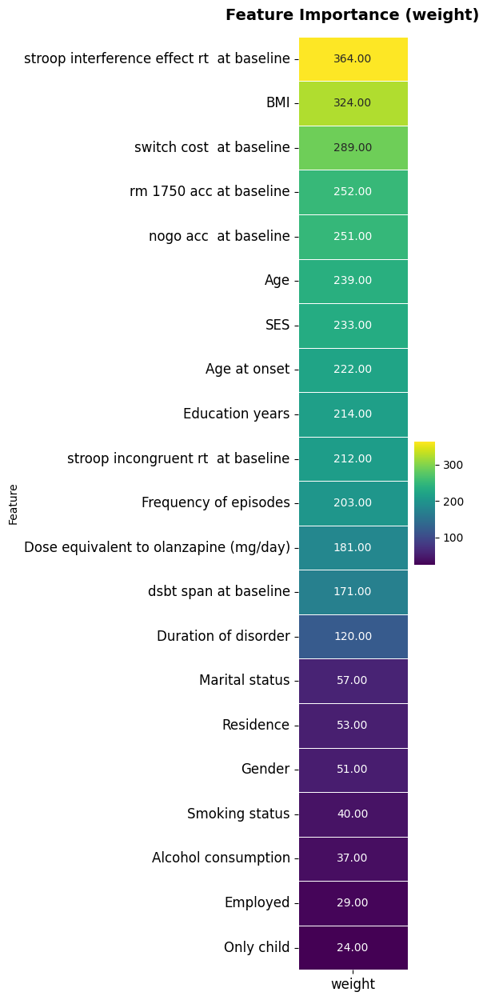

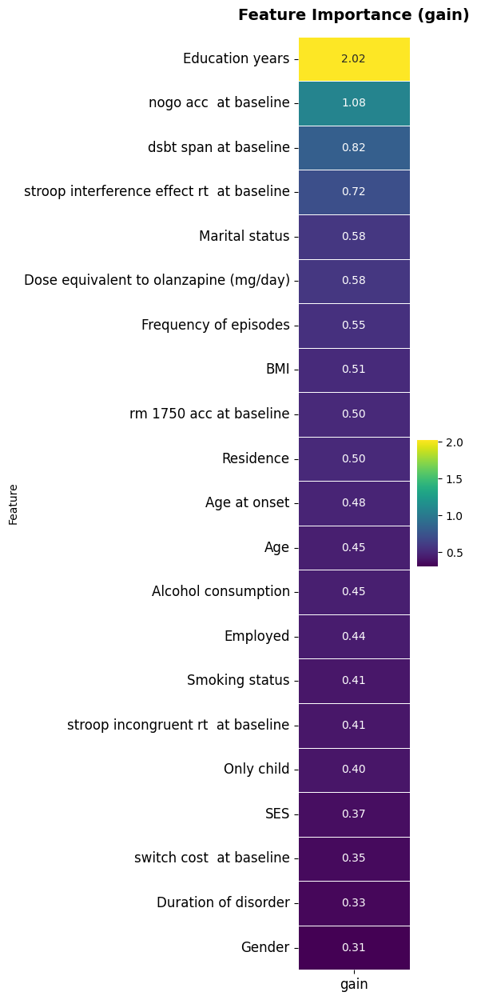

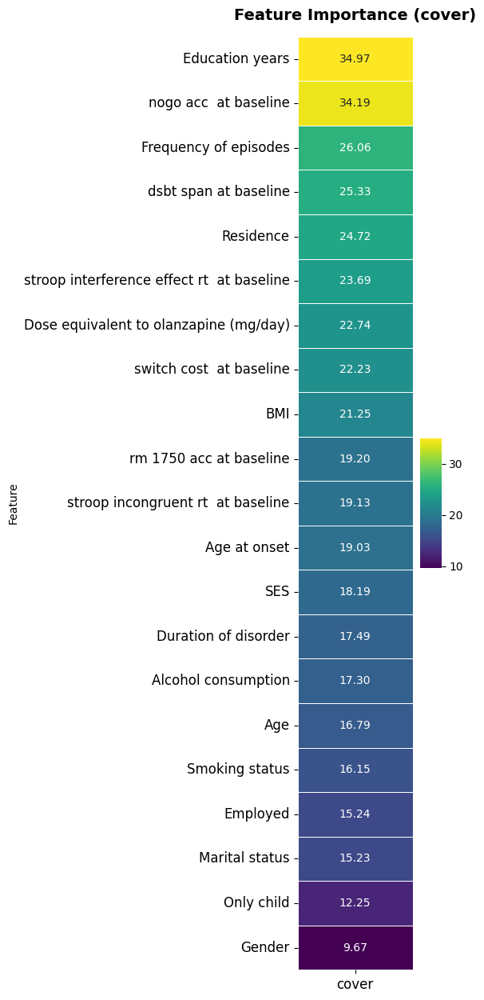

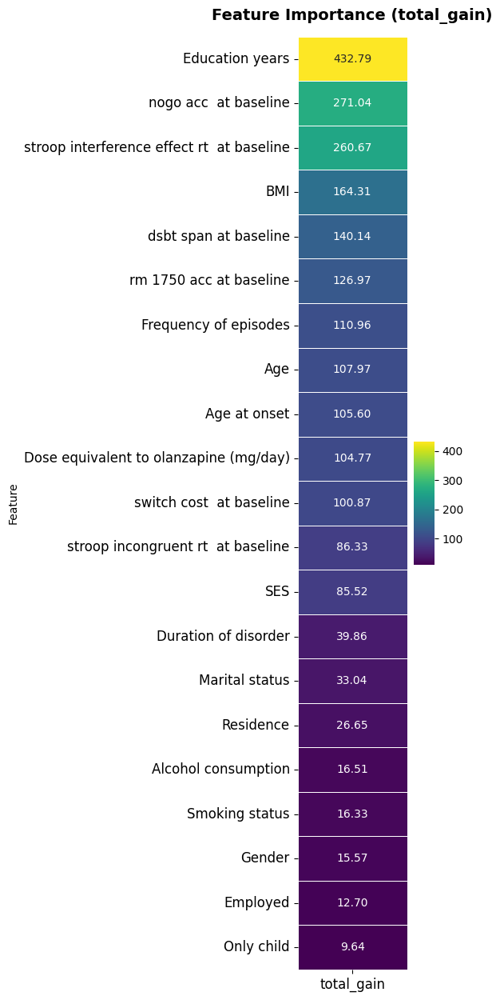

[I 2025-02-21 12:20:54,888] A new study created in memory with name: no-name-7dbd39c9-79c8-4149-9fc8-59c1d8126974


去除第 2 个特征测试集 MSE: 0.04
去除第 2 个特征测试集 R²: 0.4119
去除第 2 个特征 individual-level prediction errors 已保存
去除第 3 个特征: stroop_incongruent_rt  at baseline
去除第 3 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:20:59,397] Trial 6 finished with value: 0.19996658582417323 and parameters: {'n_estimators': 256, 'max_depth': 4, 'learning_rate': 0.291969767539372, 'subsample': 0.8250299311497691, 'colsample_bytree': 0.7074806643738187, 'gamma': 0.10645353929117453, 'reg_alpha': 0.05086099167719045, 'reg_lambda': 0.03464549027566013, 'min_child_weight': 3}. Best is trial 6 with value: 0.19996658582417323.
[I 2025-02-21 12:20:59,559] Trial 26 finished with value: 0.1769706490636243 and parameters: {'n_estimators': 102, 'max_depth': 6, 'learning_rate': 0.0360648442114737, 'subsample': 0.7180926895756423, 'colsample_bytree': 0.8553810563385229, 'gamma': 0.10329763181052033, 'reg_alpha': 0.013431394772384263, 'reg_lambda': 0.2991275470412225, 'min_child_wei

交叉验证结果已保存至 ./table/reduce_3！
最佳参数: {'n_estimators': 183, 'max_depth': 9, 'learning_rate': 0.01991106510939095, 'subsample': 0.9419285677303694, 'colsample_bytree': 0.3655072809679044, 'gamma': 0.16386409836324276, 'reg_alpha': 0.0010052326138855147, 'reg_lambda': 0.19568680383905704, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_3/best_model.pkl


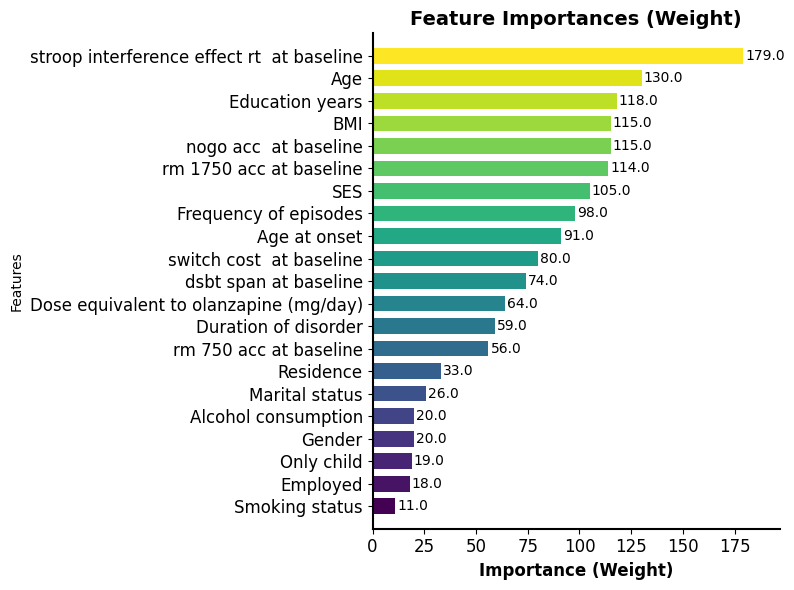

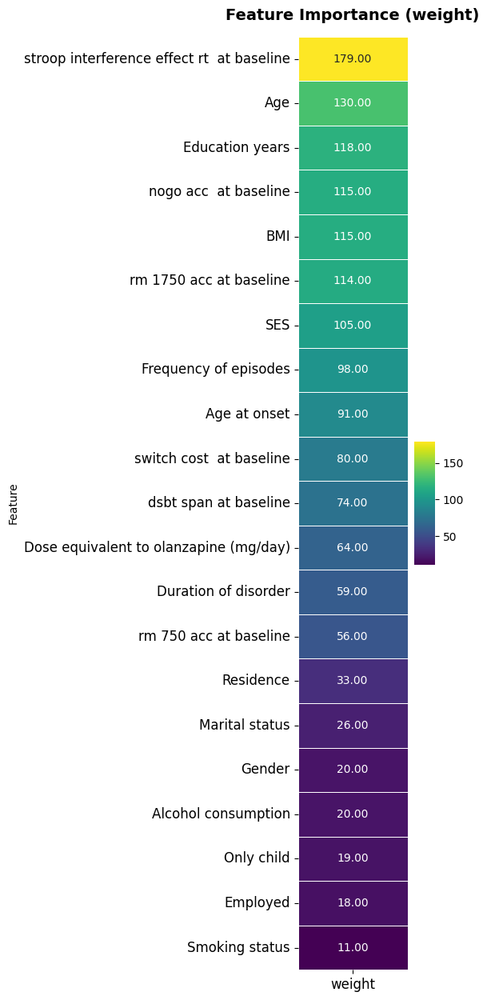

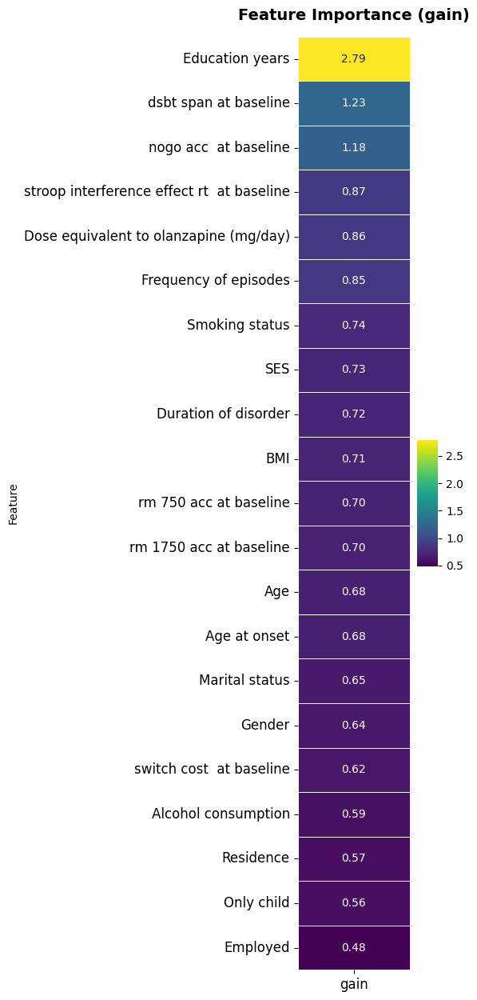

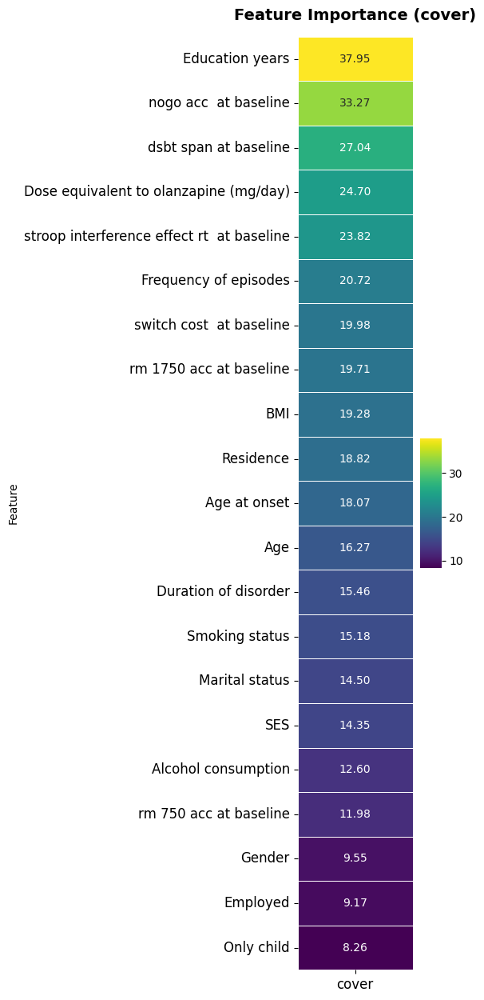

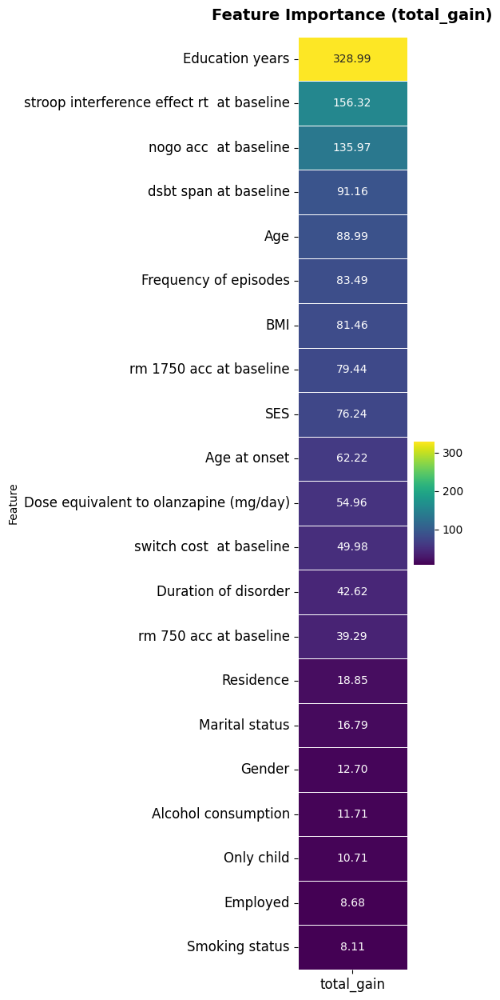

[I 2025-02-21 12:21:28,293] A new study created in memory with name: no-name-acd571df-2f4c-4607-85a2-8154b3d58153


去除第 3 个特征测试集 MSE: 0.04
去除第 3 个特征测试集 R²: 0.4751
去除第 3 个特征 individual-level prediction errors 已保存
去除第 4 个特征: stroop_interference_effect_rt  at baseline
去除第 4 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:21:31,006] Trial 1 finished with value: 0.1940137892728643 and parameters: {'n_estimators': 106, 'max_depth': 3, 'learning_rate': 0.07120668120567432, 'subsample': 0.9104249661028062, 'colsample_bytree': 0.6316156954564597, 'gamma': 0.7275283568903788, 'reg_alpha': 0.2680082885236446, 'reg_lambda': 0.00100214009632476, 'min_child_weight': 3}. Best is trial 1 with value: 0.1940137892728643.
[I 2025-02-21 12:21:31,638] Trial 18 finished with value: -0.13830757435240143 and parameters: {'n_estimators': 120, 'max_depth': 4, 'learning_rate': 0.25873858967680613, 'subsample': 0.5057247781553098, 'colsample_bytree': 0.6457780201624305, 'gamma': 0.0019604760739658734, 'reg_alpha': 0.00421733062765706, 'reg_lambda': 0.24698038236011877, 'min_child_

交叉验证结果已保存至 ./table/reduce_4！
最佳参数: {'n_estimators': 159, 'max_depth': 5, 'learning_rate': 0.018226948565302686, 'subsample': 0.834584430218881, 'colsample_bytree': 0.6592614563183306, 'gamma': 0.004021101938274039, 'reg_alpha': 0.0088260831065835, 'reg_lambda': 0.0037958022273286715, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_4/best_model.pkl


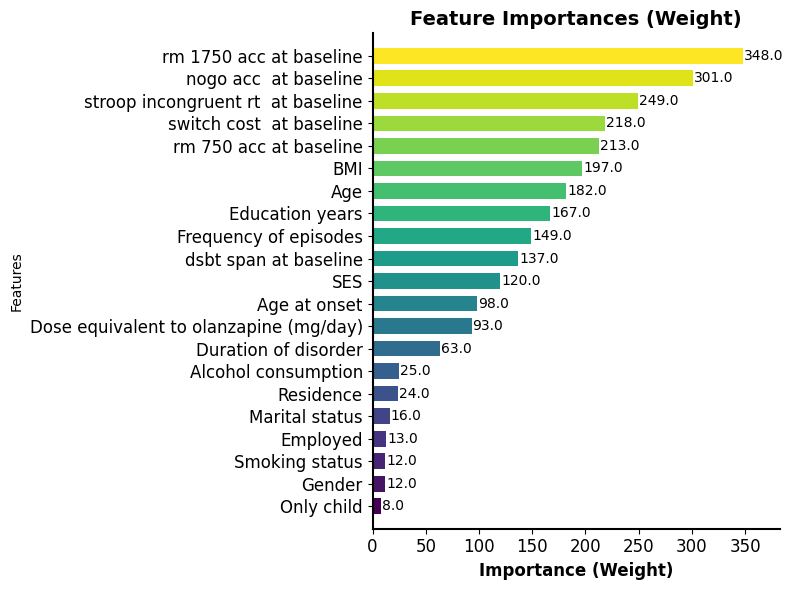

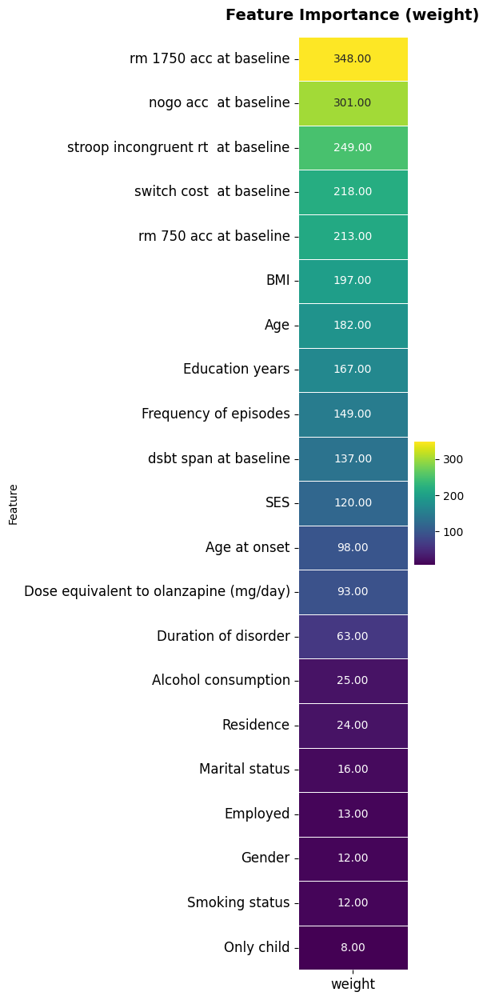

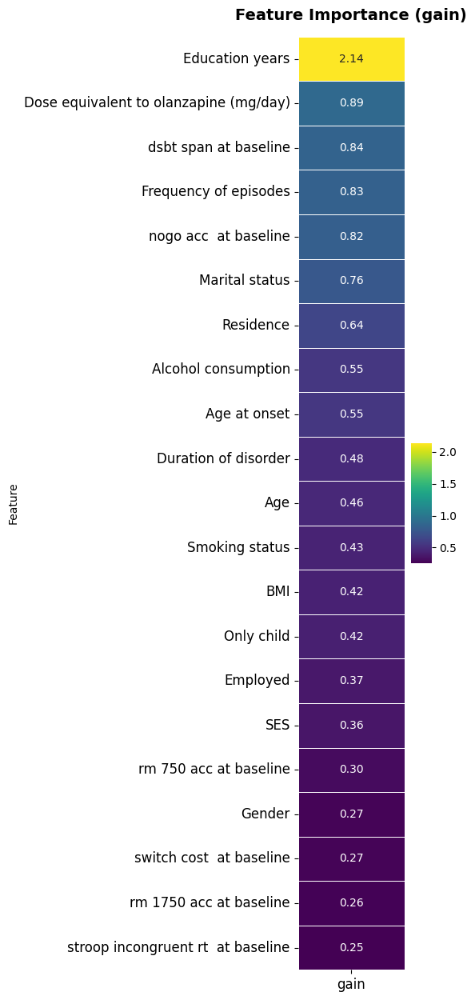

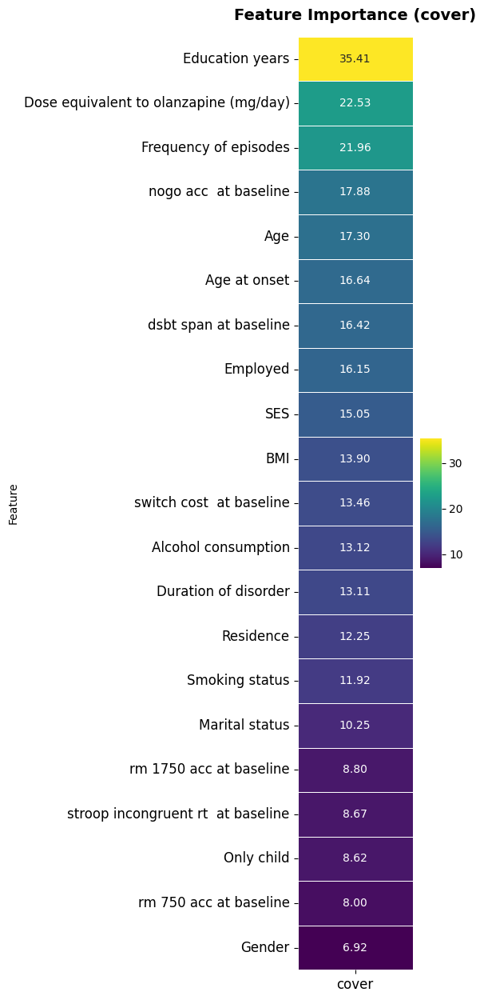

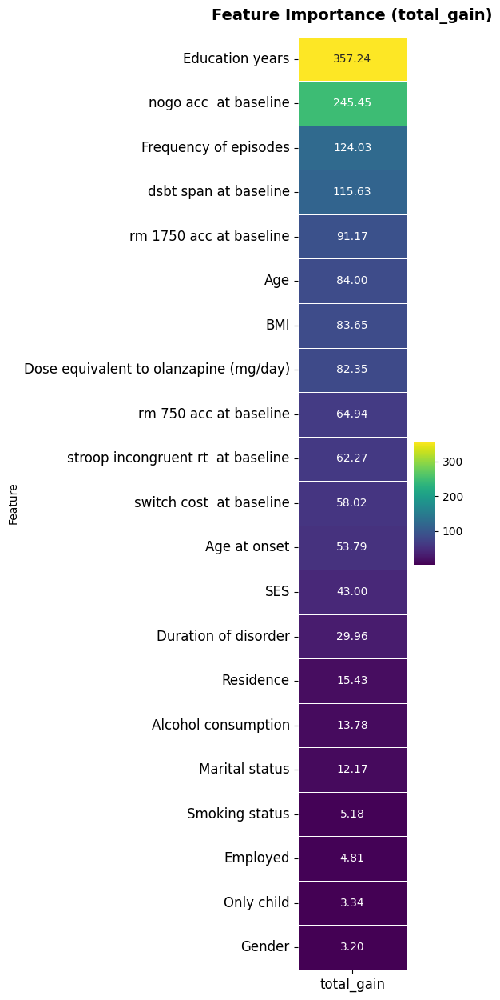

[I 2025-02-21 12:22:05,497] A new study created in memory with name: no-name-6eea170d-451c-4bf0-836a-80c794762ef1


去除第 4 个特征测试集 MSE: 0.04
去除第 4 个特征测试集 R²: 0.4292
去除第 4 个特征 individual-level prediction errors 已保存
去除第 5 个特征: nogo_acc  at baseline
去除第 5 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:22:08,718] Trial 6 finished with value: 0.08983099621396622 and parameters: {'n_estimators': 109, 'max_depth': 5, 'learning_rate': 0.013581721329026129, 'subsample': 0.5838837732289428, 'colsample_bytree': 0.9768661538390306, 'gamma': 0.1351042306053447, 'reg_alpha': 0.00597220089123829, 'reg_lambda': 0.0038916764396240153, 'min_child_weight': 9}. Best is trial 6 with value: 0.08983099621396622.
[I 2025-02-21 12:22:08,838] Trial 14 finished with value: -0.23197407658127273 and parameters: {'n_estimators': 172, 'max_depth': 8, 'learning_rate': 0.23382378336823553, 'subsample': 0.5809398295338823, 'colsample_bytree': 0.3756449947547502, 'gamma': 0.557578081043429, 'reg_alpha': 0.016186005090517968, 'reg_lambda': 0.00925694537166136, 'min_chi

交叉验证结果已保存至 ./table/reduce_5！
最佳参数: {'n_estimators': 265, 'max_depth': 10, 'learning_rate': 0.01518115930465277, 'subsample': 0.7911837085223064, 'colsample_bytree': 0.301632183629248, 'gamma': 0.3277641468785342, 'reg_alpha': 0.0027769501193793235, 'reg_lambda': 0.1843870387762594, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_5/best_model.pkl


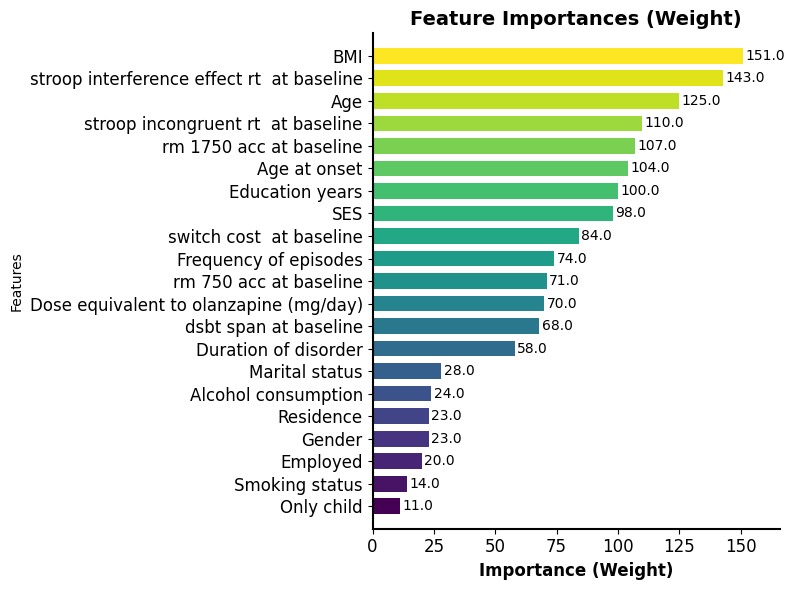

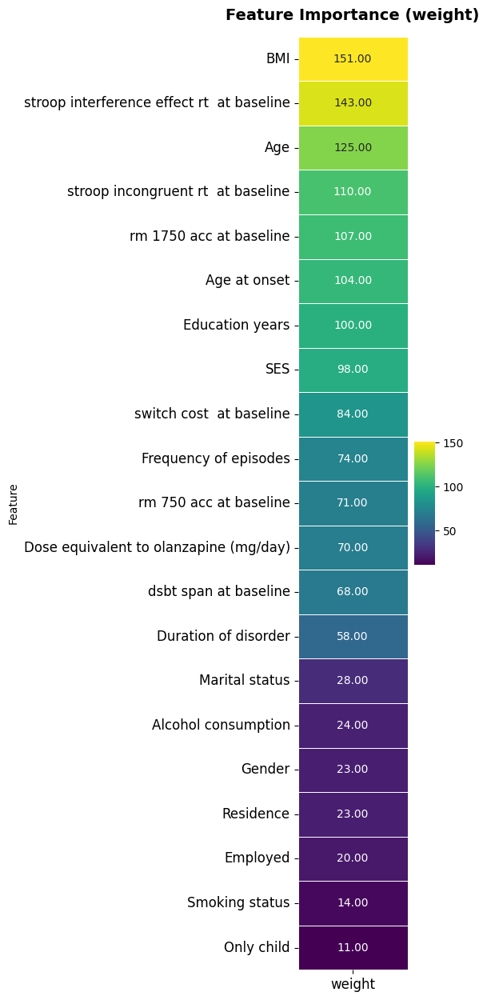

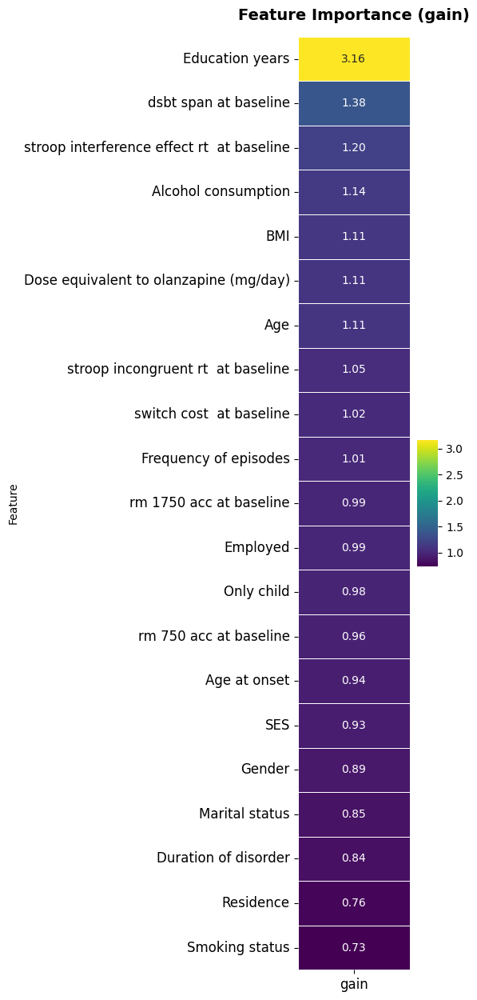

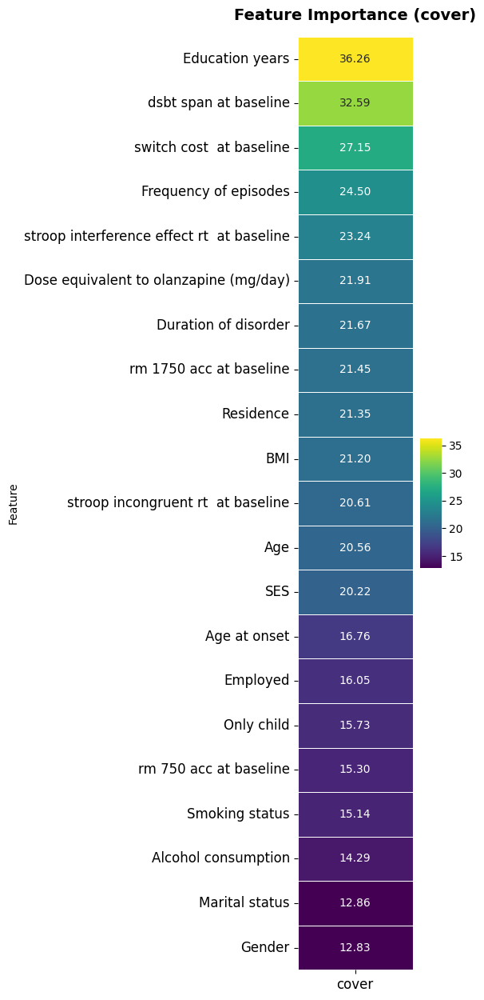

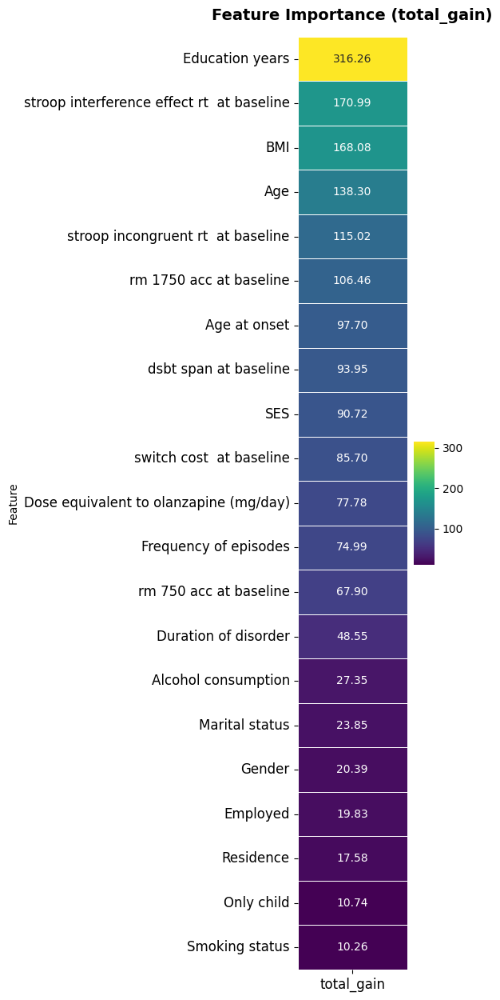

[I 2025-02-21 12:22:46,174] A new study created in memory with name: no-name-909ff70f-7731-4a6f-bb74-017a4de5f360


去除第 5 个特征测试集 MSE: 0.05
去除第 5 个特征测试集 R²: 0.3608
去除第 5 个特征 individual-level prediction errors 已保存
去除第 6 个特征: switch_cost  at baseline
去除第 6 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:22:50,477] Trial 6 finished with value: 0.10999394167053252 and parameters: {'n_estimators': 241, 'max_depth': 5, 'learning_rate': 0.19846830948089608, 'subsample': 0.8331207124970317, 'colsample_bytree': 0.5255143260349687, 'gamma': 0.28310992604887053, 'reg_alpha': 0.2587322587583605, 'reg_lambda': 0.007816759715011407, 'min_child_weight': 6}. Best is trial 6 with value: 0.10999394167053252.
[I 2025-02-21 12:22:50,706] Trial 24 finished with value: 0.1311772450484176 and parameters: {'n_estimators': 202, 'max_depth': 10, 'learning_rate': 0.14656876428813967, 'subsample': 0.8766367926464878, 'colsample_bytree': 0.6625348920726031, 'gamma': 0.35288819666158766, 'reg_alpha': 0.30505170662100767, 'reg_lambda': 0.0010545298998315708, 'min_chi

交叉验证结果已保存至 ./table/reduce_6！
最佳参数: {'n_estimators': 414, 'max_depth': 4, 'learning_rate': 0.03748685051661066, 'subsample': 0.9425183752032854, 'colsample_bytree': 0.9932574578393482, 'gamma': 0.9769786439269652, 'reg_alpha': 0.5692991209312088, 'reg_lambda': 0.06027317444410272, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_6/best_model.pkl


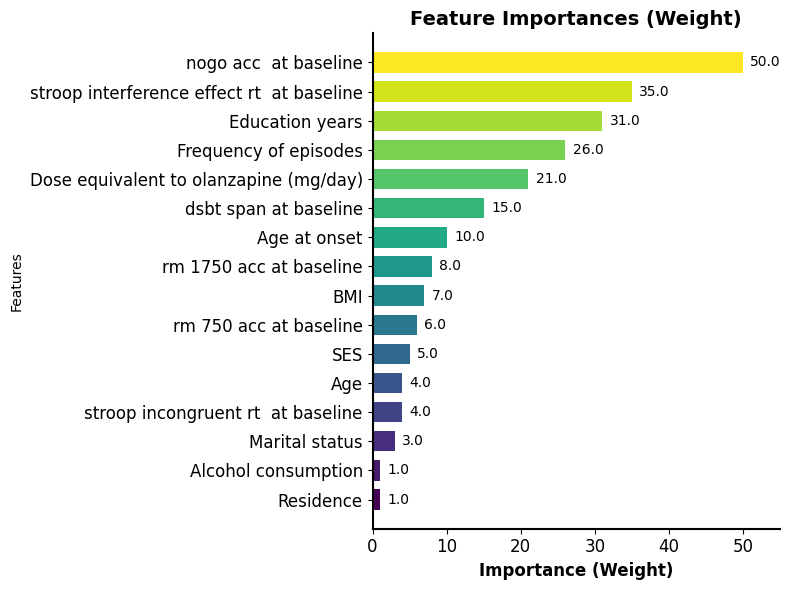

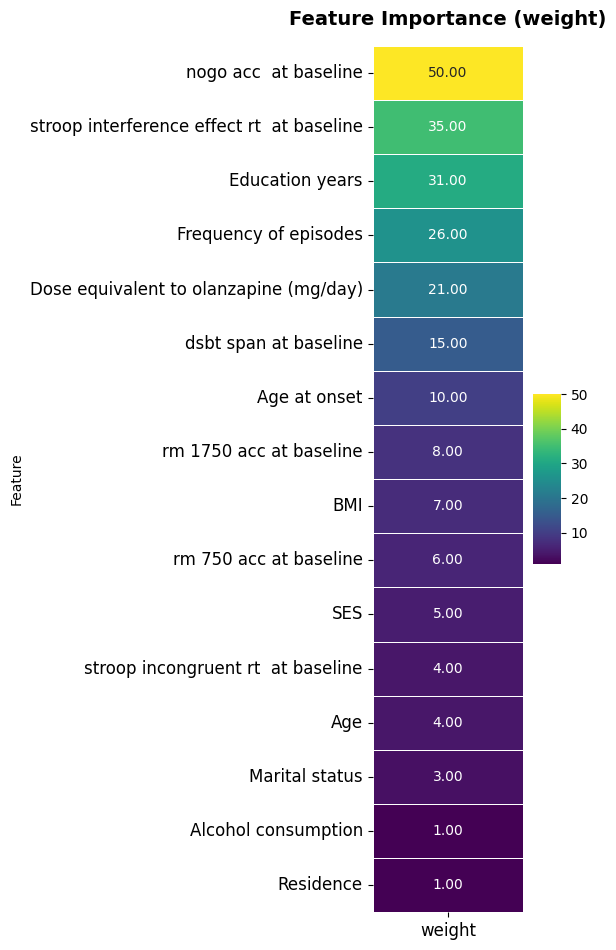

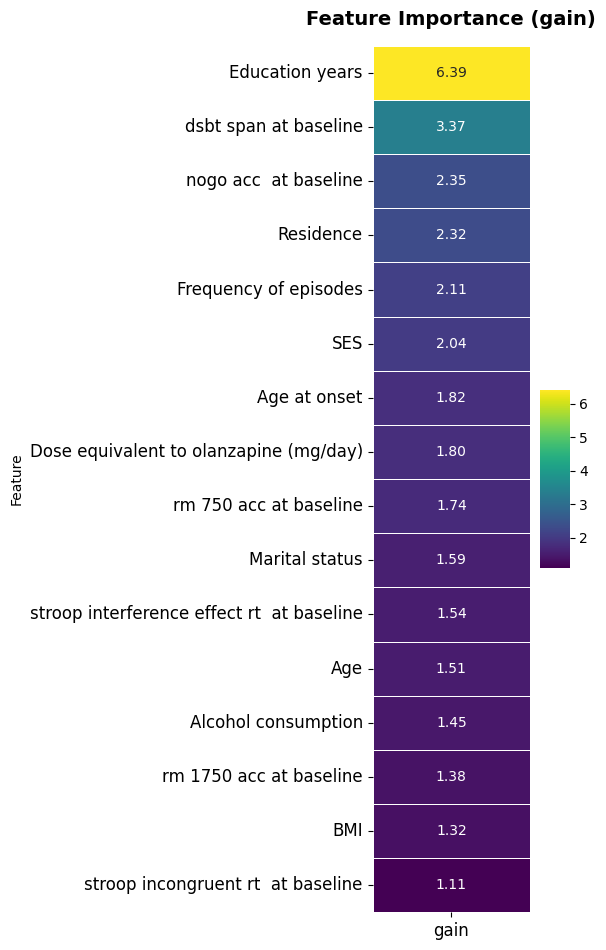

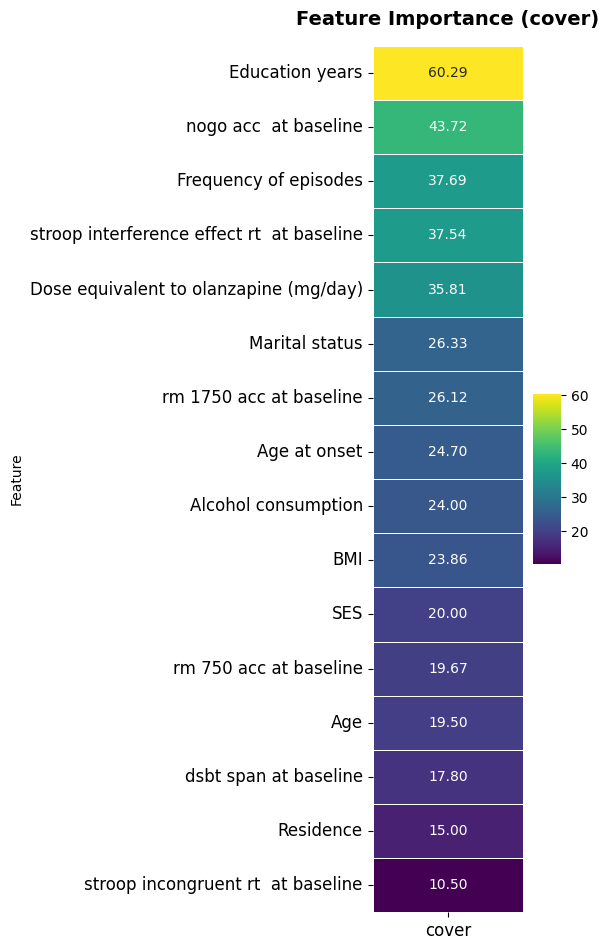

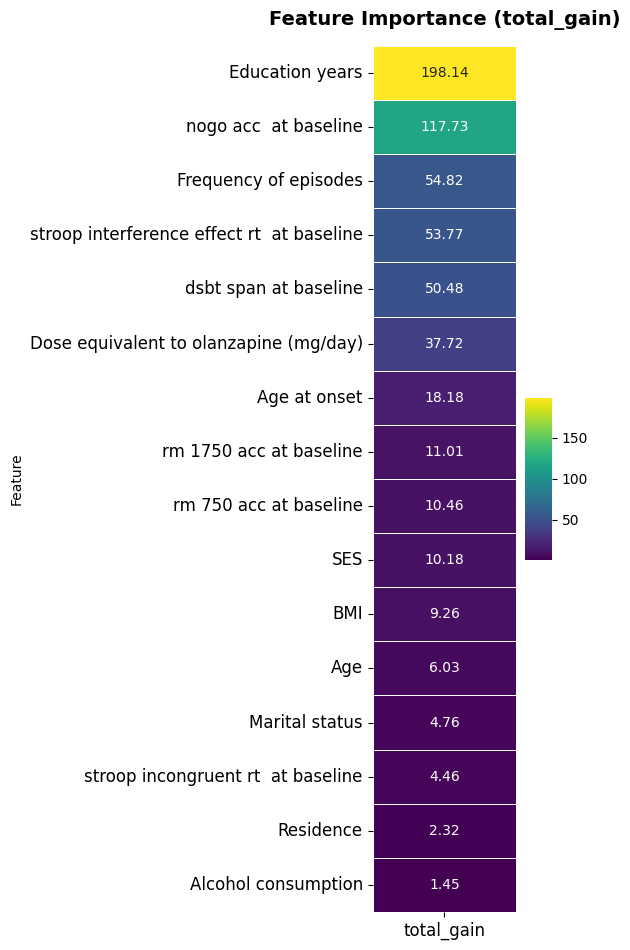

[I 2025-02-21 12:23:23,159] A new study created in memory with name: no-name-69d4022a-a98d-467d-8e80-76f7344c06ef


去除第 6 个特征测试集 MSE: 0.04
去除第 6 个特征测试集 R²: 0.4993
去除第 6 个特征 individual-level prediction errors 已保存
去除第 7 个特征: dsbt_span at baseline
去除第 7 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:23:26,465] Trial 10 finished with value: -0.074717998531069 and parameters: {'n_estimators': 144, 'max_depth': 7, 'learning_rate': 0.18798365663119543, 'subsample': 0.5802660265822762, 'colsample_bytree': 0.8023953185976034, 'gamma': 0.12181012835905448, 'reg_alpha': 0.06403536316485166, 'reg_lambda': 0.049601766361834686, 'min_child_weight': 5}. Best is trial 10 with value: -0.074717998531069.
[I 2025-02-21 12:23:26,635] Trial 30 finished with value: 0.09445289253902453 and parameters: {'n_estimators': 174, 'max_depth': 5, 'learning_rate': 0.23356301281130767, 'subsample': 0.8964411320801016, 'colsample_bytree': 0.6707220607815634, 'gamma': 0.0019530956469014454, 'reg_alpha': 0.003320539473074901, 'reg_lambda': 0.09207103585787582, 'min_c

交叉验证结果已保存至 ./table/reduce_7！
最佳参数: {'n_estimators': 103, 'max_depth': 4, 'learning_rate': 0.020760418128330405, 'subsample': 0.8552933971484002, 'colsample_bytree': 0.7580700767858723, 'gamma': 0.05031751899391541, 'reg_alpha': 0.030231108889687067, 'reg_lambda': 0.009743838051099359, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_7/best_model.pkl


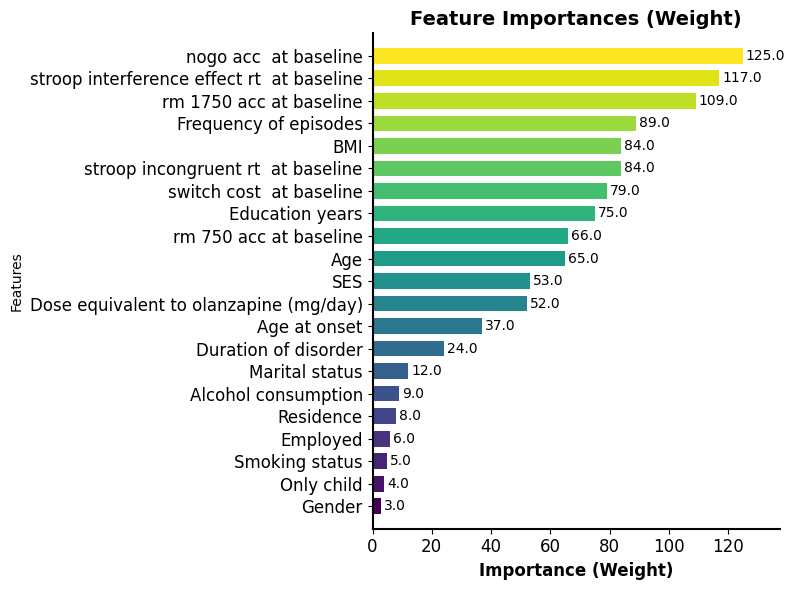

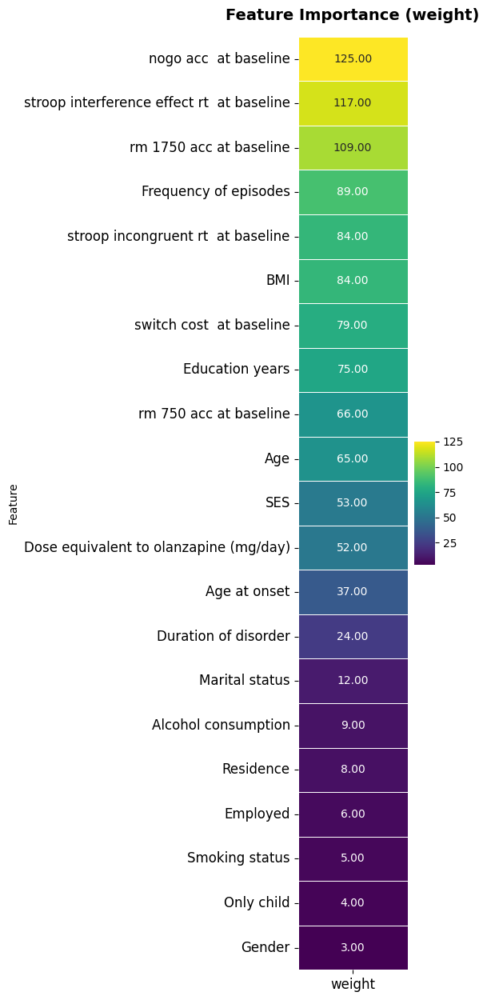

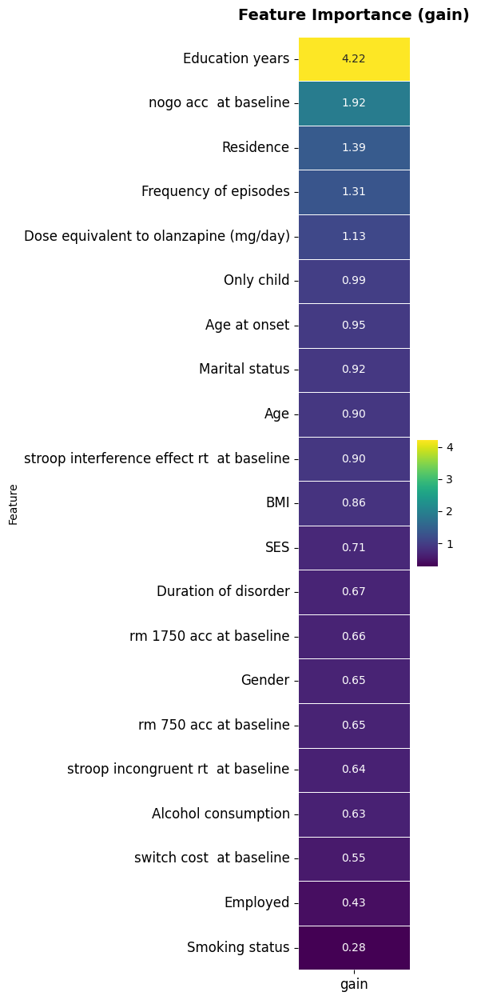

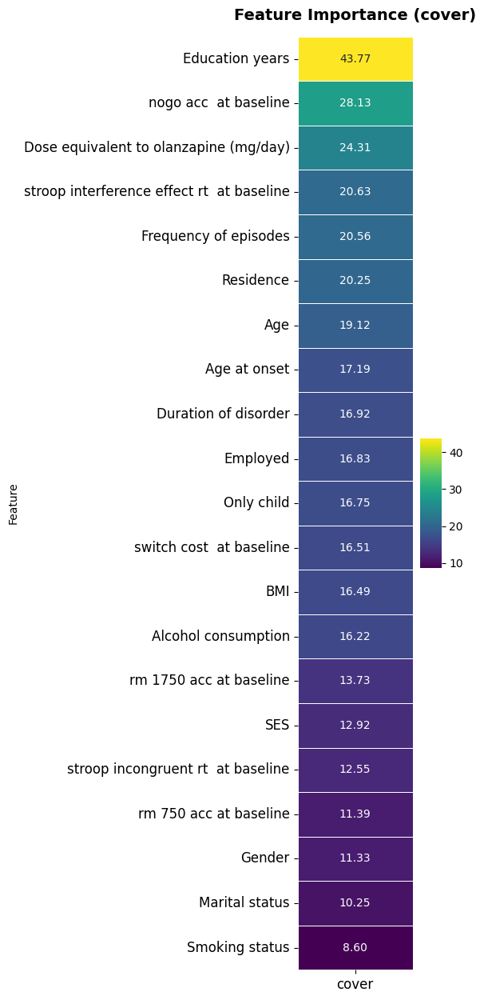

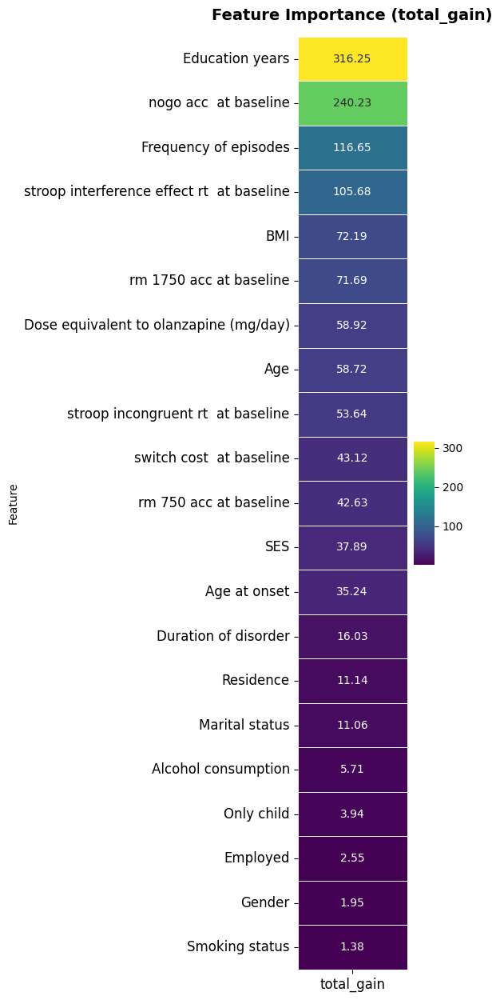

[I 2025-02-21 12:23:57,132] A new study created in memory with name: no-name-dbfc4d49-e7d0-4ec6-901f-3948631b7b5d


去除第 7 个特征测试集 MSE: 0.04
去除第 7 个特征测试集 R²: 0.4054
去除第 7 个特征 individual-level prediction errors 已保存
去除第 8 个特征: Age
去除第 8 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:24:00,530] Trial 14 finished with value: 0.2508285527344862 and parameters: {'n_estimators': 114, 'max_depth': 4, 'learning_rate': 0.17057897008900152, 'subsample': 0.8171250664057171, 'colsample_bytree': 0.4232621648108483, 'gamma': 0.005099414282207483, 'reg_alpha': 0.001273676998955402, 'reg_lambda': 0.021651672022441795, 'min_child_weight': 1}. Best is trial 14 with value: 0.2508285527344862.
[I 2025-02-21 12:24:01,724] Trial 6 finished with value: 0.09174129998639384 and parameters: {'n_estimators': 116, 'max_depth': 9, 'learning_rate': 0.15382889770366054, 'subsample': 0.5218631936992846, 'colsample_bytree': 0.43721432896301854, 'gamma': 0.0019002404643316292, 'reg_alpha': 0.10443126232270236, 'reg_lambda': 0.055653451186418124, 'min

交叉验证结果已保存至 ./table/reduce_8！
最佳参数: {'n_estimators': 138, 'max_depth': 6, 'learning_rate': 0.1402732493597354, 'subsample': 0.9440258066284231, 'colsample_bytree': 0.5938765793498306, 'gamma': 0.5322926363448813, 'reg_alpha': 0.0020851173649150644, 'reg_lambda': 0.007314685420347939, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_8/best_model.pkl


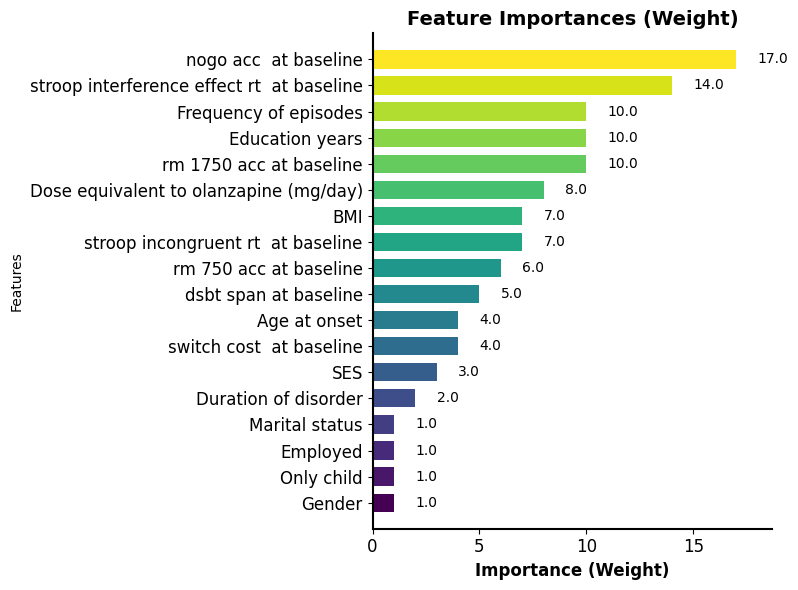

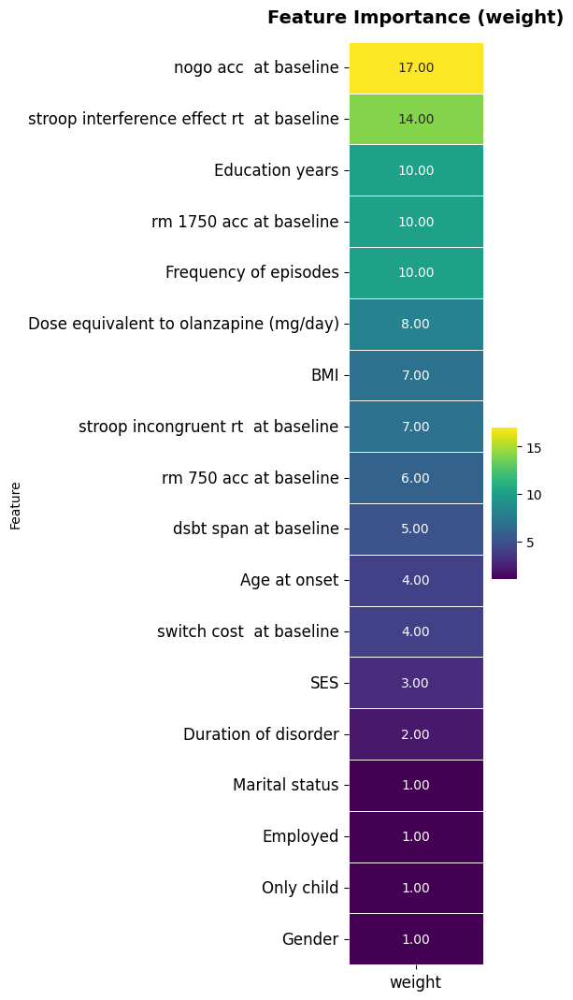

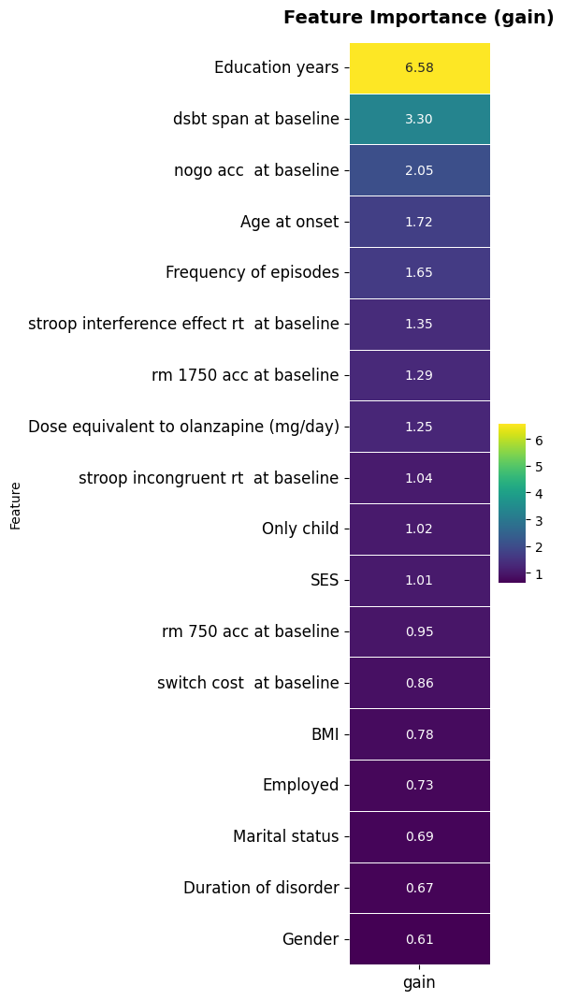

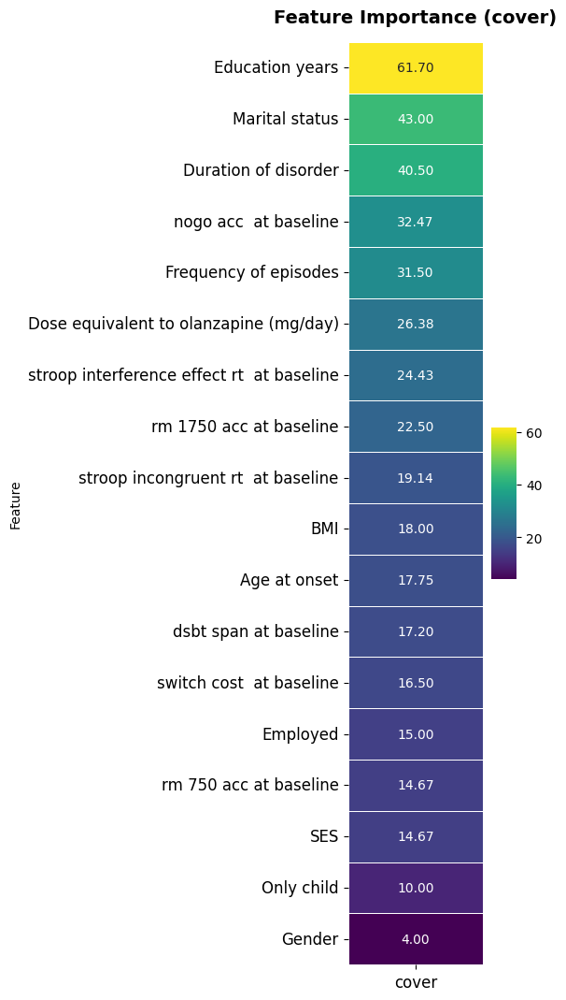

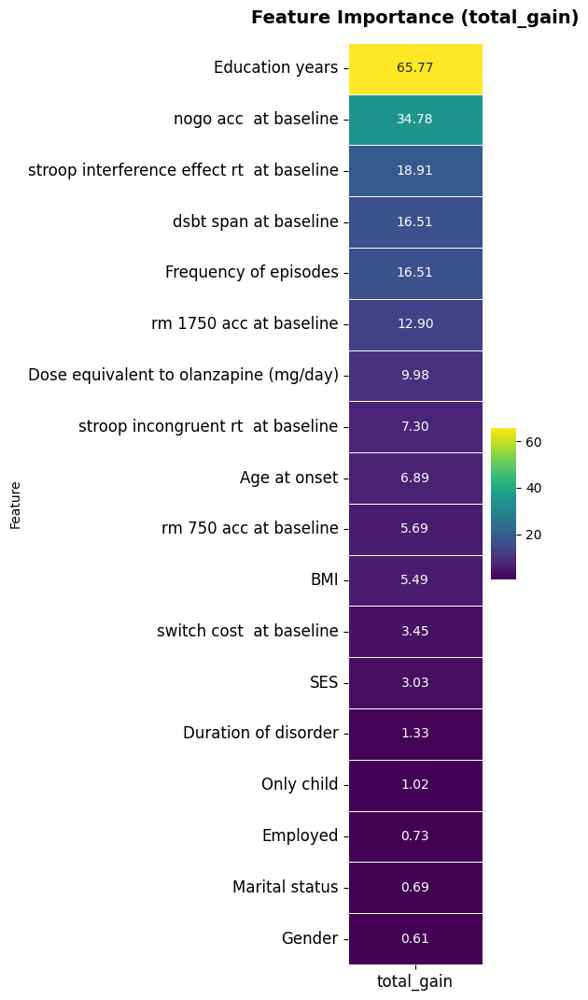

[I 2025-02-21 12:24:28,536] A new study created in memory with name: no-name-10743017-3b06-4ca7-8880-735f50c0c1b4


去除第 8 个特征测试集 MSE: 0.04
去除第 8 个特征测试集 R²: 0.5050
去除第 8 个特征 individual-level prediction errors 已保存
去除第 9 个特征: Education years
去除第 9 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:24:32,193] Trial 14 finished with value: 0.1064306486933823 and parameters: {'n_estimators': 100, 'max_depth': 8, 'learning_rate': 0.01300116014036034, 'subsample': 0.5204957144322989, 'colsample_bytree': 0.931060260713122, 'gamma': 0.1384027432173345, 'reg_alpha': 0.0031876187329624855, 'reg_lambda': 0.012777306616464904, 'min_child_weight': 8}. Best is trial 14 with value: 0.1064306486933823.
[I 2025-02-21 12:24:32,368] Trial 1 finished with value: 0.11213223772347916 and parameters: {'n_estimators': 104, 'max_depth': 10, 'learning_rate': 0.0171434846622778, 'subsample': 0.5010769983940853, 'colsample_bytree': 0.6774540702287339, 'gamma': 0.029935501186326086, 'reg_alpha': 0.6759427423515644, 'reg_lambda': 0.01861020659949775, 'min_child

交叉验证结果已保存至 ./table/reduce_9！
最佳参数: {'n_estimators': 196, 'max_depth': 6, 'learning_rate': 0.017112341216515763, 'subsample': 0.5860861764343095, 'colsample_bytree': 0.347161364947624, 'gamma': 0.004974863753011656, 'reg_alpha': 0.094537522479284, 'reg_lambda': 0.15149468661771934, 'min_child_weight': 7}
最佳模型已保存至 ./table/reduce_9/best_model.pkl


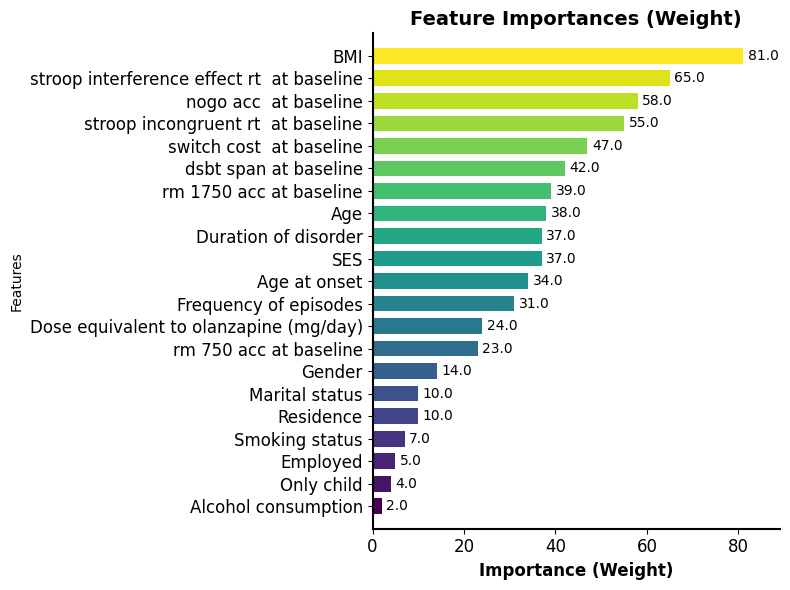

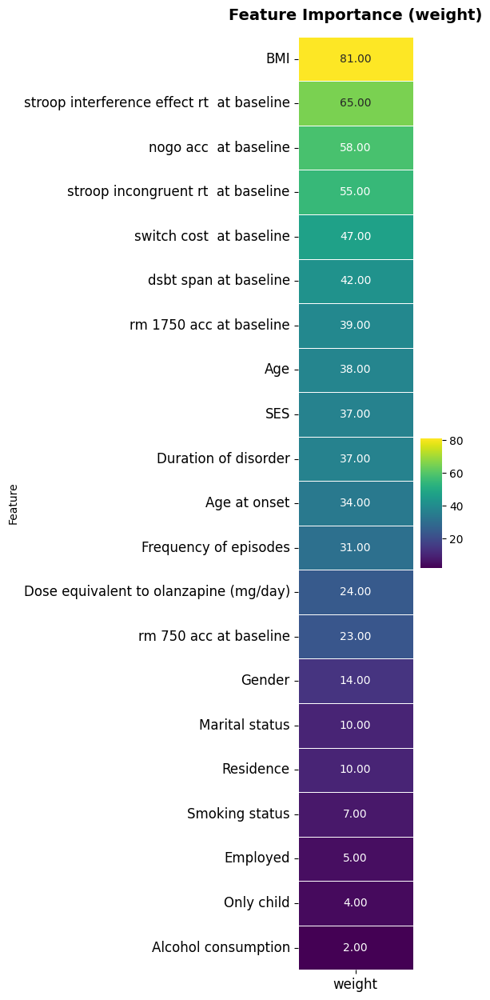

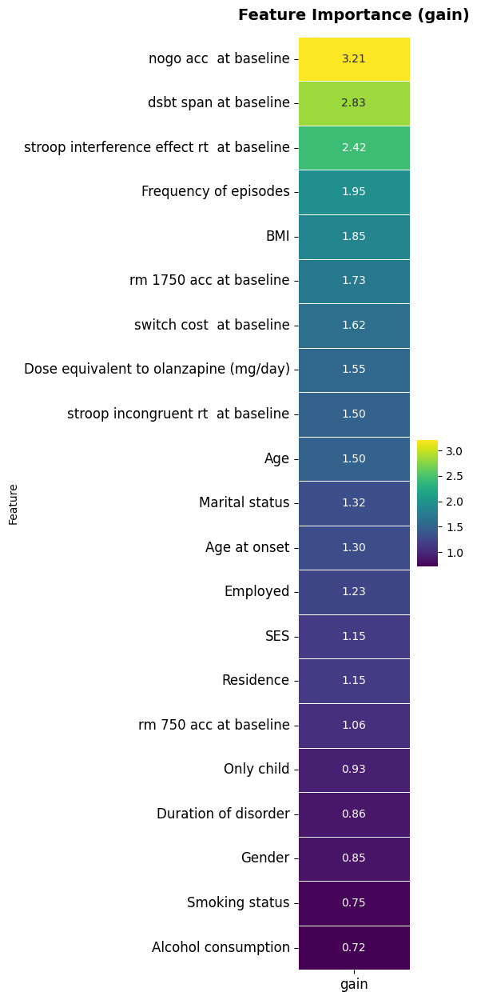

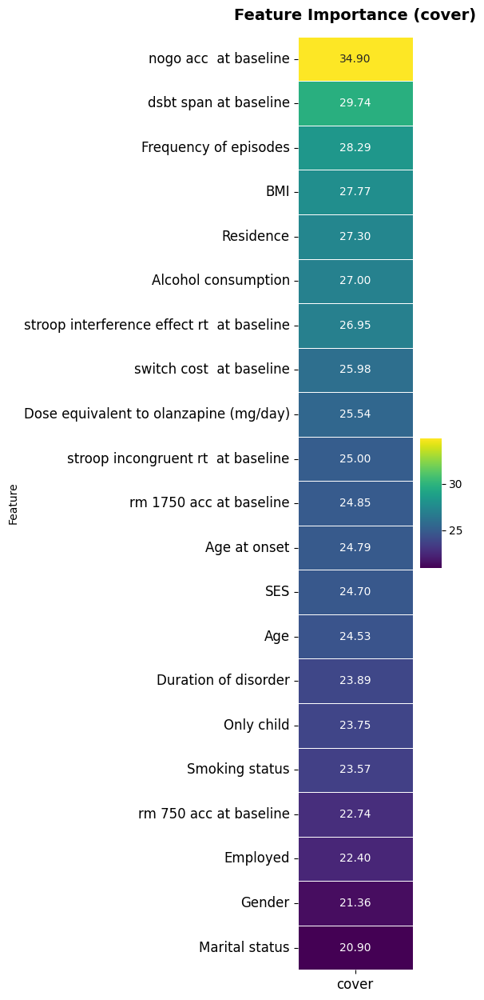

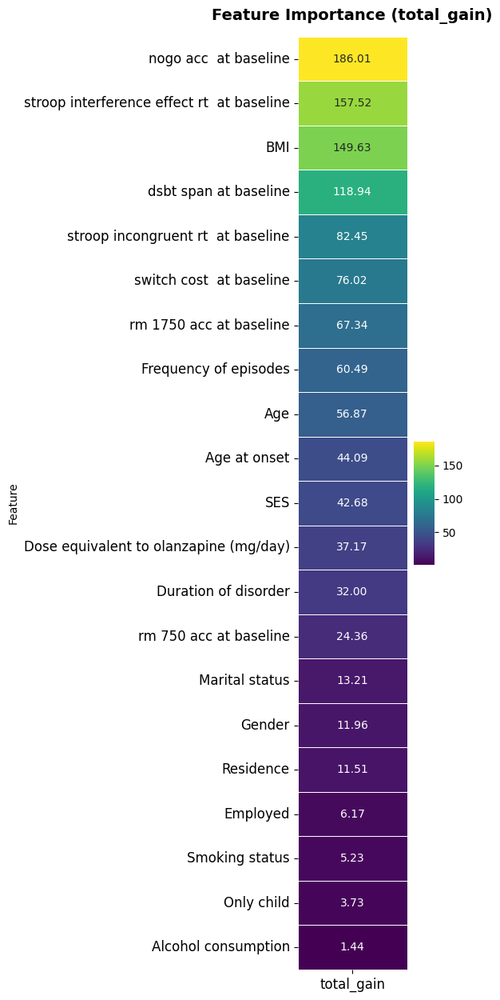

[I 2025-02-21 12:24:59,852] A new study created in memory with name: no-name-b3b51355-6863-4a51-afb9-221c8fdee7a2


去除第 9 个特征测试集 MSE: 0.04
去除第 9 个特征测试集 R²: 0.4146
去除第 9 个特征 individual-level prediction errors 已保存
去除第 10 个特征: BMI
去除第 10 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:25:03,005] Trial 20 finished with value: 0.0987927508868105 and parameters: {'n_estimators': 113, 'max_depth': 5, 'learning_rate': 0.10504021423973334, 'subsample': 0.5496362123574179, 'colsample_bytree': 0.6816623996197202, 'gamma': 0.35659165422298533, 'reg_alpha': 0.6536839073363178, 'reg_lambda': 0.02758166151954384, 'min_child_weight': 1}. Best is trial 20 with value: 0.0987927508868105.
[I 2025-02-21 12:25:03,649] Trial 9 finished with value: -0.07903836657443722 and parameters: {'n_estimators': 123, 'max_depth': 5, 'learning_rate': 0.23816522950231844, 'subsample': 0.6903612815649562, 'colsample_bytree': 0.6860200621528261, 'gamma': 0.0282720571627211, 'reg_alpha': 0.038005350008492415, 'reg_lambda': 0.2731760847206847, 'min_child_w

交叉验证结果已保存至 ./table/reduce_10！
最佳参数: {'n_estimators': 338, 'max_depth': 10, 'learning_rate': 0.011137564253927942, 'subsample': 0.9693818844593562, 'colsample_bytree': 0.5653487001304449, 'gamma': 0.5669040765093585, 'reg_alpha': 0.0032644402086839898, 'reg_lambda': 0.008333780992186141, 'min_child_weight': 3}
最佳模型已保存至 ./table/reduce_10/best_model.pkl


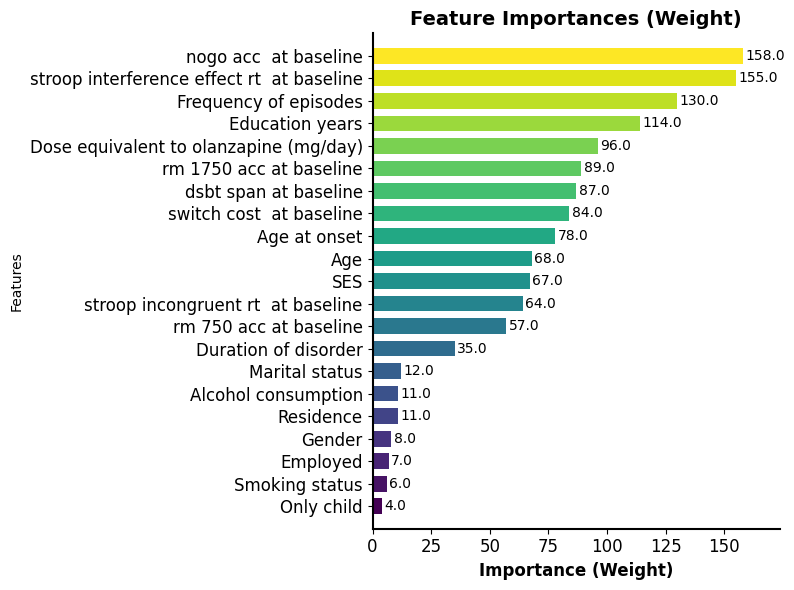

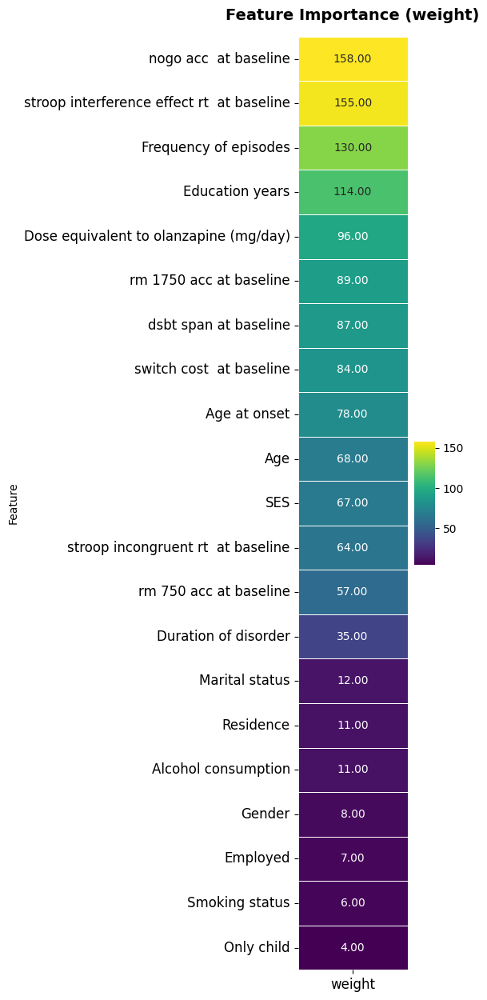

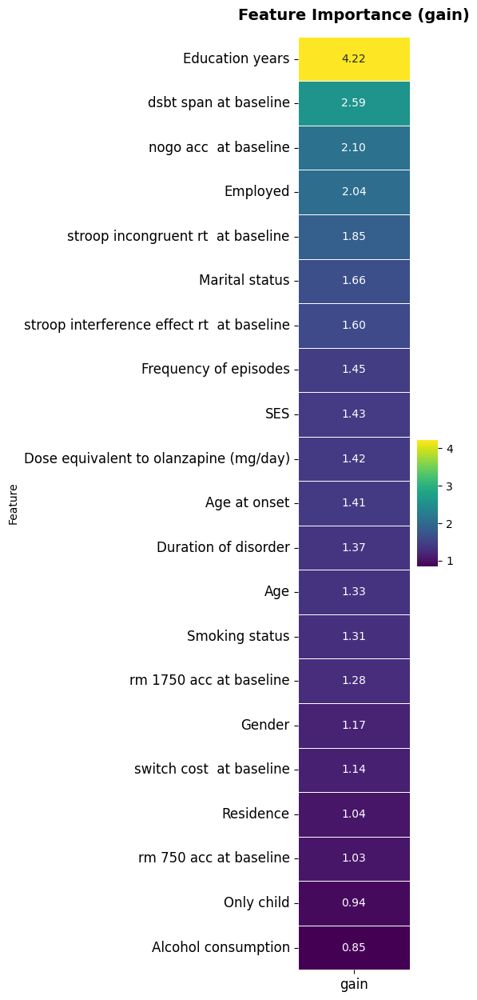

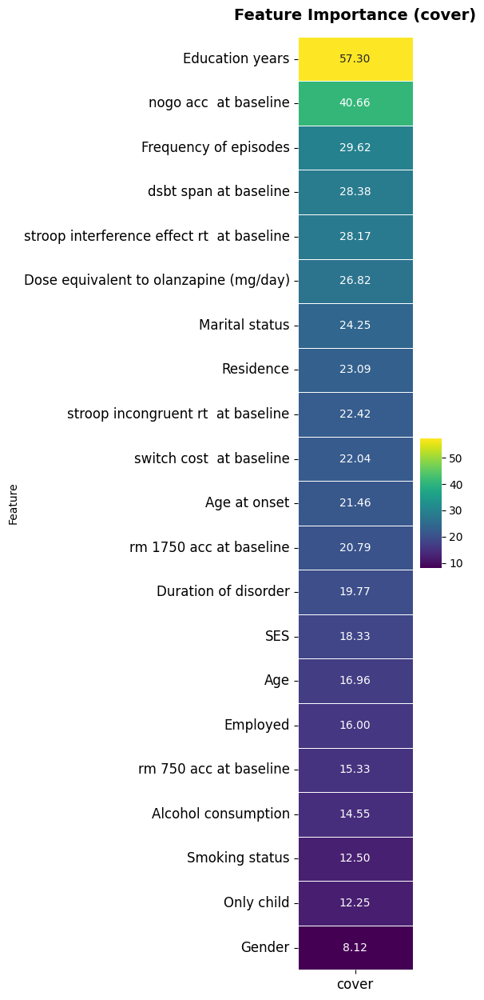

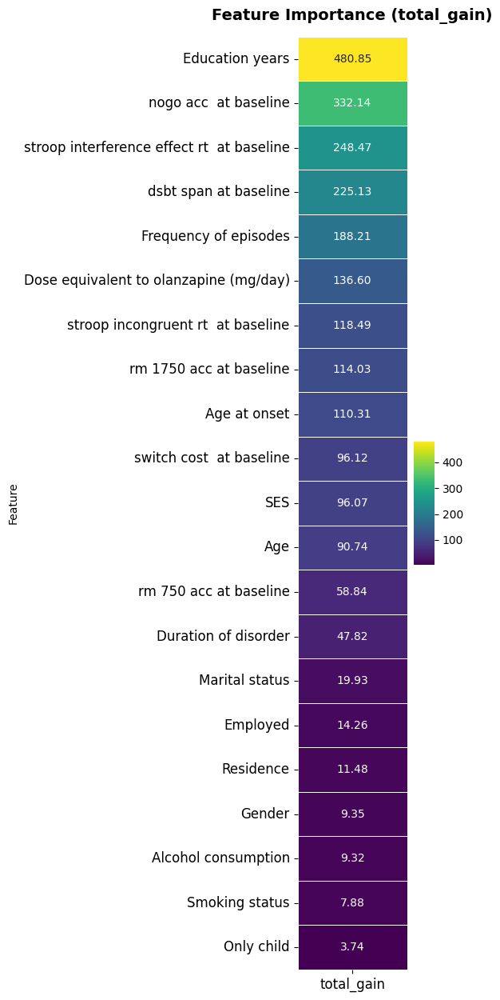

[I 2025-02-21 12:25:38,633] A new study created in memory with name: no-name-7970e84d-c044-4902-aa19-79f9968914ce


去除第 10 个特征测试集 MSE: 0.04
去除第 10 个特征测试集 R²: 0.4676
去除第 10 个特征 individual-level prediction errors 已保存
去除第 11 个特征: SES
去除第 11 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:25:42,428] Trial 19 finished with value: 0.08000079887815811 and parameters: {'n_estimators': 178, 'max_depth': 9, 'learning_rate': 0.23286988298893863, 'subsample': 0.5417117297383425, 'colsample_bytree': 0.39615976218416216, 'gamma': 0.1751789153423099, 'reg_alpha': 0.6781931868850368, 'reg_lambda': 0.032983306637160634, 'min_child_weight': 3}. Best is trial 19 with value: 0.08000079887815811.
[I 2025-02-21 12:25:42,814] Trial 8 finished with value: 0.1520724634466734 and parameters: {'n_estimators': 135, 'max_depth': 10, 'learning_rate': 0.1414558581928943, 'subsample': 0.8608655544031127, 'colsample_bytree': 0.5916348393527662, 'gamma': 0.07160776905303992, 'reg_alpha': 0.0016195393689299744, 'reg_lambda': 0.07258850488619169, 'min_chi

交叉验证结果已保存至 ./table/reduce_11！
最佳参数: {'n_estimators': 131, 'max_depth': 5, 'learning_rate': 0.0255149003896762, 'subsample': 0.7375644384483329, 'colsample_bytree': 0.7825694608464036, 'gamma': 0.5990073633145938, 'reg_alpha': 0.07998764826890994, 'reg_lambda': 0.0021541834592421817, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_11/best_model.pkl


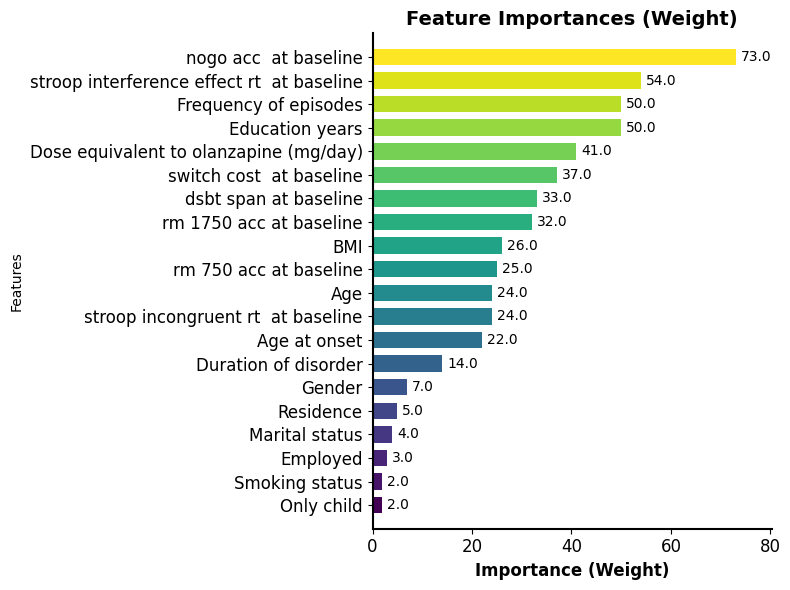

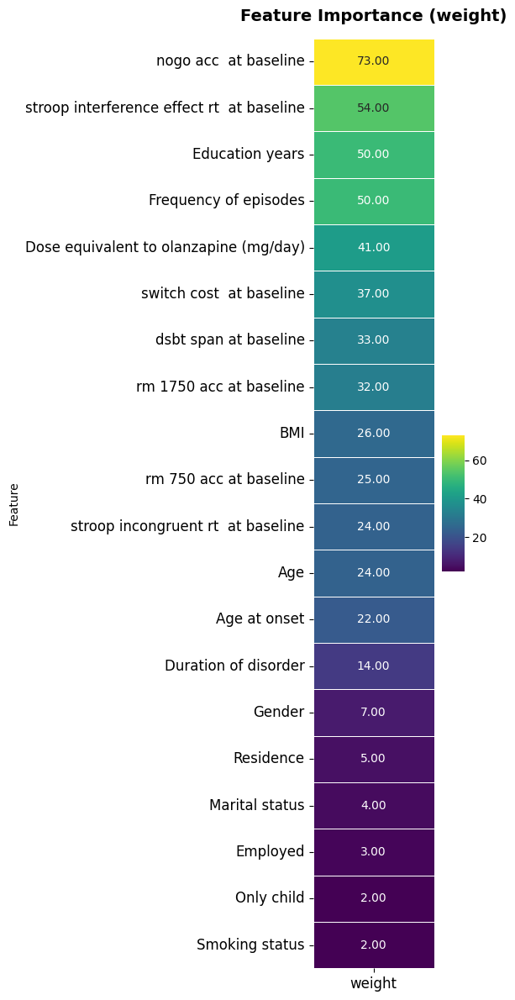

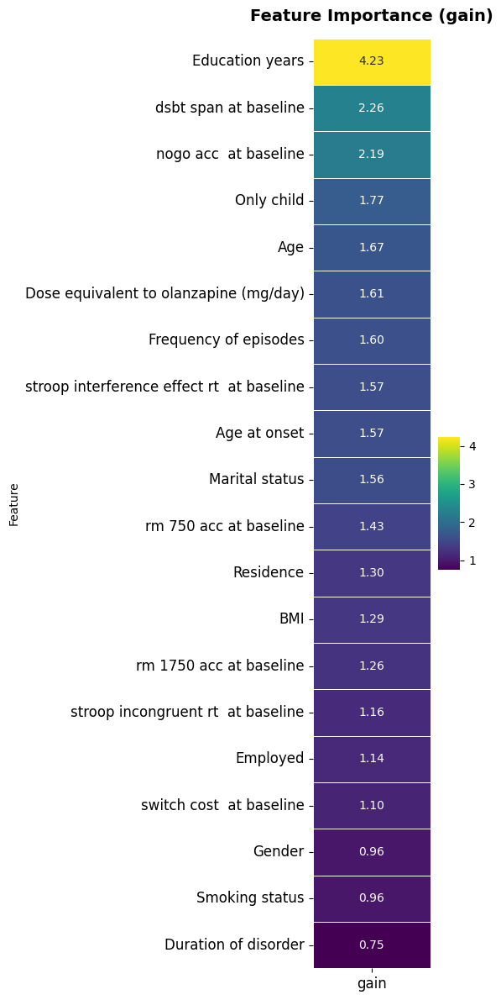

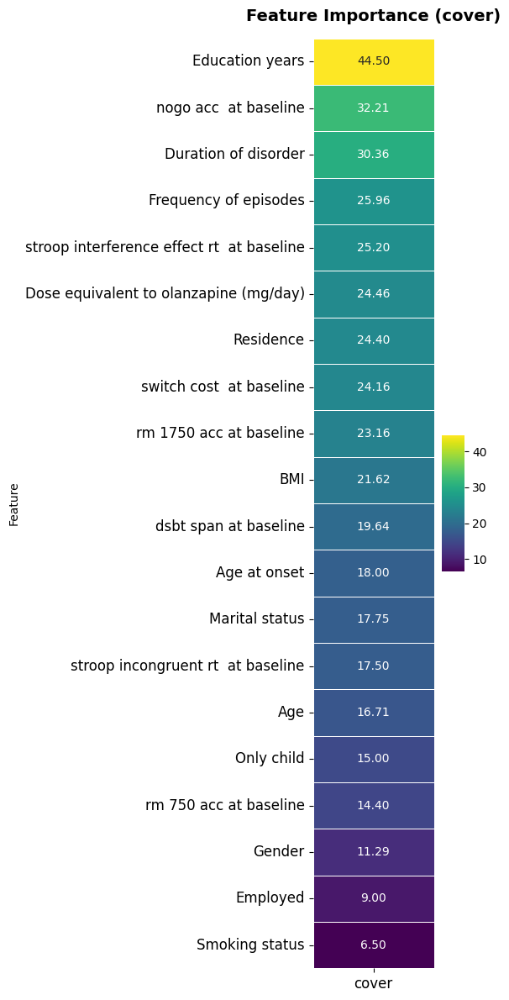

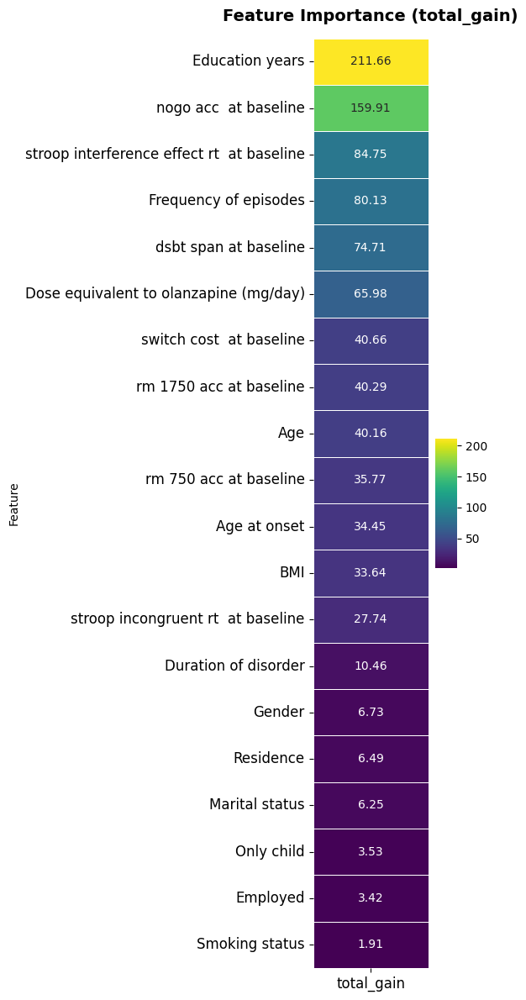

[I 2025-02-21 12:26:13,683] A new study created in memory with name: no-name-6ab5eb3f-7efd-41e7-8ad1-63395101d925


去除第 11 个特征测试集 MSE: 0.03
去除第 11 个特征测试集 R²: 0.5317
去除第 11 个特征 individual-level prediction errors 已保存
去除第 12 个特征: Gender
去除第 12 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:26:17,737] Trial 4 finished with value: 0.2200724314479988 and parameters: {'n_estimators': 102, 'max_depth': 4, 'learning_rate': 0.019600931073128942, 'subsample': 0.9162995546162465, 'colsample_bytree': 0.6391827381633446, 'gamma': 0.07508996782676372, 'reg_alpha': 0.4999749760443849, 'reg_lambda': 0.001941986865299179, 'min_child_weight': 6}. Best is trial 4 with value: 0.2200724314479988.
[I 2025-02-21 12:26:18,150] Trial 6 finished with value: -0.05567157678114478 and parameters: {'n_estimators': 139, 'max_depth': 9, 'learning_rate': 0.25367591839609793, 'subsample': 0.9541114839314946, 'colsample_bytree': 0.9558820496367082, 'gamma': 0.0032848235024029726, 'reg_alpha': 0.01182170308163891, 'reg_lambda': 0.0031052461404243643, 'min_ch

交叉验证结果已保存至 ./table/reduce_12！
最佳参数: {'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.032970396096488726, 'subsample': 0.8716491146759817, 'colsample_bytree': 0.8554462797071047, 'gamma': 0.4424492717830289, 'reg_alpha': 0.045002360783028134, 'reg_lambda': 0.0010235566290623152, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_12/best_model.pkl


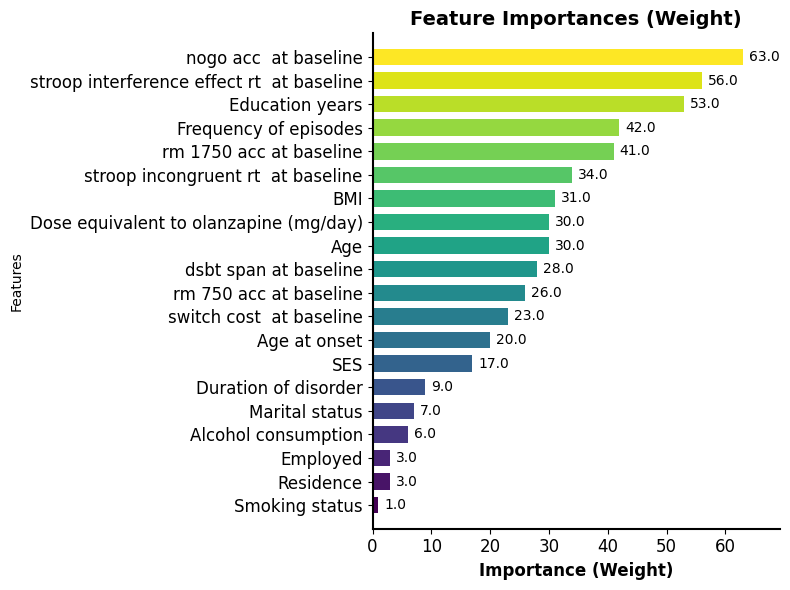

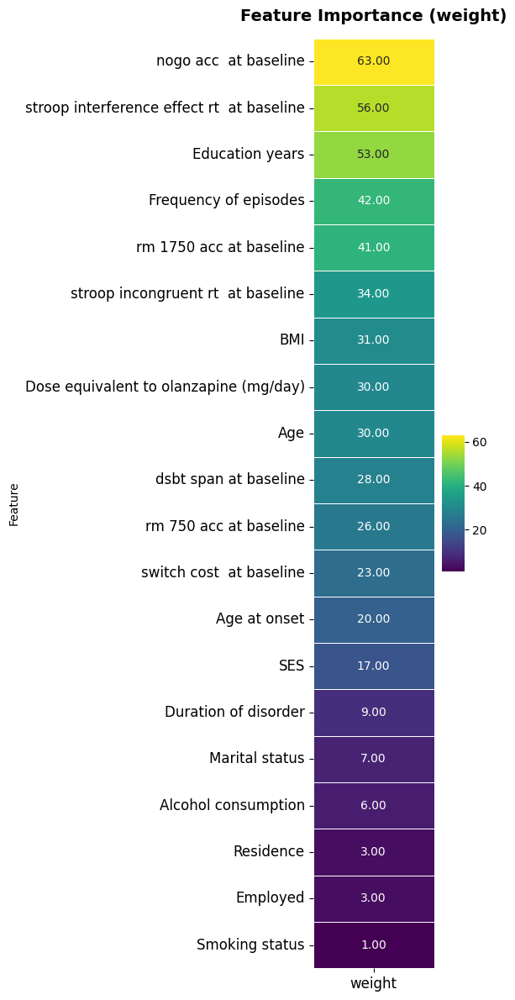

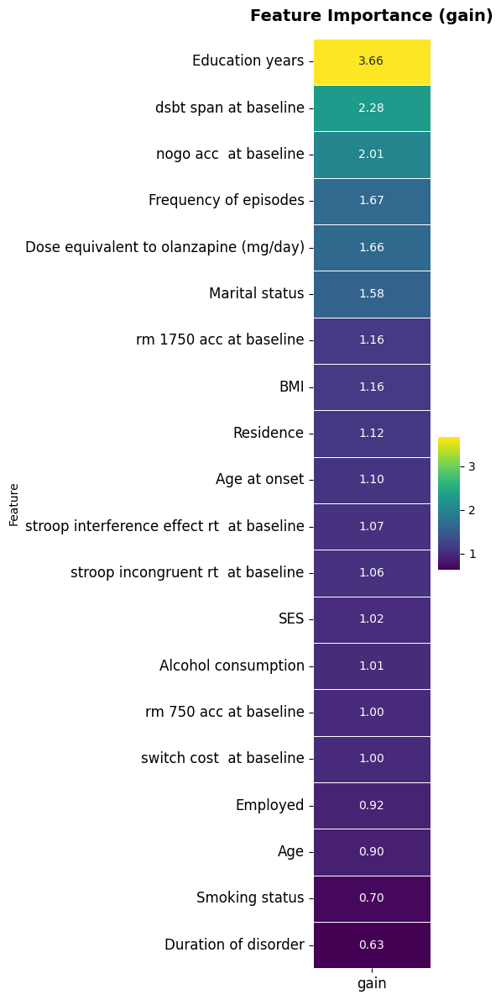

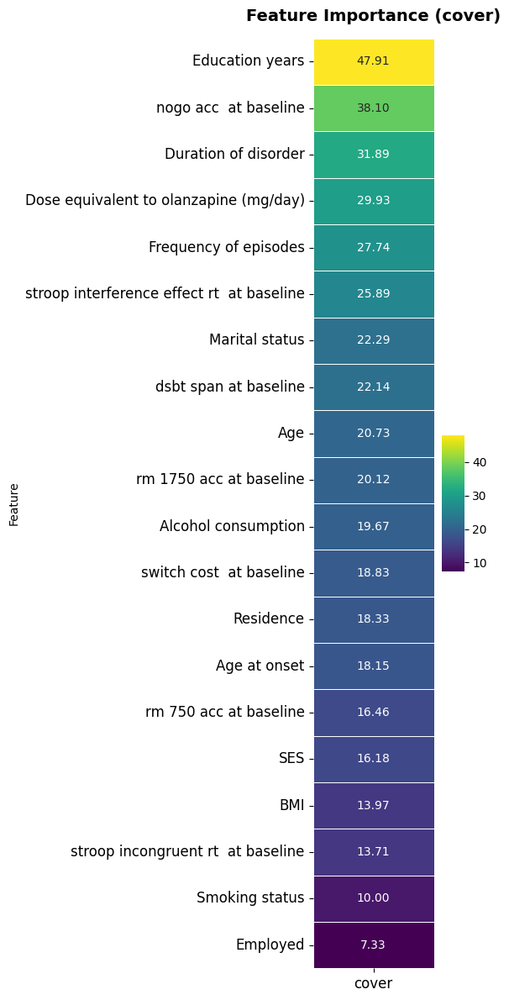

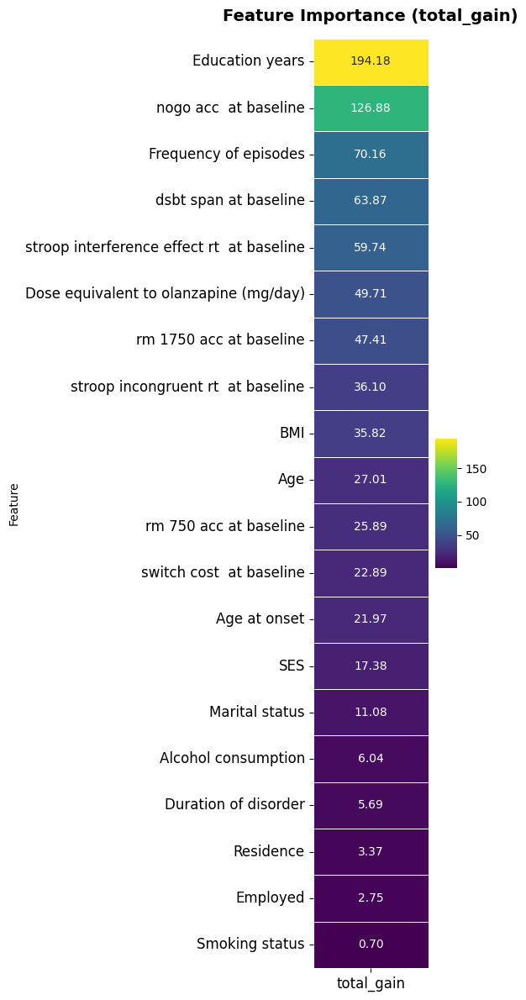

[I 2025-02-21 12:26:48,954] A new study created in memory with name: no-name-be91ec72-68a3-476f-a115-5e1f421684a2


去除第 12 个特征测试集 MSE: 0.03
去除第 12 个特征测试集 R²: 0.5120
去除第 12 个特征 individual-level prediction errors 已保存
去除第 13 个特征: Ethnic
去除第 13 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:26:52,250] Trial 1 finished with value: 0.14725906365660374 and parameters: {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.21561103847007357, 'subsample': 0.8867084136732719, 'colsample_bytree': 0.5079939307057226, 'gamma': 0.11405801588538986, 'reg_alpha': 0.004205795092868904, 'reg_lambda': 0.032937139101362665, 'min_child_weight': 3}. Best is trial 1 with value: 0.14725906365660374.
[I 2025-02-21 12:26:53,731] Trial 30 finished with value: 0.14403843522577917 and parameters: {'n_estimators': 201, 'max_depth': 7, 'learning_rate': 0.14640559615553572, 'subsample': 0.939746187307419, 'colsample_bytree': 0.3681559336036634, 'gamma': 0.19916099773704182, 'reg_alpha': 0.5433730705103466, 'reg_lambda': 0.0032096681520916315, 'min_chi

交叉验证结果已保存至 ./table/reduce_13！
最佳参数: {'n_estimators': 379, 'max_depth': 4, 'learning_rate': 0.015690903578954557, 'subsample': 0.9074509822552523, 'colsample_bytree': 0.4319562434872052, 'gamma': 0.45874674865563625, 'reg_alpha': 0.0023175189679622912, 'reg_lambda': 0.002008758980631112, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_13/best_model.pkl


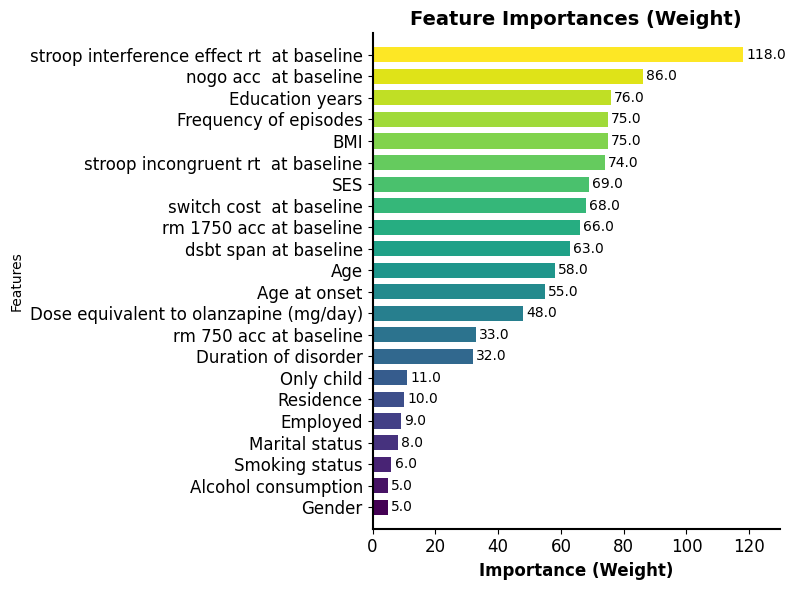

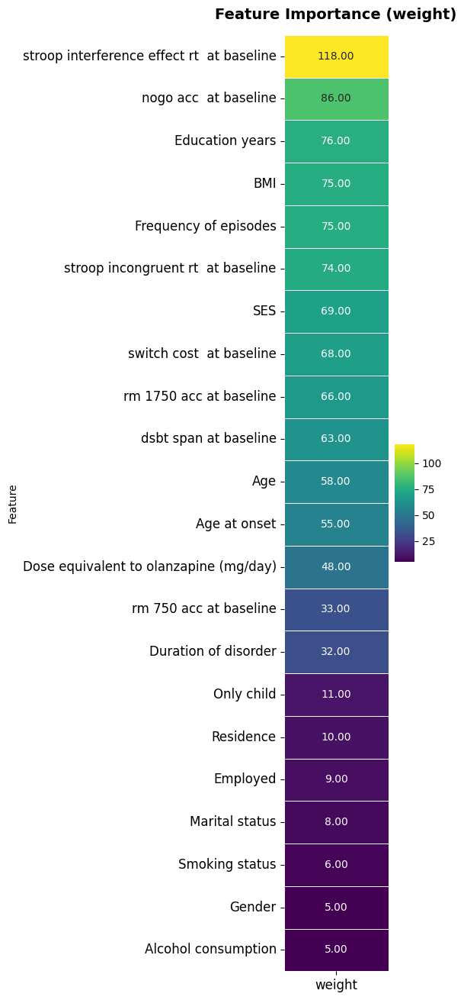

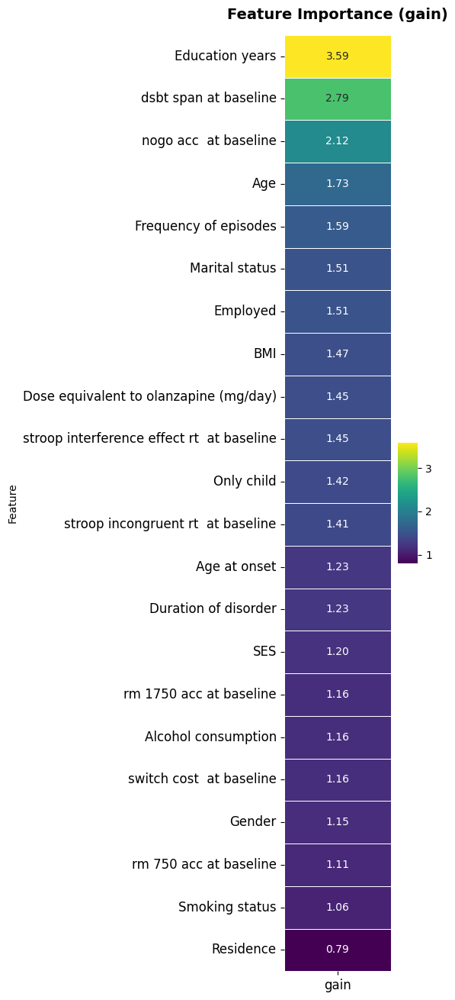

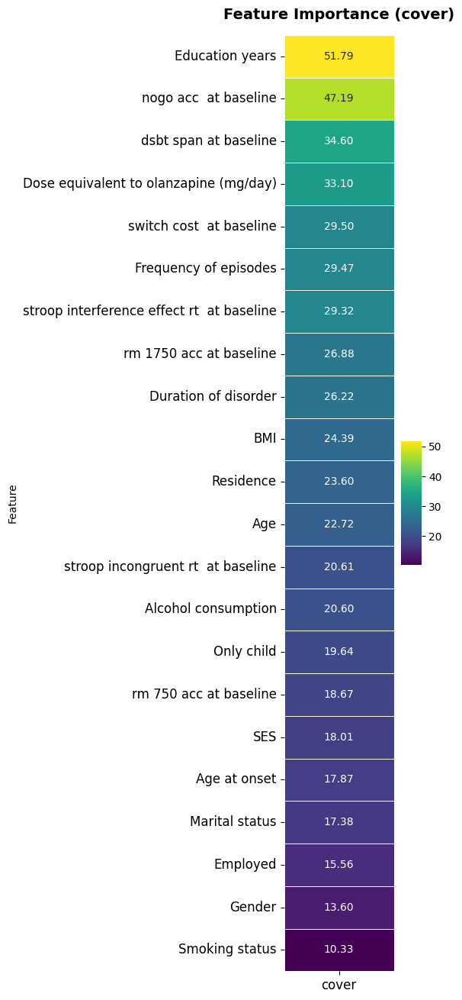

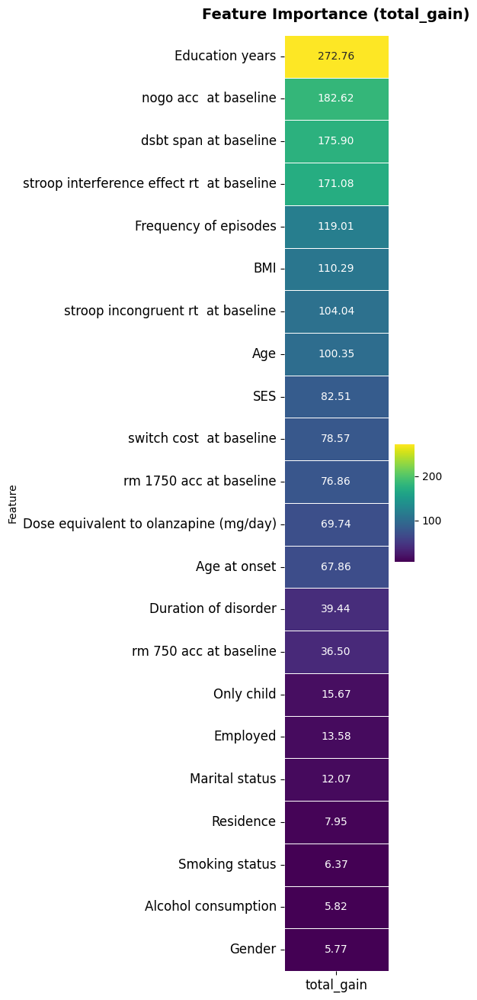

[I 2025-02-21 12:27:29,399] A new study created in memory with name: no-name-4db3d376-9766-4396-ba65-b08500a05d71


去除第 13 个特征测试集 MSE: 0.04
去除第 13 个特征测试集 R²: 0.4427
去除第 13 个特征 individual-level prediction errors 已保存
去除第 14 个特征: Residence
去除第 14 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:27:32,361] Trial 18 finished with value: 0.060962198226947886 and parameters: {'n_estimators': 117, 'max_depth': 6, 'learning_rate': 0.26444078305083857, 'subsample': 0.5984925084244024, 'colsample_bytree': 0.8822839028982743, 'gamma': 0.9909429520849329, 'reg_alpha': 0.0012197329607854168, 'reg_lambda': 0.9588849147795705, 'min_child_weight': 4}. Best is trial 18 with value: 0.060962198226947886.
[I 2025-02-21 12:27:33,137] Trial 19 finished with value: 0.1814320006618275 and parameters: {'n_estimators': 147, 'max_depth': 3, 'learning_rate': 0.1533003430307973, 'subsample': 0.9462260918854963, 'colsample_bytree': 0.97727923100703, 'gamma': 0.30406338282244677, 'reg_alpha': 0.3842582996062387, 'reg_lambda': 0.12978975545109275, 'min_child_

交叉验证结果已保存至 ./table/reduce_14！
最佳参数: {'n_estimators': 109, 'max_depth': 6, 'learning_rate': 0.033996425105347505, 'subsample': 0.9667308822255312, 'colsample_bytree': 0.699665005642672, 'gamma': 0.4266593097850317, 'reg_alpha': 0.011979355416208938, 'reg_lambda': 0.15491315763124433, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_14/best_model.pkl


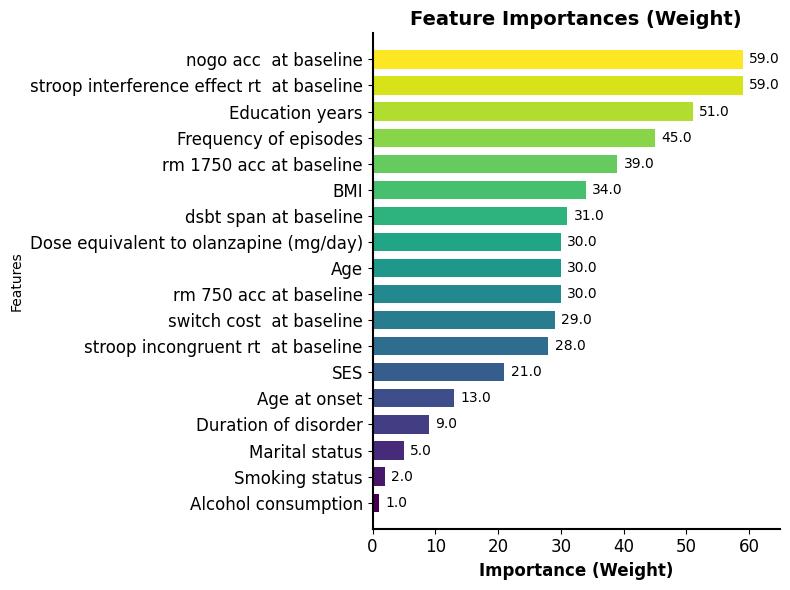

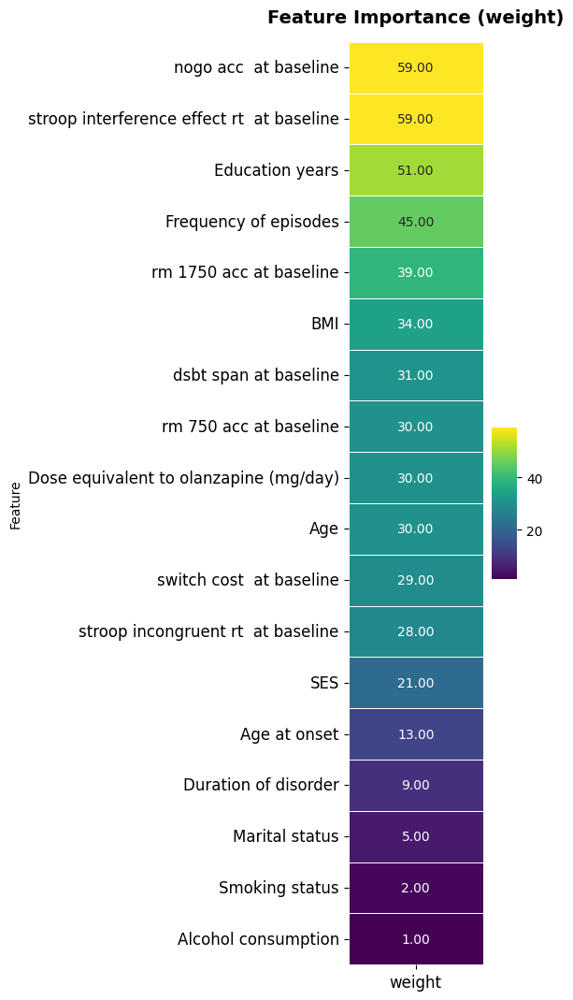

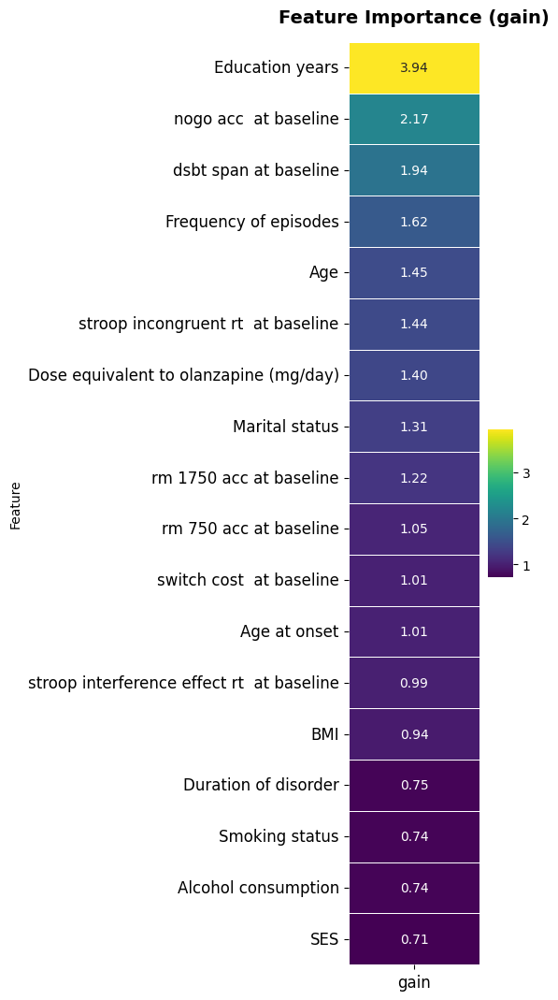

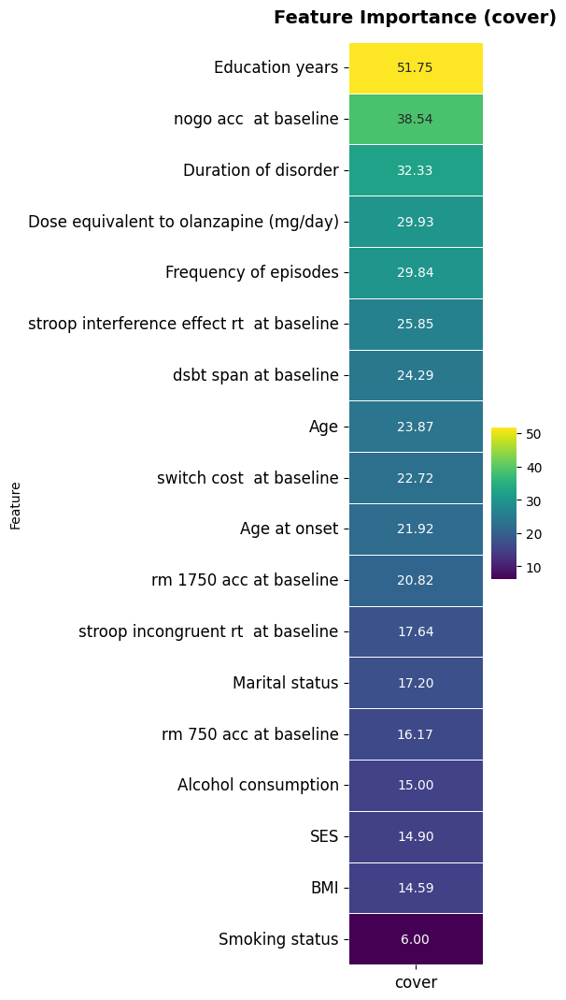

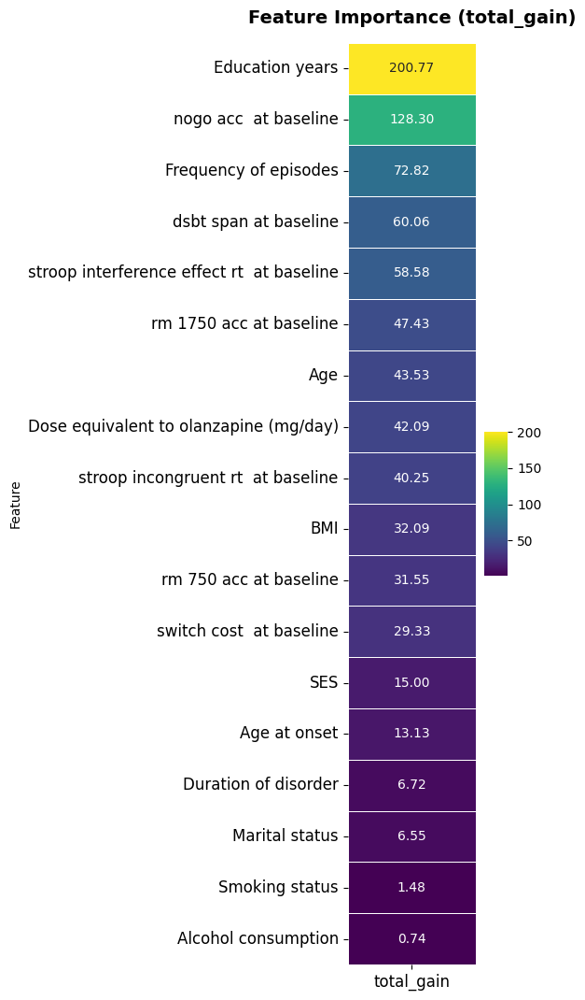

[I 2025-02-21 12:28:03,323] A new study created in memory with name: no-name-7fafcfa4-ea5e-4cd5-9f93-d6322ce1d359


去除第 14 个特征测试集 MSE: 0.04
去除第 14 个特征测试集 R²: 0.4489
去除第 14 个特征 individual-level prediction errors 已保存
去除第 15 个特征: Only child
去除第 15 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:28:06,604] Trial 7 finished with value: 0.14019679343443125 and parameters: {'n_estimators': 107, 'max_depth': 5, 'learning_rate': 0.03814152623085429, 'subsample': 0.5080096656994351, 'colsample_bytree': 0.4638073934233401, 'gamma': 0.3232748547328136, 'reg_alpha': 0.001792688683588205, 'reg_lambda': 0.04068066260941347, 'min_child_weight': 9}. Best is trial 7 with value: 0.14019679343443125.
[I 2025-02-21 12:28:06,681] Trial 1 finished with value: -0.06828259649432192 and parameters: {'n_estimators': 111, 'max_depth': 7, 'learning_rate': 0.2845977071447179, 'subsample': 0.6869523923656915, 'colsample_bytree': 0.3017754032957097, 'gamma': 0.04208985484531489, 'reg_alpha': 0.06063822078801581, 'reg_lambda': 0.09754004929768033, 'min_child_

交叉验证结果已保存至 ./table/reduce_15！
最佳参数: {'n_estimators': 244, 'max_depth': 9, 'learning_rate': 0.022850770389400938, 'subsample': 0.9010556729223049, 'colsample_bytree': 0.7166625285337025, 'gamma': 0.9329134205096952, 'reg_alpha': 0.13230491610950296, 'reg_lambda': 0.3359290729129074, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_15/best_model.pkl


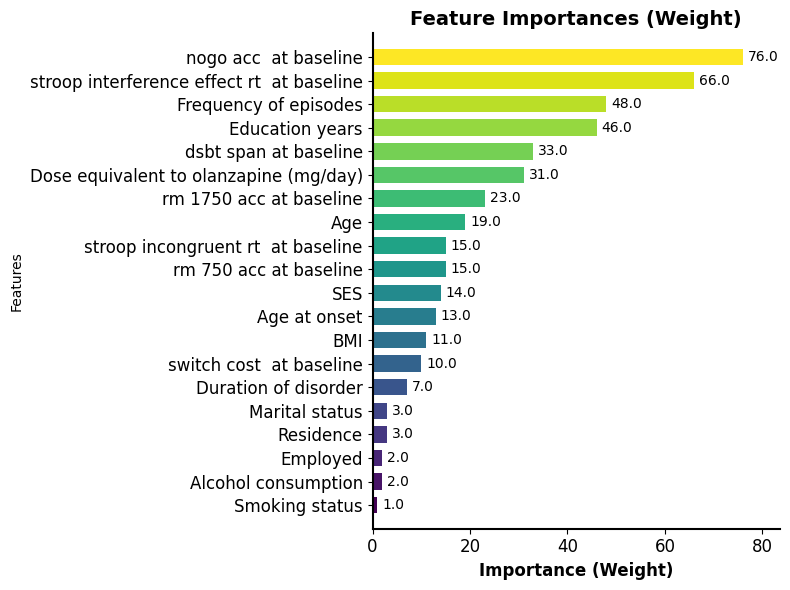

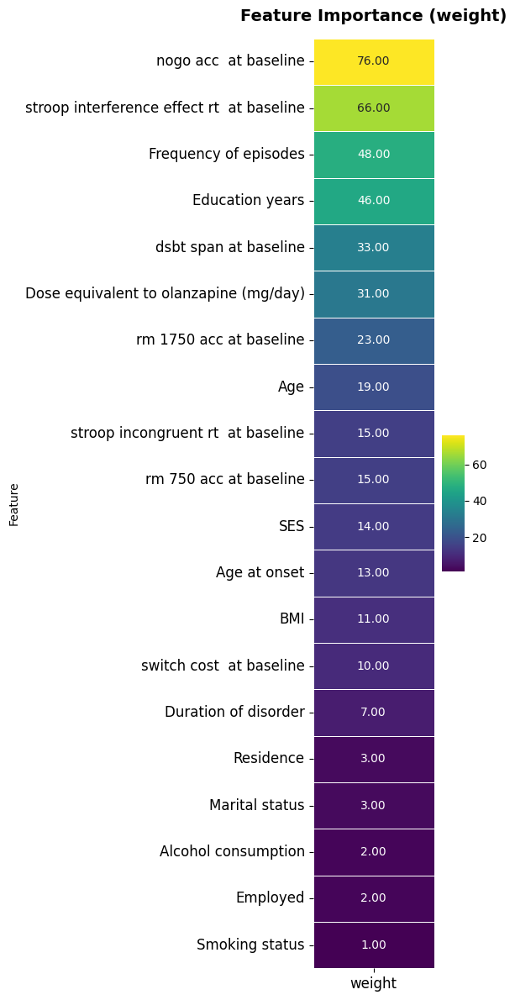

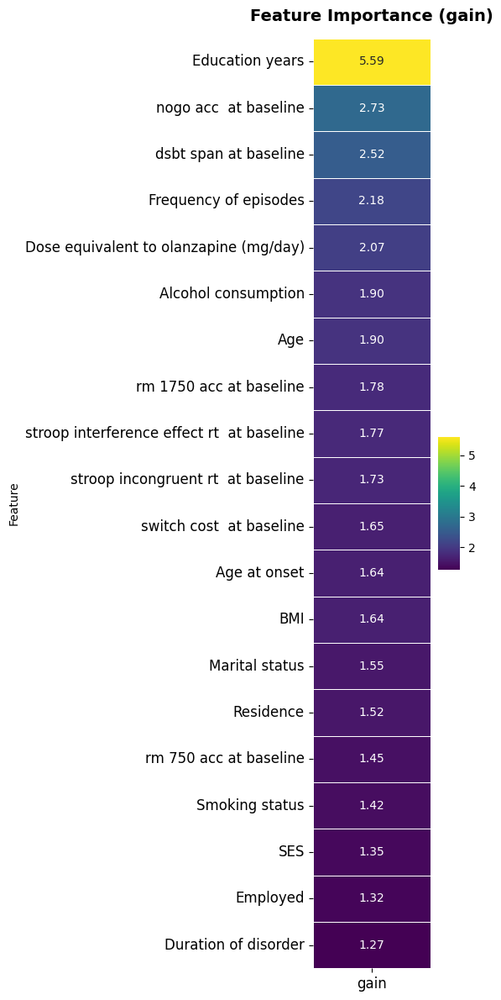

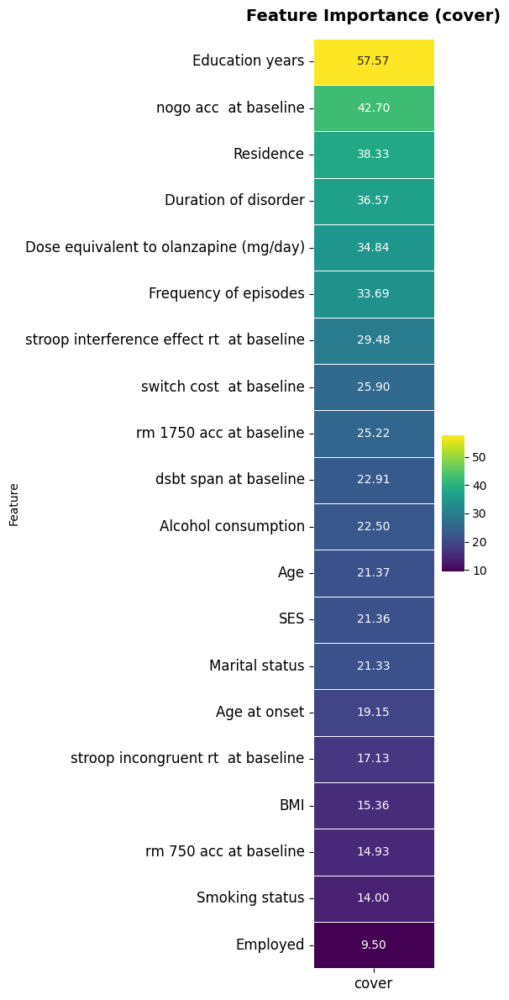

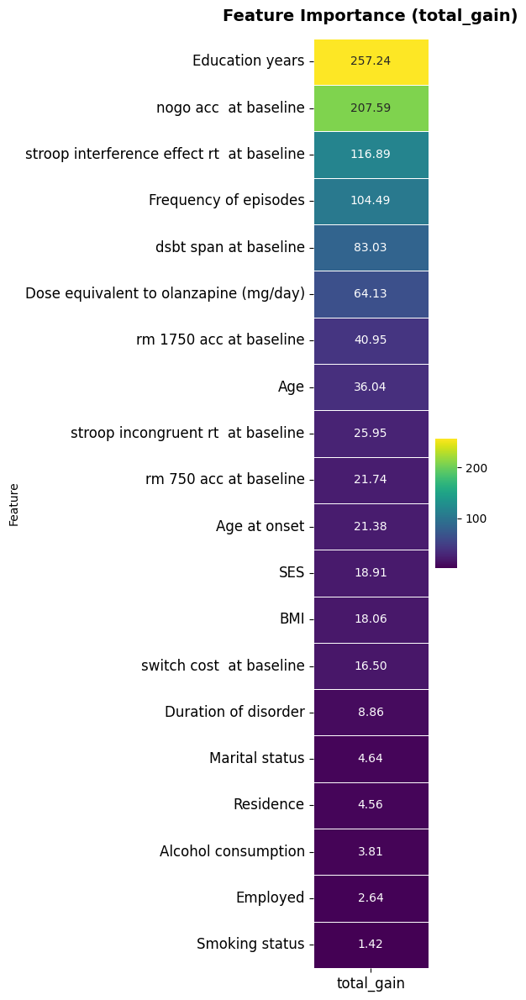

[I 2025-02-21 12:28:36,799] A new study created in memory with name: no-name-53128310-f8db-4e90-b537-9e3e51fc7cbf


去除第 15 个特征测试集 MSE: 0.04
去除第 15 个特征测试集 R²: 0.4612
去除第 15 个特征 individual-level prediction errors 已保存
去除第 16 个特征: Smoking status
去除第 16 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:28:40,028] Trial 3 finished with value: 0.1772021615489838 and parameters: {'n_estimators': 103, 'max_depth': 3, 'learning_rate': 0.06237817288303989, 'subsample': 0.5025143127769637, 'colsample_bytree': 0.7803956346703045, 'gamma': 0.47869585751814975, 'reg_alpha': 0.784878141616614, 'reg_lambda': 0.09581292397995407, 'min_child_weight': 1}. Best is trial 3 with value: 0.1772021615489838.
[I 2025-02-21 12:28:40,484] Trial 16 finished with value: 0.13871054744986885 and parameters: {'n_estimators': 124, 'max_depth': 4, 'learning_rate': 0.10723484486228126, 'subsample': 0.5521434063276169, 'colsample_bytree': 0.6577368073035229, 'gamma': 0.2252670651398627, 'reg_alpha': 0.3681328971804024, 'reg_lambda': 0.0019811450185895597, 'min_child_wei

交叉验证结果已保存至 ./table/reduce_16！
最佳参数: {'n_estimators': 224, 'max_depth': 3, 'learning_rate': 0.01036381522701472, 'subsample': 0.9792920169020063, 'colsample_bytree': 0.5663739011162199, 'gamma': 0.006789385433766179, 'reg_alpha': 0.04641080801485408, 'reg_lambda': 0.005946196540772741, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_16/best_model.pkl


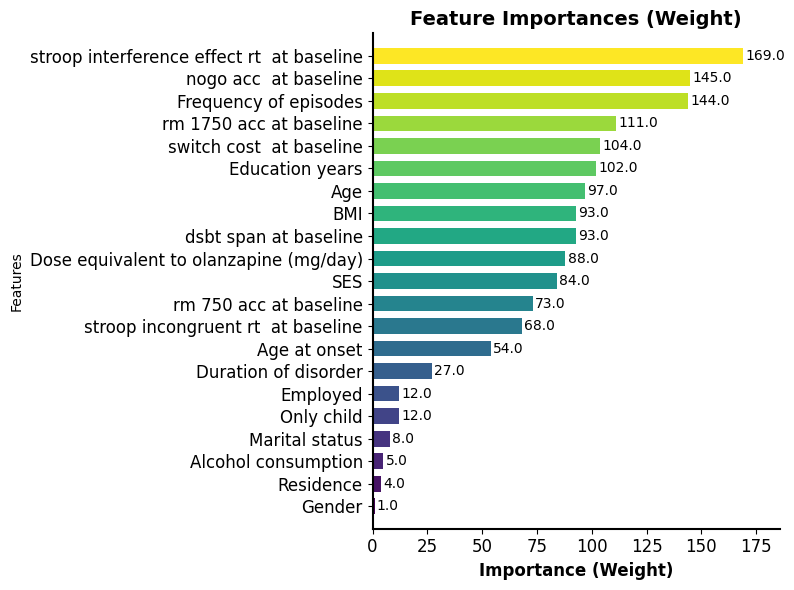

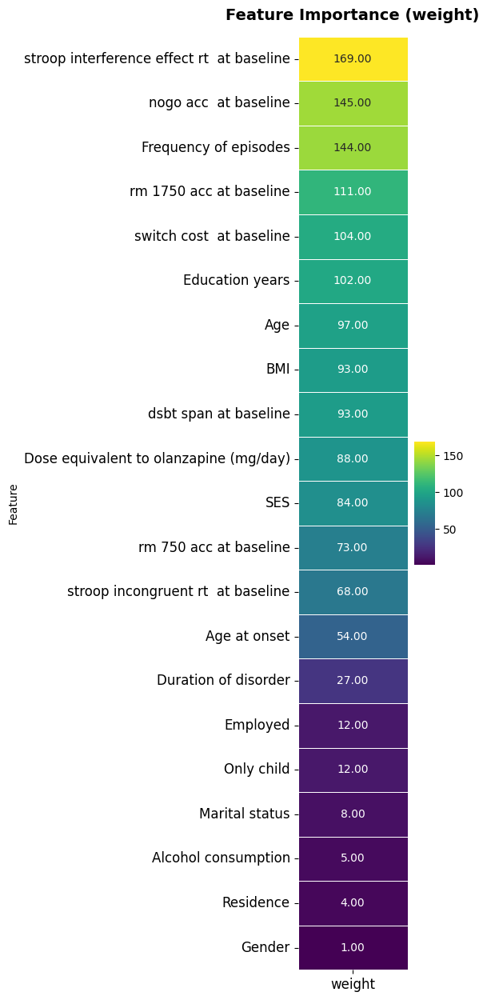

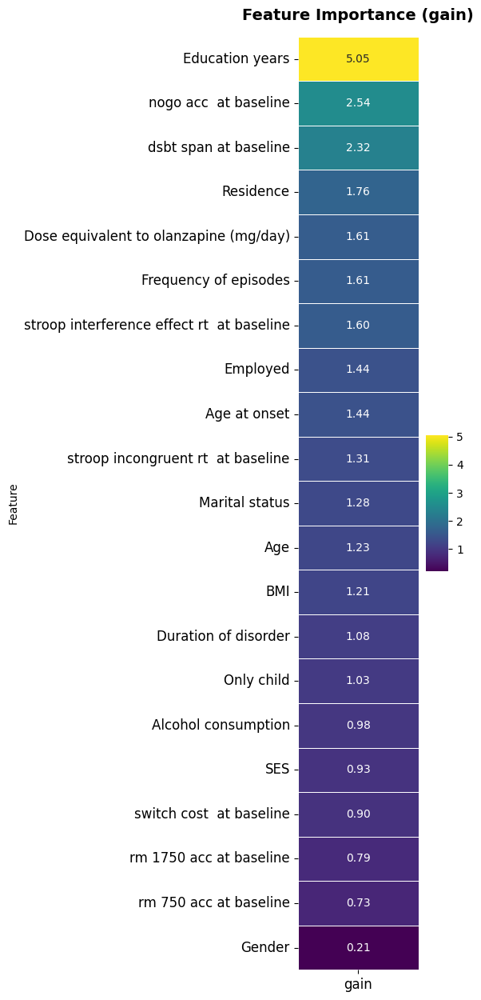

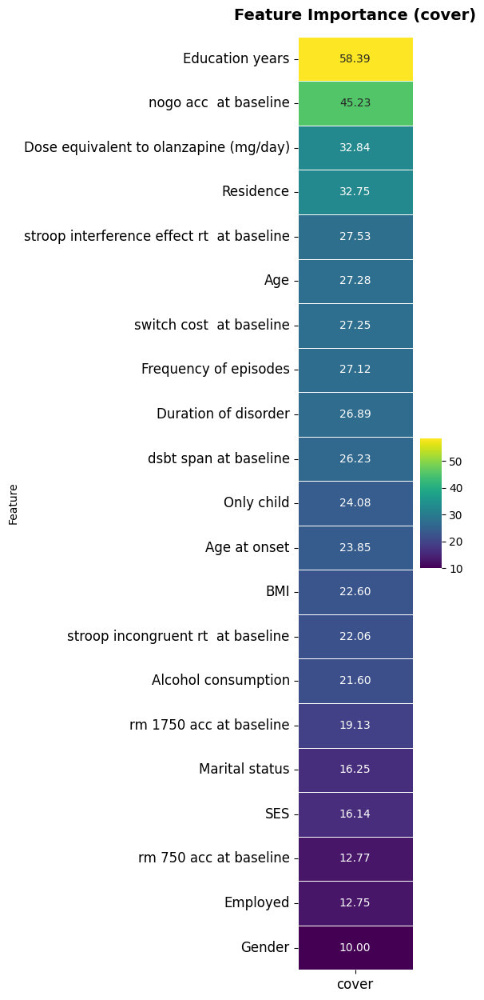

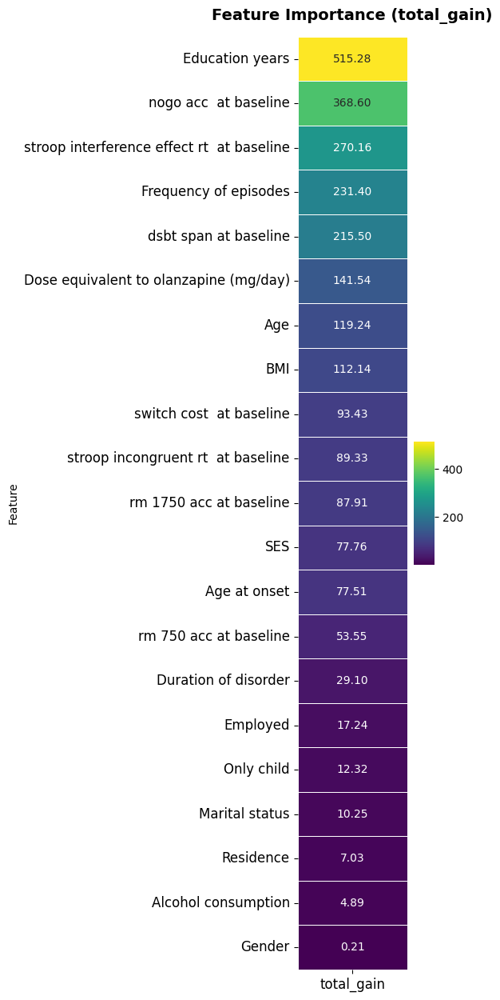

[I 2025-02-21 12:29:11,840] A new study created in memory with name: no-name-c68025b8-2c9b-4e9b-9acd-3f972d321290


去除第 16 个特征测试集 MSE: 0.04
去除第 16 个特征测试集 R²: 0.3740
去除第 16 个特征 individual-level prediction errors 已保存
去除第 17 个特征: Alcohol consumption
去除第 17 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:29:15,870] Trial 7 finished with value: 0.027473214800218783 and parameters: {'n_estimators': 137, 'max_depth': 5, 'learning_rate': 0.2951148027346318, 'subsample': 0.8934347569711443, 'colsample_bytree': 0.308380521176538, 'gamma': 0.025208444077613603, 'reg_alpha': 0.0010499889992862995, 'reg_lambda': 0.0049153546921193525, 'min_child_weight': 8}. Best is trial 7 with value: 0.027473214800218783.
[I 2025-02-21 12:29:16,881] Trial 25 finished with value: 0.21007942106414018 and parameters: {'n_estimators': 122, 'max_depth': 10, 'learning_rate': 0.013987072612611527, 'subsample': 0.627336482935254, 'colsample_bytree': 0.5568883178231826, 'gamma': 0.2012927472071549, 'reg_alpha': 0.03874362038720972, 'reg_lambda': 0.8289086732996596, 'min_c

交叉验证结果已保存至 ./table/reduce_17！
最佳参数: {'n_estimators': 194, 'max_depth': 8, 'learning_rate': 0.017842821623194362, 'subsample': 0.9567405069446426, 'colsample_bytree': 0.41956697842962526, 'gamma': 0.3923246459833551, 'reg_alpha': 0.04251205098790547, 'reg_lambda': 0.3000578851059004, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_17/best_model.pkl


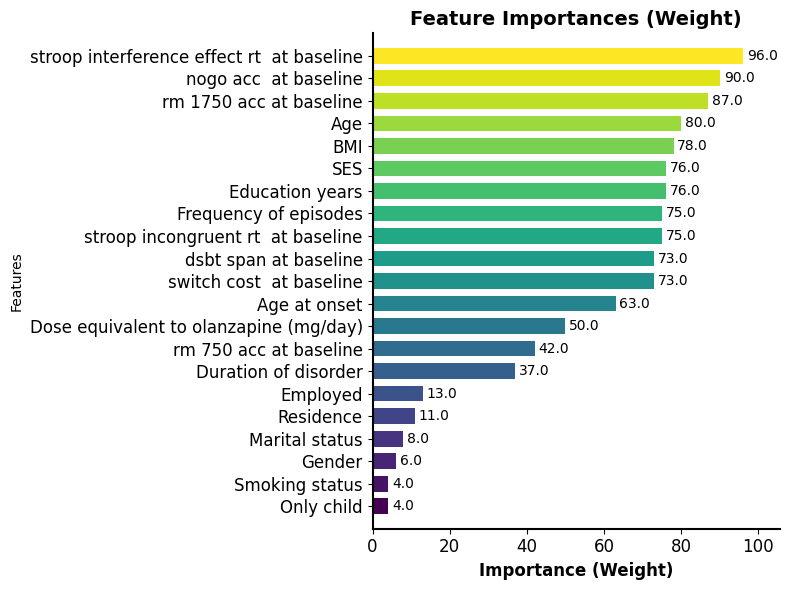

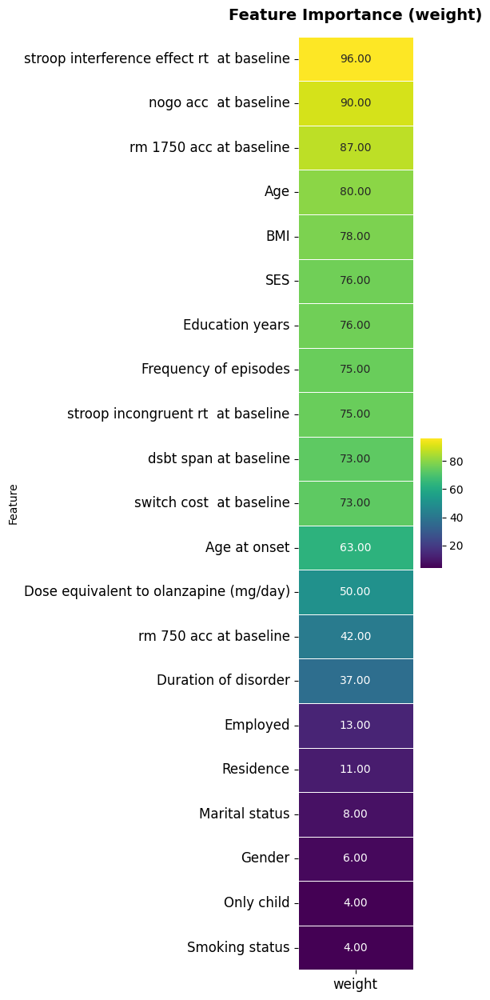

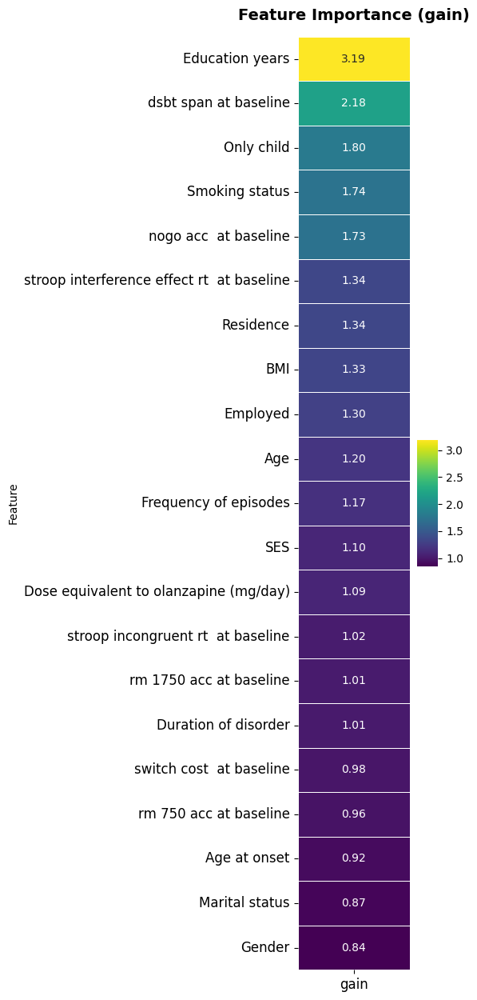

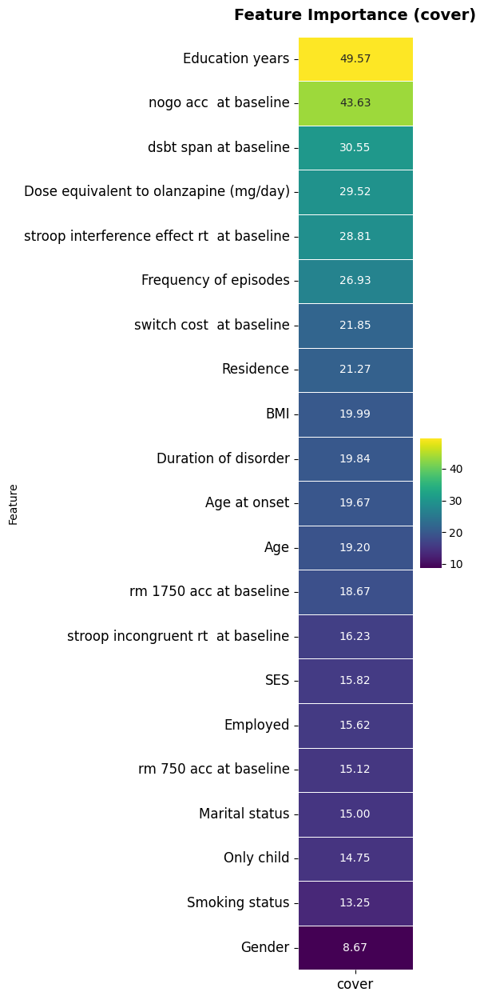

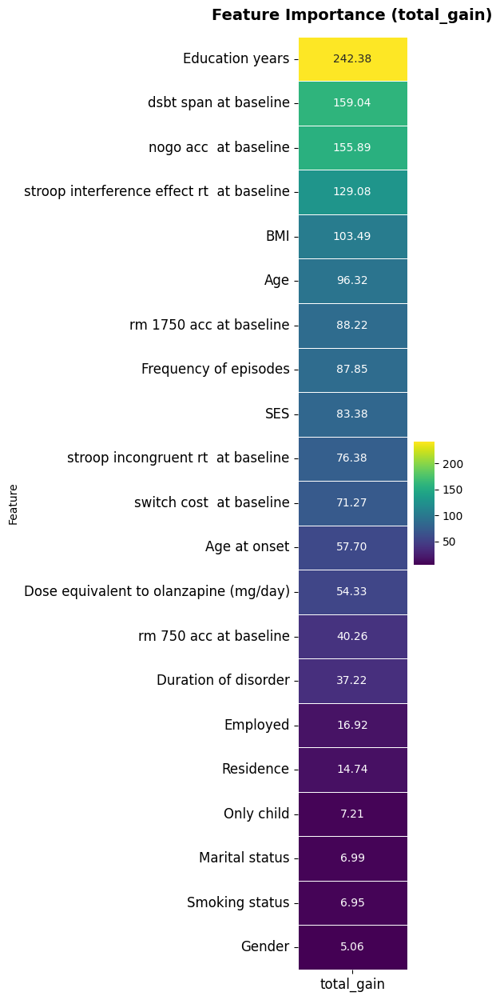

[I 2025-02-21 12:29:44,628] A new study created in memory with name: no-name-7498d180-bc67-4ce2-8e54-58703a1e2e31


去除第 17 个特征测试集 MSE: 0.04
去除第 17 个特征测试集 R²: 0.3805
去除第 17 个特征 individual-level prediction errors 已保存
去除第 18 个特征: Employed
去除第 18 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:29:48,068] Trial 22 finished with value: -0.36372524079280394 and parameters: {'n_estimators': 144, 'max_depth': 10, 'learning_rate': 0.2631695919415198, 'subsample': 0.5334407877863405, 'colsample_bytree': 0.8210043137141312, 'gamma': 0.7654066809969082, 'reg_alpha': 0.0054970392663510805, 'reg_lambda': 0.25896340074201063, 'min_child_weight': 5}. Best is trial 22 with value: -0.36372524079280394.
[I 2025-02-21 12:29:49,309] Trial 30 finished with value: 0.21013852105483471 and parameters: {'n_estimators': 104, 'max_depth': 6, 'learning_rate': 0.01672145430493153, 'subsample': 0.9930836991941225, 'colsample_bytree': 0.39344067453669224, 'gamma': 0.008225925815092499, 'reg_alpha': 0.0244949042174628, 'reg_lambda': 0.009771584422933405, 'mi

交叉验证结果已保存至 ./table/reduce_18！
最佳参数: {'n_estimators': 467, 'max_depth': 9, 'learning_rate': 0.04117354387481506, 'subsample': 0.7862795009759775, 'colsample_bytree': 0.5752064928465724, 'gamma': 0.3142766446674495, 'reg_alpha': 0.001099297566683334, 'reg_lambda': 0.021498980616156182, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_18/best_model.pkl


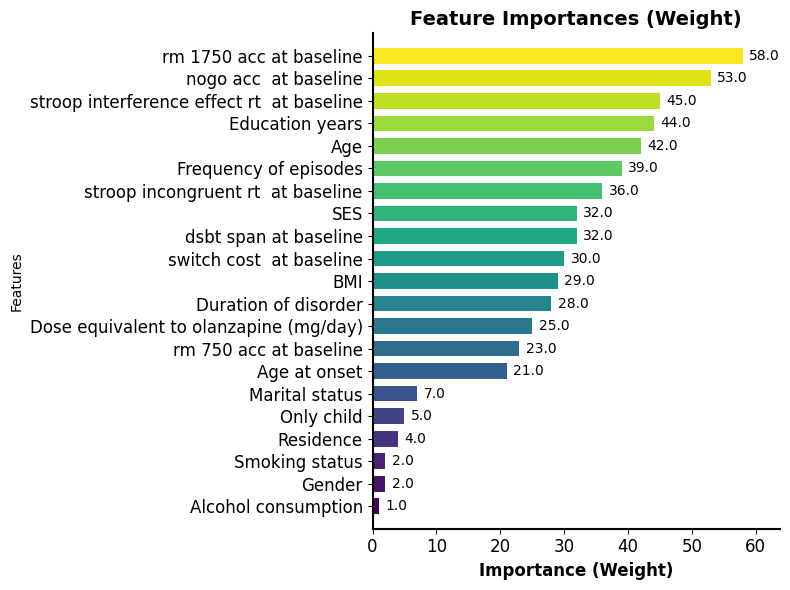

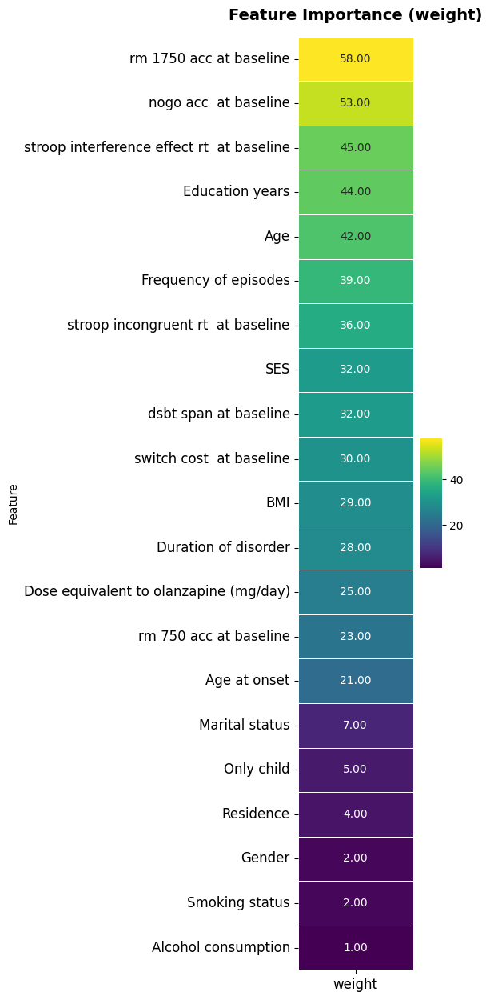

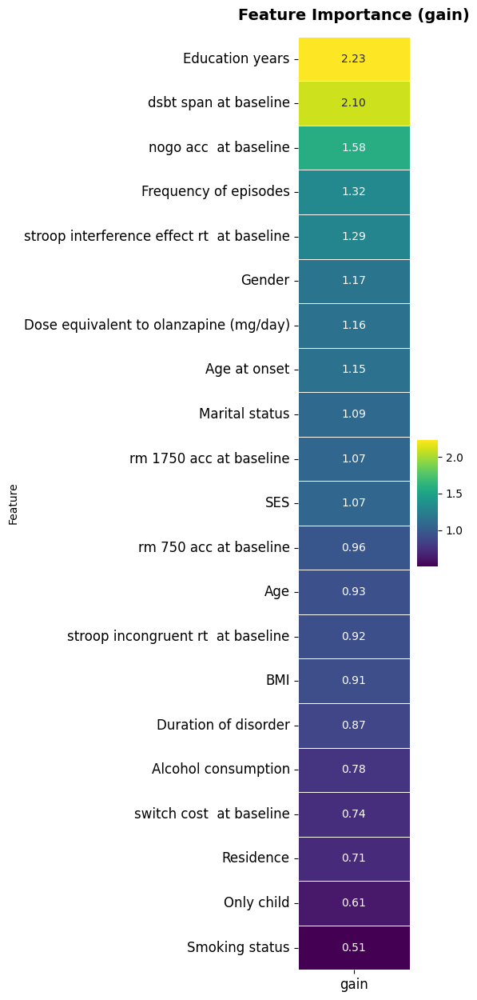

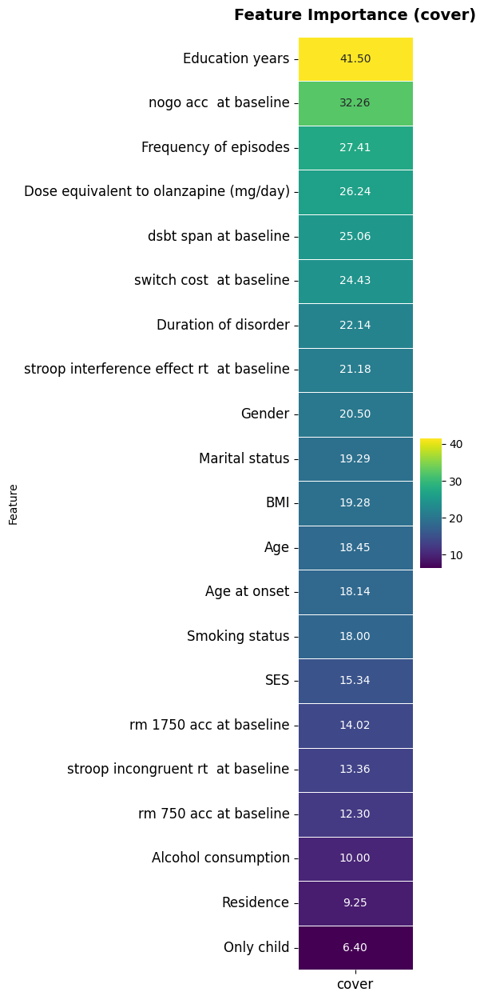

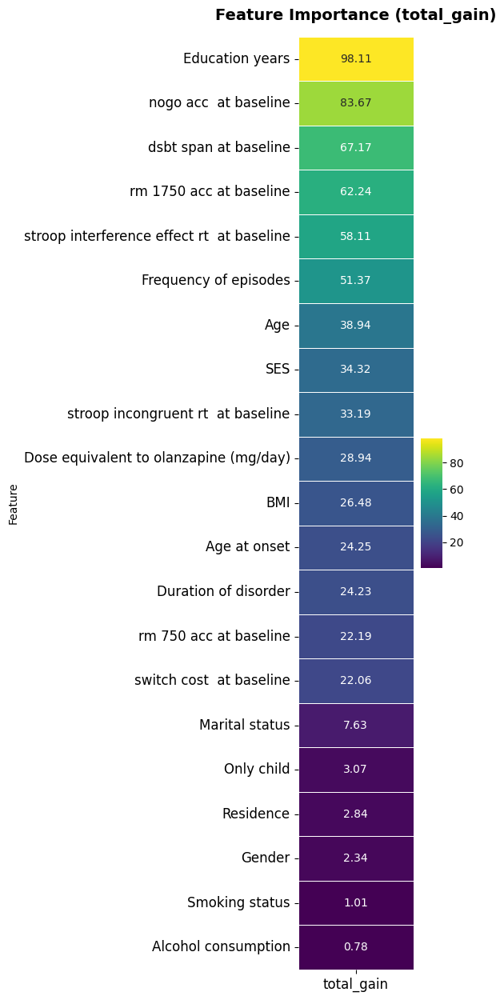

[I 2025-02-21 12:30:22,346] A new study created in memory with name: no-name-71bb2fa5-f50d-454b-b87c-3fbdeb4b8ed9


去除第 18 个特征测试集 MSE: 0.04
去除第 18 个特征测试集 R²: 0.4454
去除第 18 个特征 individual-level prediction errors 已保存
去除第 19 个特征: Marital status
去除第 19 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:30:26,774] Trial 14 finished with value: 0.16125594531008855 and parameters: {'n_estimators': 193, 'max_depth': 7, 'learning_rate': 0.1399203833437504, 'subsample': 0.8732894520739679, 'colsample_bytree': 0.3379726371998892, 'gamma': 0.535707778543386, 'reg_alpha': 0.024011019086906057, 'reg_lambda': 0.0024716364035200235, 'min_child_weight': 8}. Best is trial 14 with value: 0.16125594531008855.
[I 2025-02-21 12:30:27,929] Trial 18 finished with value: 0.21547896721425025 and parameters: {'n_estimators': 179, 'max_depth': 3, 'learning_rate': 0.011724335756885711, 'subsample': 0.6842196053680195, 'colsample_bytree': 0.35576947576490636, 'gamma': 0.20114308545653967, 'reg_alpha': 0.11361400788889474, 'reg_lambda': 0.03689651638773311, 'min_c

交叉验证结果已保存至 ./table/reduce_19！
最佳参数: {'n_estimators': 364, 'max_depth': 3, 'learning_rate': 0.026196428814612652, 'subsample': 0.971170170299433, 'colsample_bytree': 0.6550680273329117, 'gamma': 0.8816313974918611, 'reg_alpha': 0.007571652703507776, 'reg_lambda': 0.06383582907396679, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_19/best_model.pkl


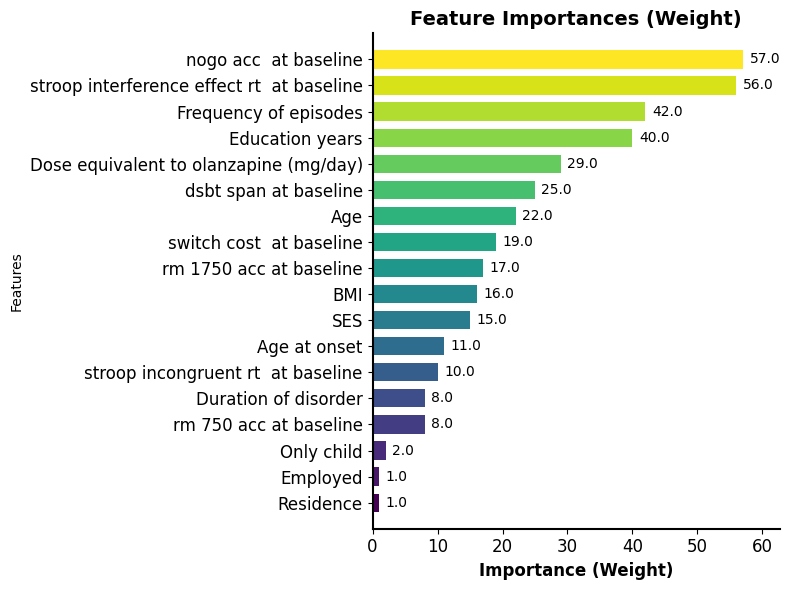

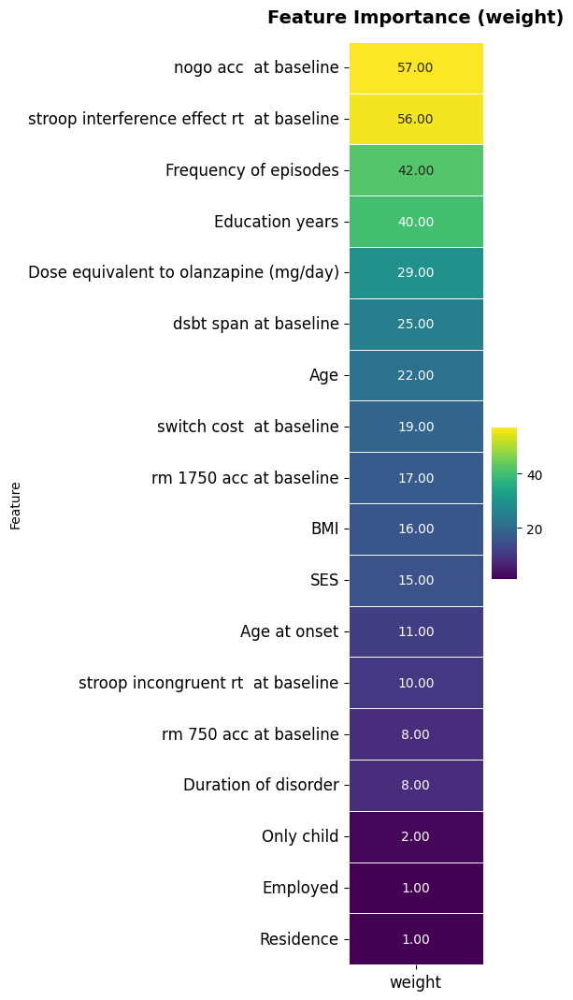

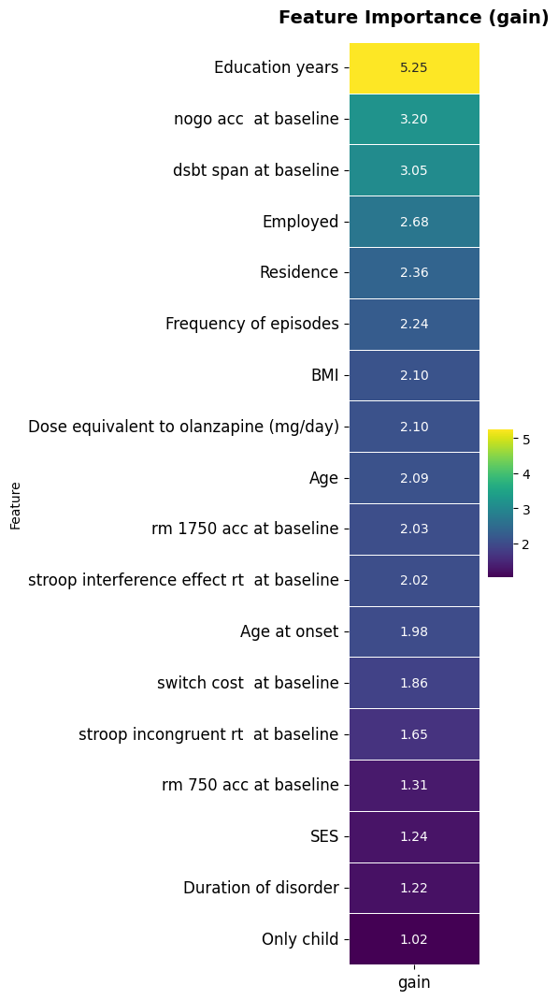

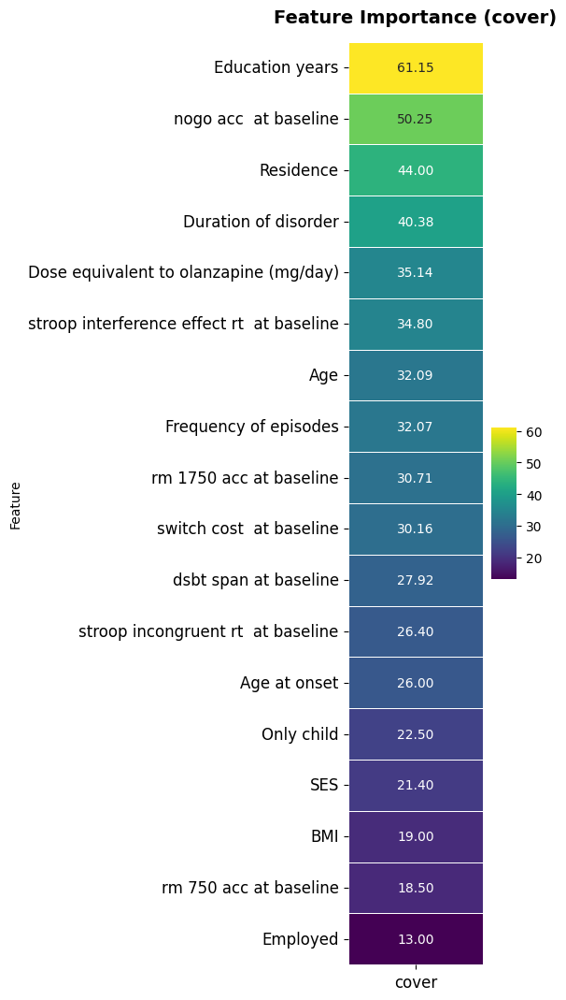

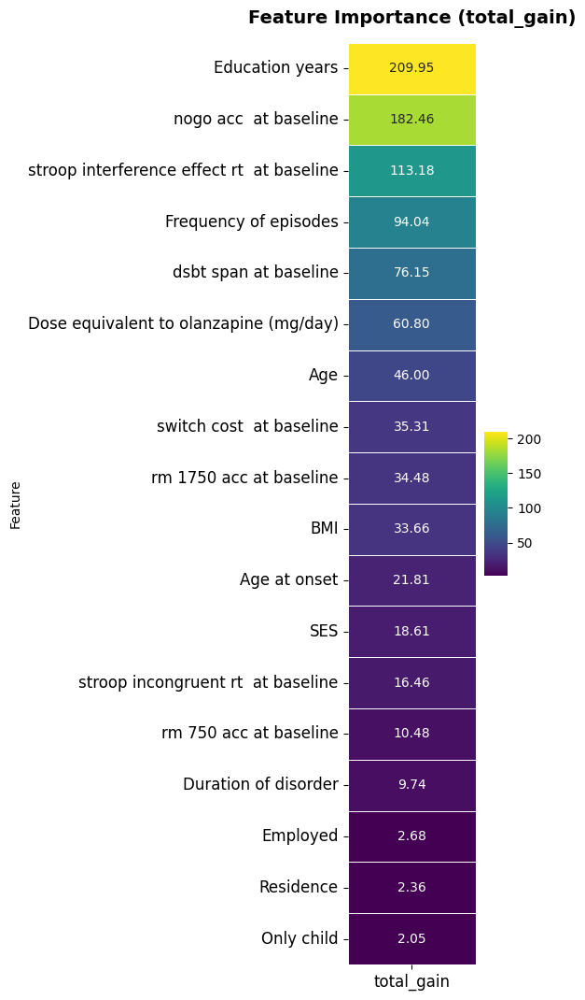

[I 2025-02-21 12:30:56,672] A new study created in memory with name: no-name-63a631dd-c76f-4add-8098-27c42c96b44a


去除第 19 个特征测试集 MSE: 0.04
去除第 19 个特征测试集 R²: 0.4221
去除第 19 个特征 individual-level prediction errors 已保存
去除第 20 个特征: First episode
去除第 20 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:30:59,350] Trial 31 finished with value: 0.1998612600823237 and parameters: {'n_estimators': 102, 'max_depth': 9, 'learning_rate': 0.12360159631188518, 'subsample': 0.7718970782815182, 'colsample_bytree': 0.850324368138017, 'gamma': 0.732515794716264, 'reg_alpha': 0.02959047418890121, 'reg_lambda': 0.03286731348728894, 'min_child_weight': 6}. Best is trial 31 with value: 0.1998612600823237.
[I 2025-02-21 12:30:59,814] Trial 19 finished with value: 0.16225033723544238 and parameters: {'n_estimators': 169, 'max_depth': 4, 'learning_rate': 0.13308137752848653, 'subsample': 0.846807328297646, 'colsample_bytree': 0.6340033515394876, 'gamma': 0.8476396850976097, 'reg_alpha': 0.06833675005800892, 'reg_lambda': 0.03871706239417478, 'min_child_weig

交叉验证结果已保存至 ./table/reduce_20！
最佳参数: {'n_estimators': 230, 'max_depth': 7, 'learning_rate': 0.02194435109751492, 'subsample': 0.9687261520274972, 'colsample_bytree': 0.3857249407028047, 'gamma': 0.43052484413138986, 'reg_alpha': 0.0013463272911854263, 'reg_lambda': 0.001139356354010115, 'min_child_weight': 2}
最佳模型已保存至 ./table/reduce_20/best_model.pkl


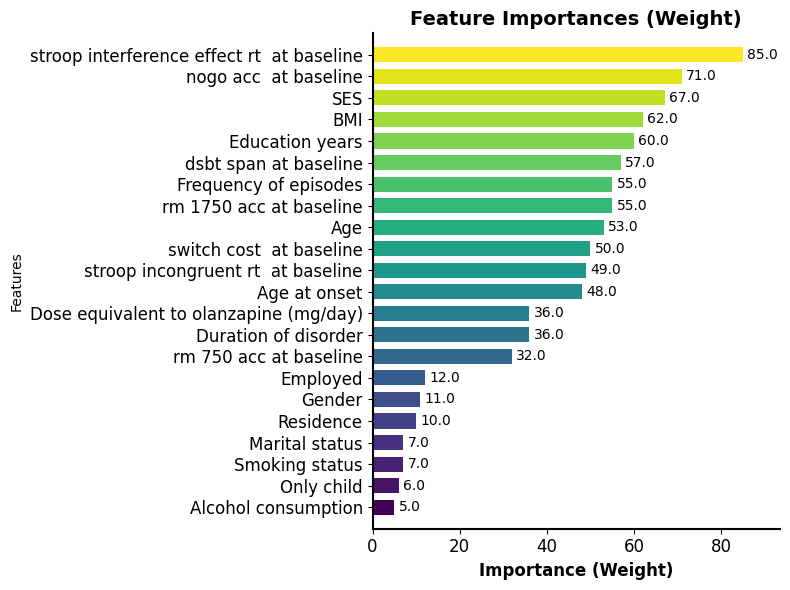

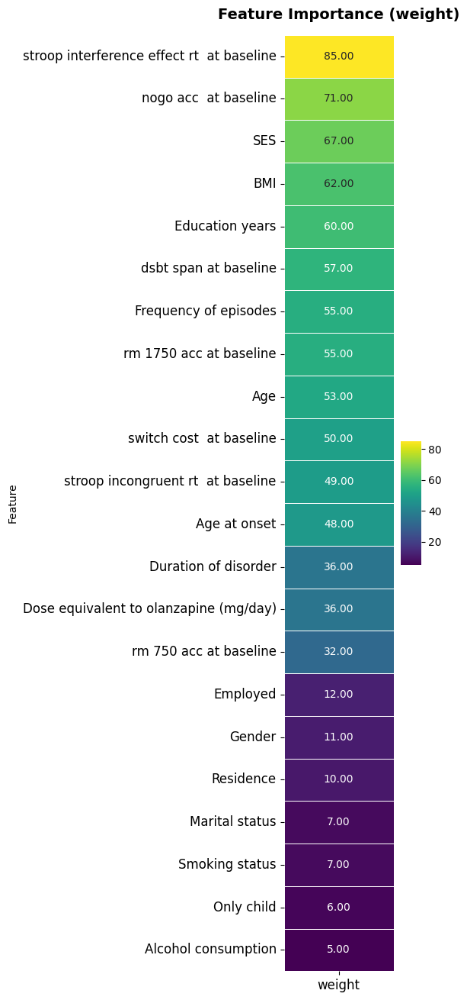

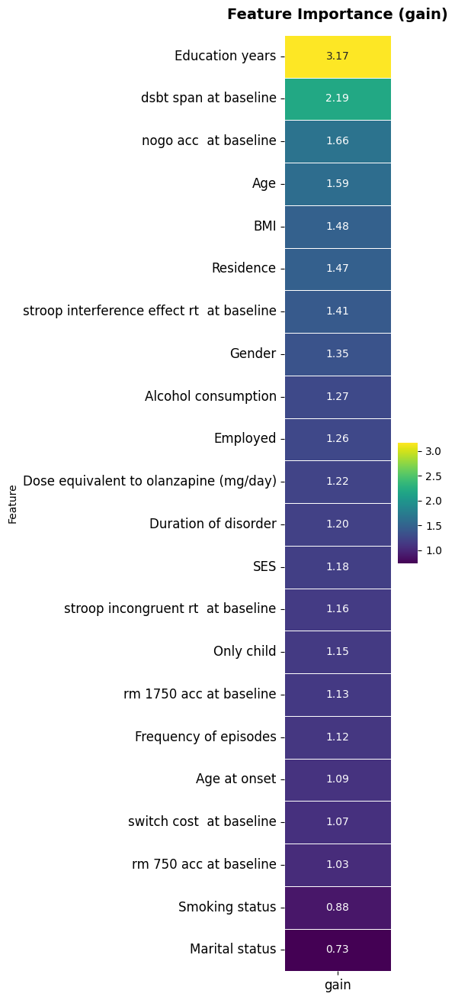

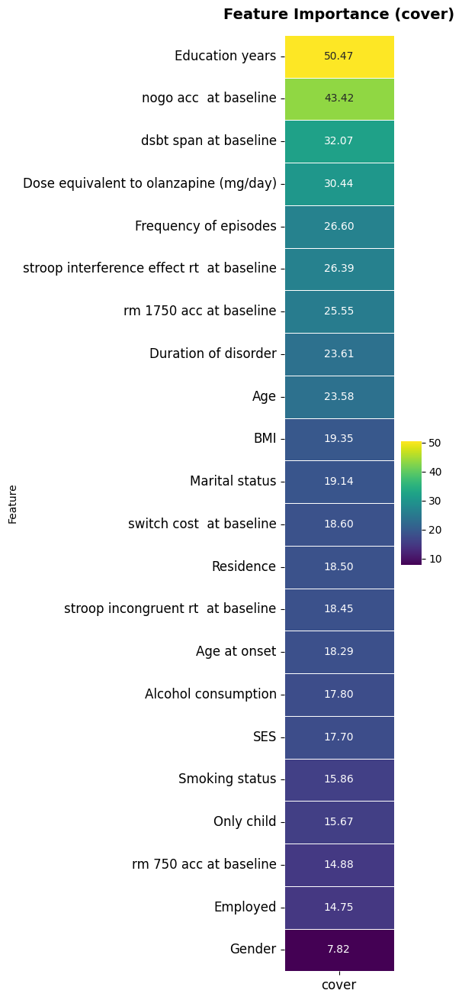

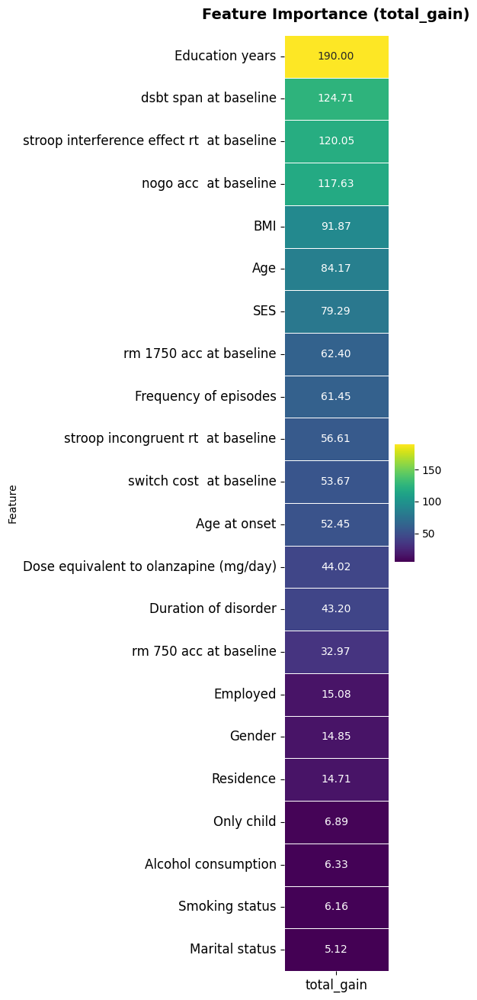

[I 2025-02-21 12:31:38,792] A new study created in memory with name: no-name-ef7920ea-a64e-4575-a252-4320c4cc7a4c


去除第 20 个特征测试集 MSE: 0.04
去除第 20 个特征测试集 R²: 0.4493
去除第 20 个特征 individual-level prediction errors 已保存
去除第 21 个特征: Frequency of episodes
去除第 21 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:31:41,826] Trial 20 finished with value: 0.08580024992629495 and parameters: {'n_estimators': 101, 'max_depth': 8, 'learning_rate': 0.26958931851594653, 'subsample': 0.9496226942330032, 'colsample_bytree': 0.6417264074011875, 'gamma': 0.004447747406866556, 'reg_alpha': 0.003144425779406423, 'reg_lambda': 0.0027551637989464504, 'min_child_weight': 1}. Best is trial 20 with value: 0.08580024992629495.
[I 2025-02-21 12:31:43,121] Trial 26 finished with value: -0.03267183590041878 and parameters: {'n_estimators': 101, 'max_depth': 4, 'learning_rate': 0.13751690818850215, 'subsample': 0.6207643650374257, 'colsample_bytree': 0.8357278214708792, 'gamma': 0.0023528068166644915, 'reg_alpha': 0.274650542317069, 'reg_lambda': 0.270642865280651, 'min_

交叉验证结果已保存至 ./table/reduce_21！
最佳参数: {'n_estimators': 248, 'max_depth': 7, 'learning_rate': 0.08499387453626227, 'subsample': 0.9987253612733912, 'colsample_bytree': 0.4646999874167322, 'gamma': 0.07123474317096001, 'reg_alpha': 0.04206106194921234, 'reg_lambda': 0.5993228665535965, 'min_child_weight': 3}
最佳模型已保存至 ./table/reduce_21/best_model.pkl


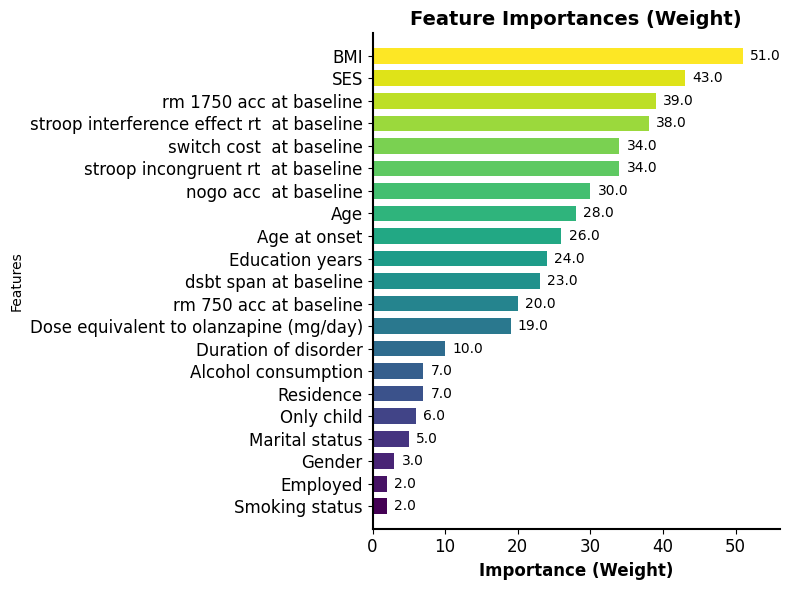

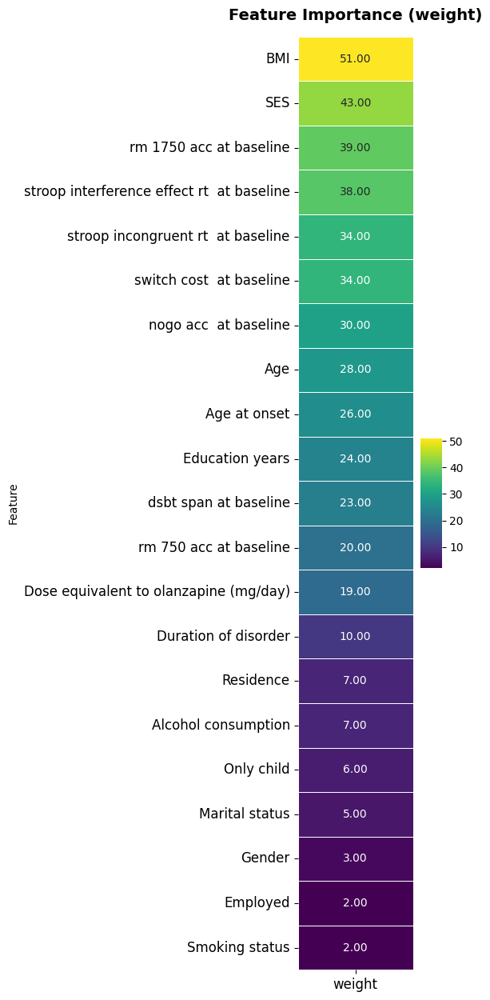

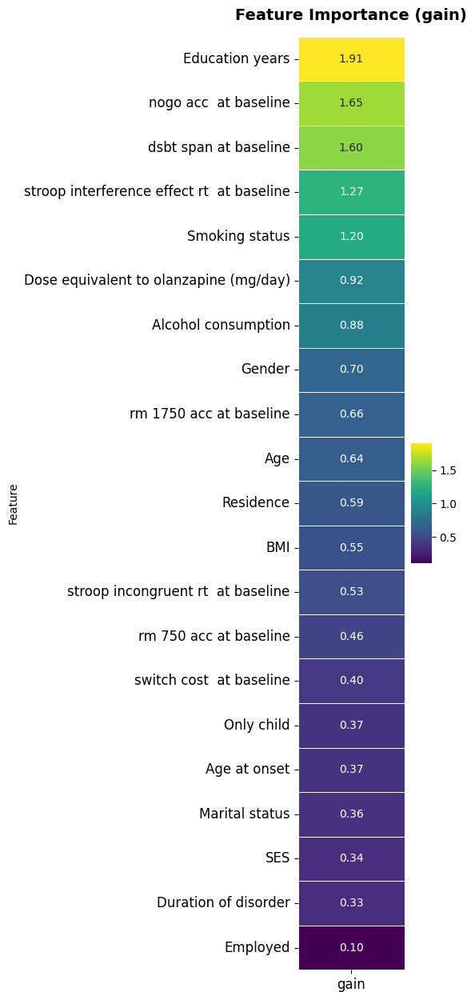

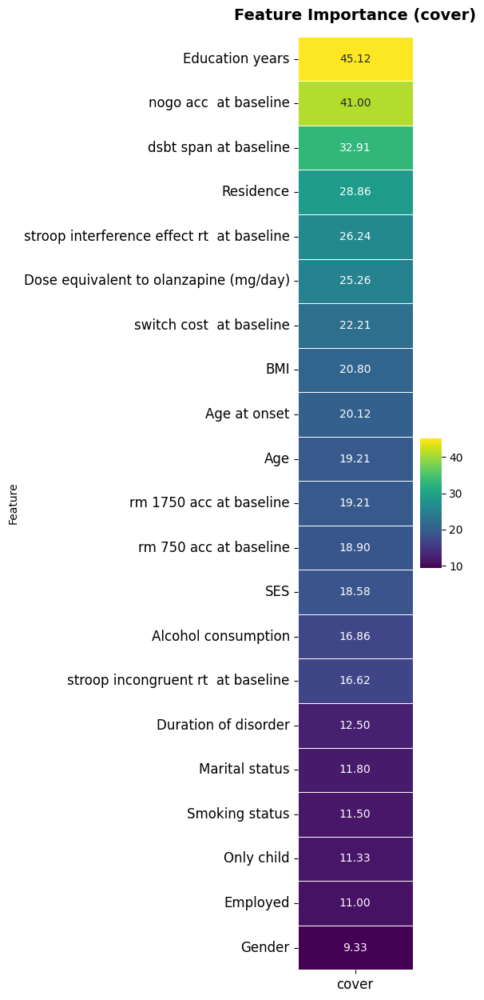

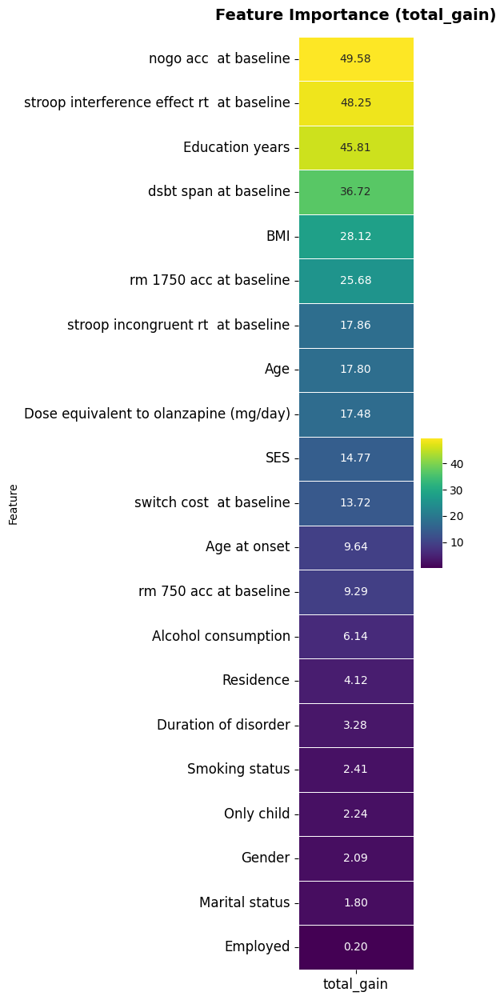

[I 2025-02-21 12:32:09,656] A new study created in memory with name: no-name-f5ee3bbc-476e-445a-b665-39ce188f7b74


去除第 21 个特征测试集 MSE: 0.04
去除第 21 个特征测试集 R²: 0.3938
去除第 21 个特征 individual-level prediction errors 已保存
去除第 22 个特征: Age at onset
去除第 22 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:32:14,157] Trial 25 finished with value: -0.06621104019896602 and parameters: {'n_estimators': 122, 'max_depth': 8, 'learning_rate': 0.17639595433121166, 'subsample': 0.5305797123842704, 'colsample_bytree': 0.4902637047047571, 'gamma': 0.15264454135209718, 'reg_alpha': 0.0025449078410358537, 'reg_lambda': 0.877590780065221, 'min_child_weight': 6}. Best is trial 25 with value: -0.06621104019896602.
[I 2025-02-21 12:32:14,237] Trial 14 finished with value: 0.16306850199041487 and parameters: {'n_estimators': 136, 'max_depth': 9, 'learning_rate': 0.21104396742106707, 'subsample': 0.760301749640522, 'colsample_bytree': 0.5456089122429472, 'gamma': 0.08129467421535536, 'reg_alpha': 0.001604129589783481, 'reg_lambda': 0.008149925843335397, 'min_

交叉验证结果已保存至 ./table/reduce_22！
最佳参数: {'n_estimators': 149, 'max_depth': 7, 'learning_rate': 0.017991717018219184, 'subsample': 0.7318488588134358, 'colsample_bytree': 0.4648179218728971, 'gamma': 0.9471337118711352, 'reg_alpha': 0.0013520393688725098, 'reg_lambda': 0.10510913396447373, 'min_child_weight': 3}
最佳模型已保存至 ./table/reduce_22/best_model.pkl


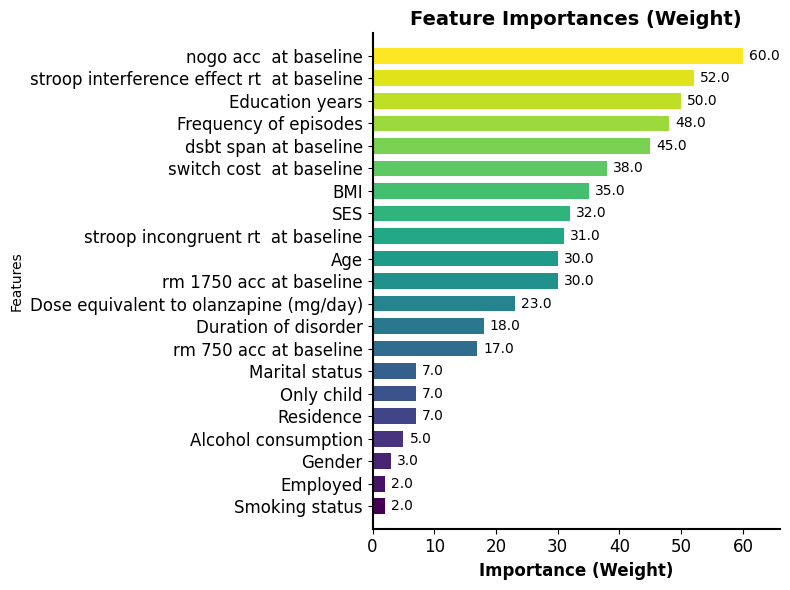

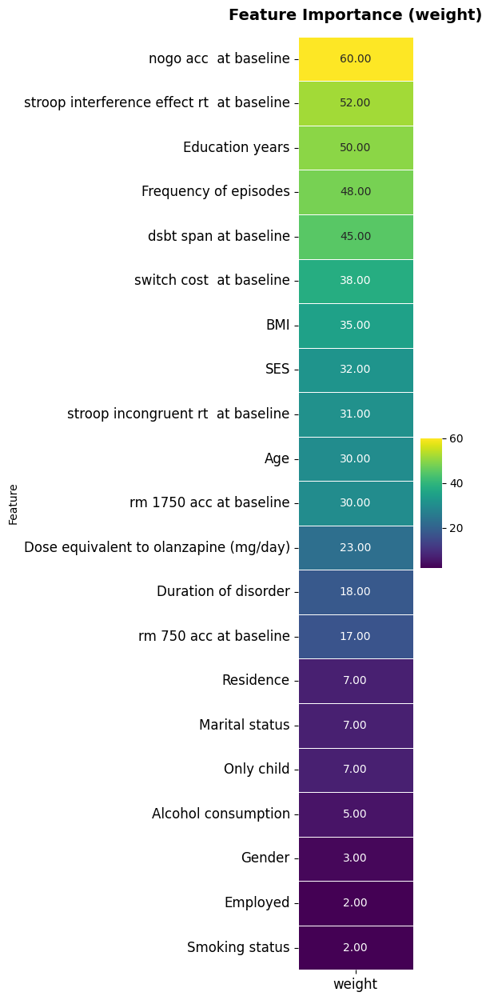

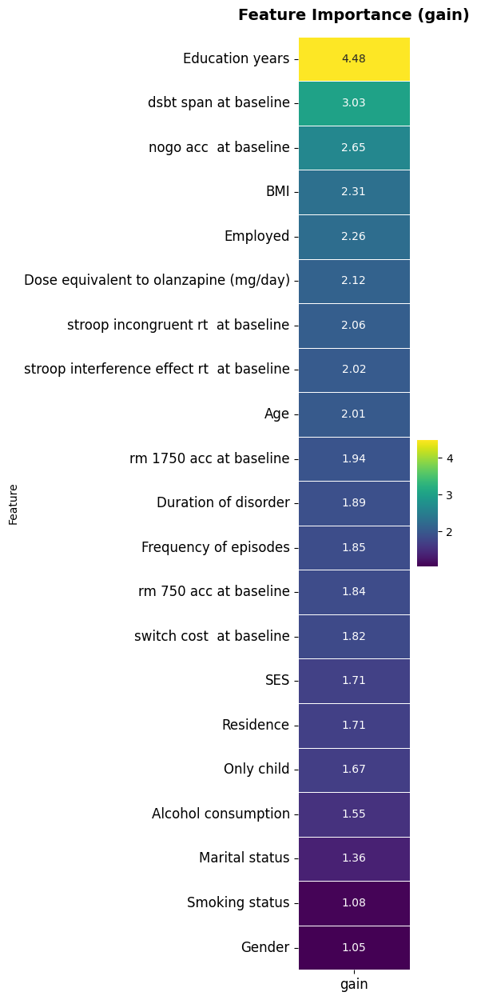

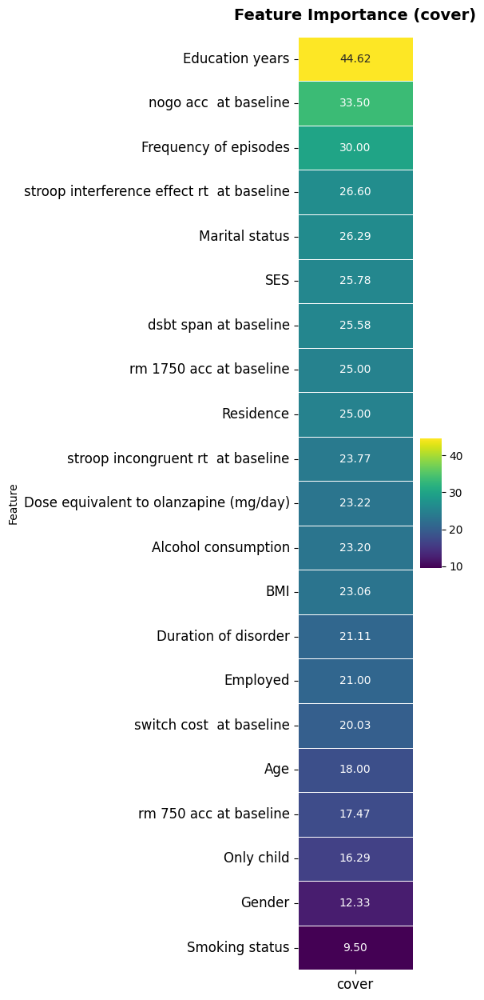

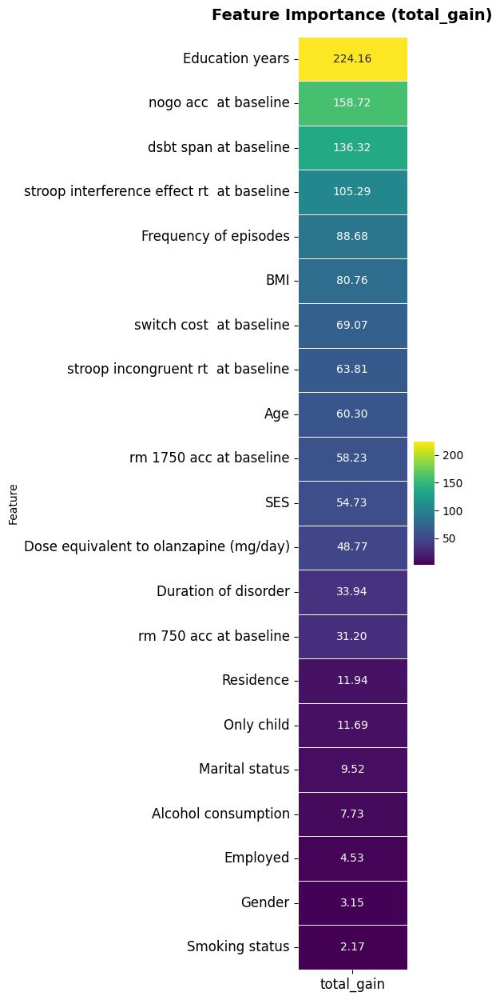

[I 2025-02-21 12:32:40,880] A new study created in memory with name: no-name-c2aa3cf6-e7fa-4140-941f-3a49bcdfd671


去除第 22 个特征测试集 MSE: 0.04
去除第 22 个特征测试集 R²: 0.4690
去除第 22 个特征 individual-level prediction errors 已保存
去除第 23 个特征: Duration of disorder
去除第 23 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:32:45,034] Trial 4 finished with value: 0.19164622040295917 and parameters: {'n_estimators': 111, 'max_depth': 3, 'learning_rate': 0.012519015182644606, 'subsample': 0.6560883832702009, 'colsample_bytree': 0.30251014442001845, 'gamma': 0.18040058576389784, 'reg_alpha': 0.01887798046714626, 'reg_lambda': 0.04533082065586399, 'min_child_weight': 4}. Best is trial 4 with value: 0.19164622040295917.
[I 2025-02-21 12:32:45,355] Trial 22 finished with value: 0.2106673128564113 and parameters: {'n_estimators': 105, 'max_depth': 5, 'learning_rate': 0.03374480098214811, 'subsample': 0.6501569599472234, 'colsample_bytree': 0.5763312823410602, 'gamma': 0.008770422299482657, 'reg_alpha': 0.07667670753665291, 'reg_lambda': 0.09659028065466613, 'min_chi

交叉验证结果已保存至 ./table/reduce_23！
最佳参数: {'n_estimators': 235, 'max_depth': 9, 'learning_rate': 0.013153795080447664, 'subsample': 0.9351062132151454, 'colsample_bytree': 0.46914316901257236, 'gamma': 0.1285085160946134, 'reg_alpha': 0.005203939036322441, 'reg_lambda': 0.010497616512390133, 'min_child_weight': 1}
最佳模型已保存至 ./table/reduce_23/best_model.pkl


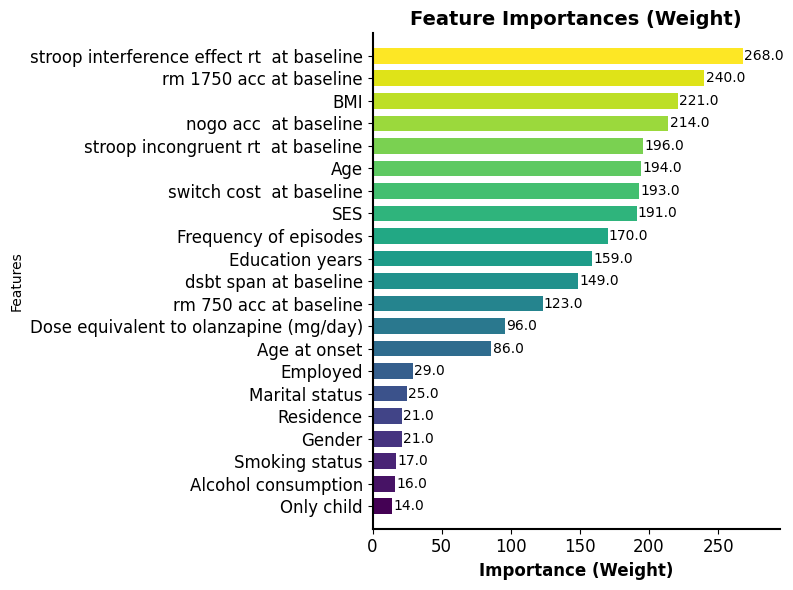

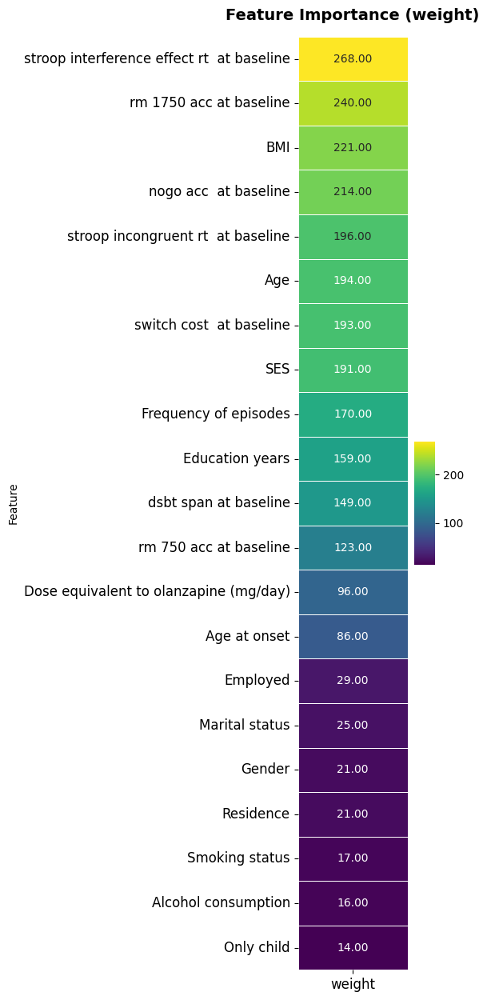

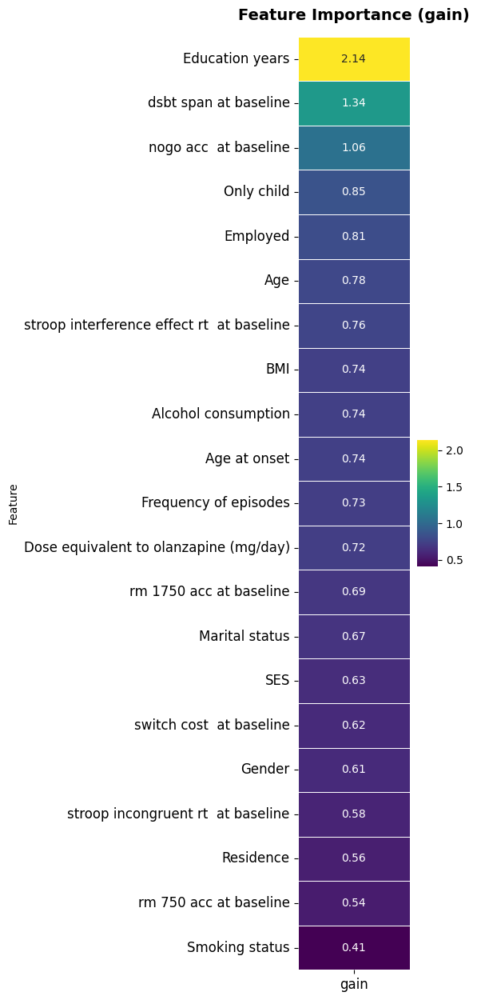

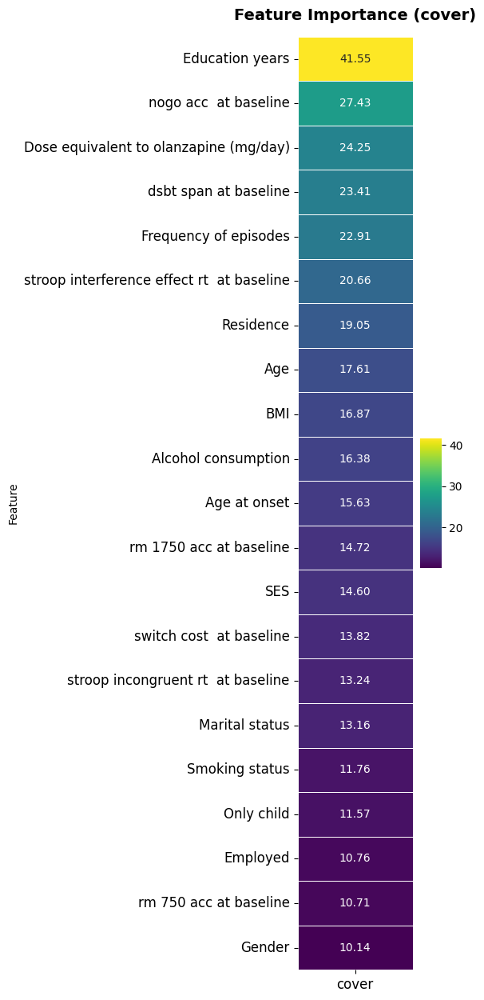

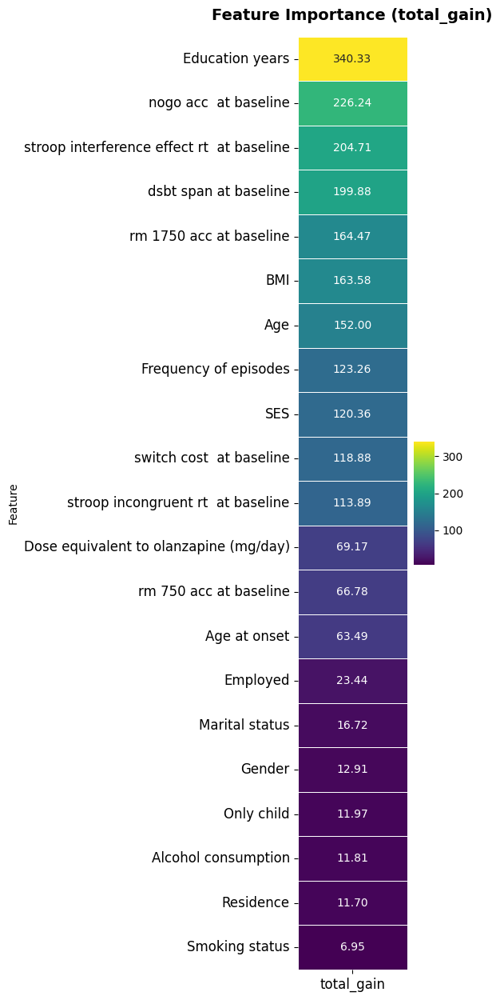

[I 2025-02-21 12:33:15,624] A new study created in memory with name: no-name-684e21e2-c10c-49fe-9ea6-289e9d9b587b


去除第 23 个特征测试集 MSE: 0.04
去除第 23 个特征测试集 R²: 0.4222
去除第 23 个特征 individual-level prediction errors 已保存
去除第 24 个特征: Dose equivalent to olanzapine (mg/day)
去除第 24 个特征后的数据集拆分并保存成功！


d:\python\lib\site-packages\optuna\study\study.py:393: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  warnings.warn(
[I 2025-02-21 12:33:19,463] Trial 20 finished with value: 0.08153918147056569 and parameters: {'n_estimators': 139, 'max_depth': 9, 'learning_rate': 0.14661793049339059, 'subsample': 0.7518415164584652, 'colsample_bytree': 0.4491402864660408, 'gamma': 0.1708413990276618, 'reg_alpha': 0.48801749178805715, 'reg_lambda': 0.0010528036512360683, 'min_child_weight': 6}. Best is trial 20 with value: 0.08153918147056569.
[I 2025-02-21 12:33:20,914] Trial 0 finished with value: 0.22373679201331448 and parameters: {'n_estimators': 192, 'max_depth': 10, 'learning_rate': 0.1335273245857529, 'subsample': 0.9209419162661159, 'colsample_bytree': 0.9367181124845694, 'gamma': 0.012059235925142959, 'reg_alpha': 0.3153380554692576, 'reg_lambda': 0.41661931663794316, 'min_chi

交叉验证结果已保存至 ./table/reduce_24！
最佳参数: {'n_estimators': 497, 'max_depth': 9, 'learning_rate': 0.015514125400099804, 'subsample': 0.8742716987288076, 'colsample_bytree': 0.30185560045322146, 'gamma': 0.9461800859895039, 'reg_alpha': 0.008398473431414262, 'reg_lambda': 0.0028103638571907548, 'min_child_weight': 3}
最佳模型已保存至 ./table/reduce_24/best_model.pkl


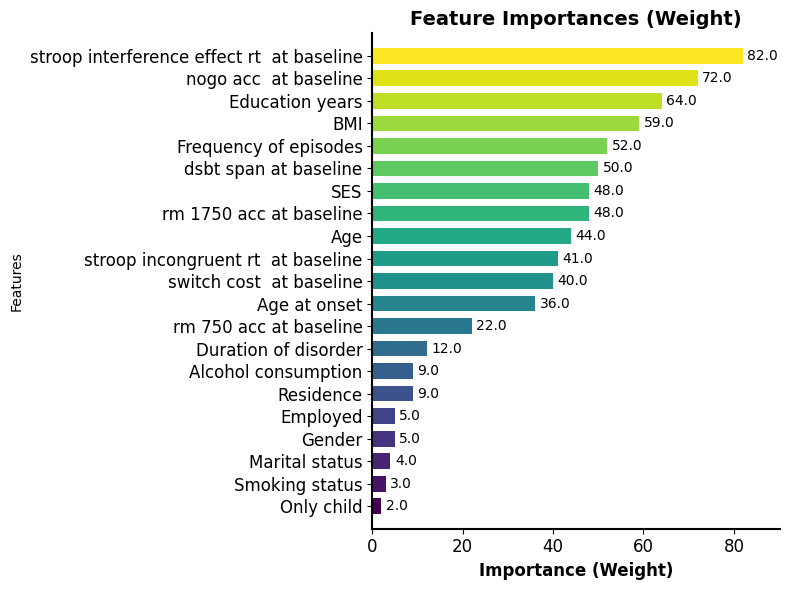

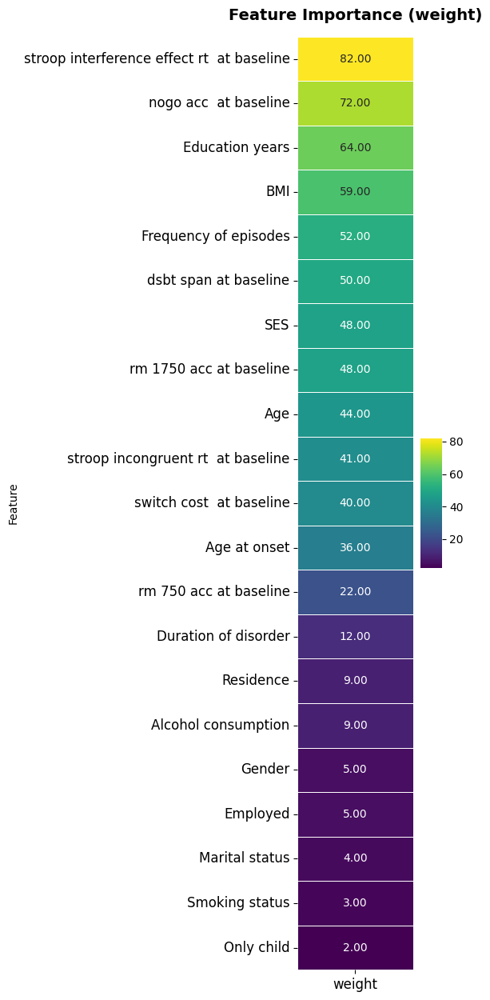

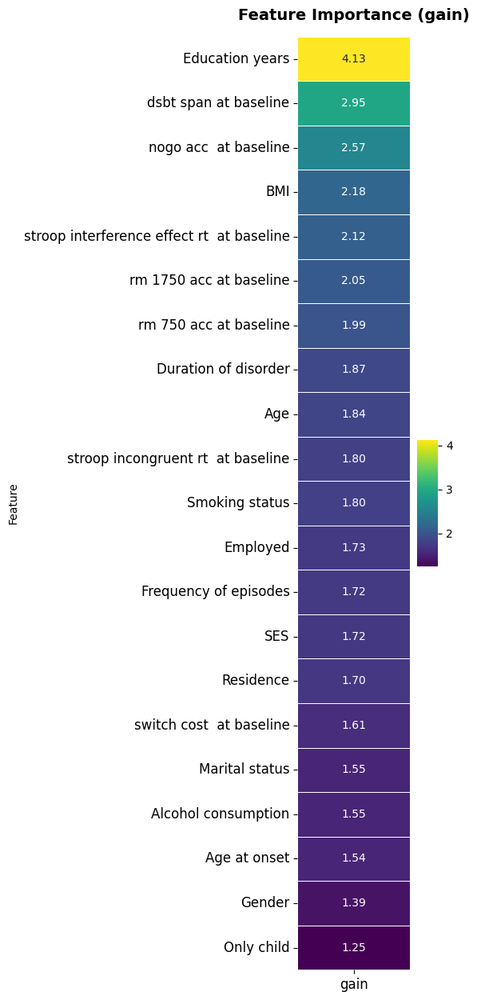

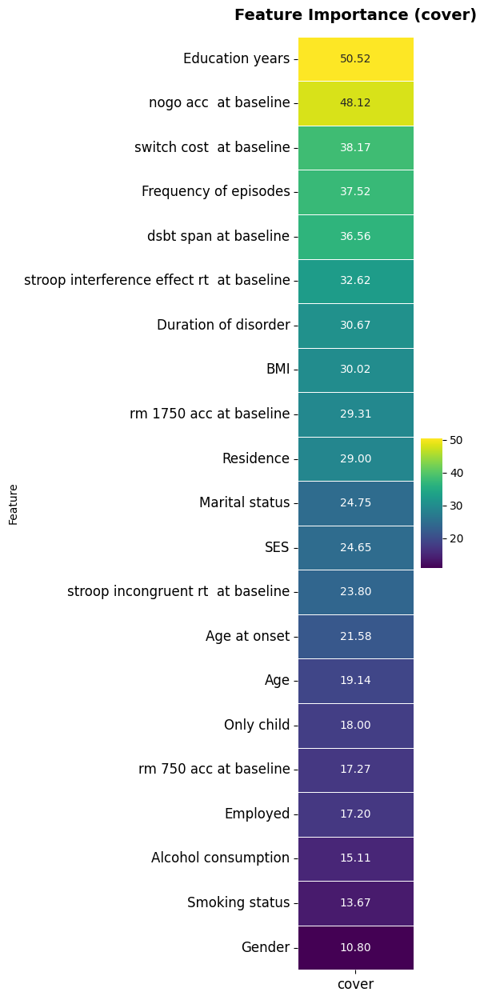

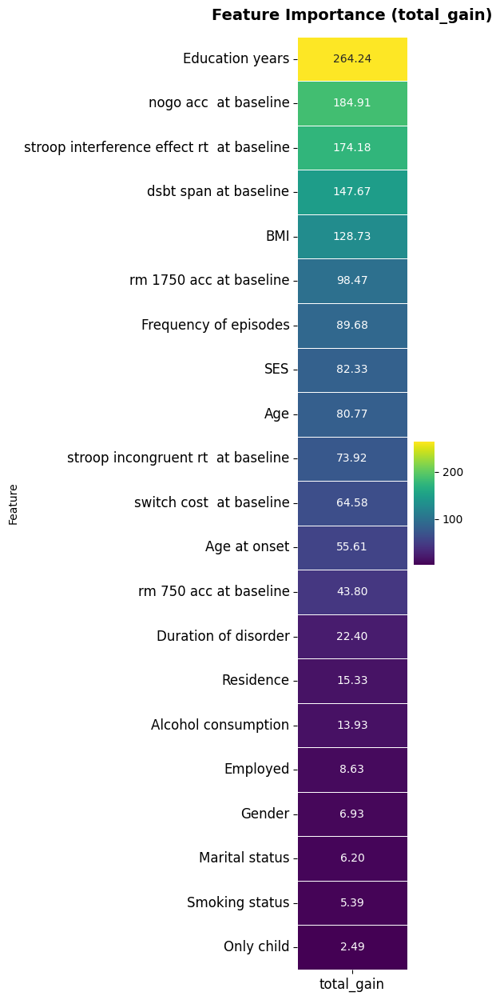

去除第 24 个特征测试集 MSE: 0.04
去除第 24 个特征测试集 R²: 0.4915
去除第 24 个特征 individual-level prediction errors 已保存
所有模型的测试集评估指标已保存至 ./table/test_metrics_summary.xlsx


In [4]:
import os
import random
import joblib
import optuna
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PowerTransformer  # 只保留 Yeo-Johnson 转换器

# -------------------------------
# 设置随机种子
SEED = 2025
np.random.seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# -------------------------------
# 读取数据
file_path = 'preprocessed_data_filled.xlsx'
data = pd.read_excel(file_path)

# 更新基线特征
baseline_features = [
    'rm_1750_acc at baseline', 'rm_750_acc at baseline', 'stroop_incongruent_rt  at baseline',
    'stroop_interference_effect_rt  at baseline', 'nogo_acc  at baseline', 'switch_cost  at baseline',
    'dsbt_span at baseline', 'Age', 'Education years', 'BMI', 'SES', 'Gender', 'Ethnic', 'Residence',
    'Only child', 'Smoking status', 'Alcohol consumption', 'Employed', 'Marital status', 'First episode',
    'Frequency of episodes', 'Age at onset', 'Duration of disorder', 'Dose equivalent to olanzapine (mg/day)'
]

# 目标变量
target = 'prob_change'

X = data[baseline_features]
y_original = data[target].copy()

# 对 Y 进行 Yeo-Johnson 转换
pt = PowerTransformer(method='yeo-johnson')
y_trans = pt.fit_transform(y_original.values.reshape(-1, 1)).flatten()

def inverse_transform(y_transformed):
    return pt.inverse_transform(y_transformed.reshape(-1, 1)).flatten()

# 同时分割 X、转换后的 Y 以及原始 Y（用于最终评估）
X_train, X_test, y_train, y_test, y_train_orig, y_test_orig = train_test_split(
    X, y_trans, y_original, test_size=0.3, random_state=SEED
)

# -------------------------------
# 保存拆分后的数据集（全部特征，X 为原始值，Y 为转换后的值）
os.makedirs("./table/all_features", exist_ok=True)
X_train.to_excel("./table/all_features/X_train.xlsx", index=False)
X_test.to_excel("./table/all_features/X_test.xlsx", index=False)
pd.DataFrame(y_train, columns=[target]).to_excel("./table/all_features/y_train.xlsx", index=False)
pd.DataFrame(y_test, columns=[target]).to_excel("./table/all_features/y_test.xlsx", index=False)
print("全部特征数据集拆分并保存成功！")

# -------------------------------
# 使用 5 折交叉验证
cv = KFold(n_splits=5, shuffle=True, random_state=SEED)

# 设定 Optuna 采样器
sampler = optuna.samplers.TPESampler(seed=SEED)

def run_optuna_and_save_results(X_train_data, y_train, cv, output_dir, feature_names):
    cv_results = []

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
            'gamma': trial.suggest_loguniform('gamma', 1e-3, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-3, 1.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-3, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'objective': 'reg:squarederror',
            'random_state': SEED
        }

        model = xgb.XGBRegressor(**params)
        r2_scores = []

        # 对每折使用 KFold 交叉验证
        for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_data)):
            X_train_fold = X_train_data.iloc[train_idx]
            X_val_fold = X_train_data.iloc[val_idx]
            # 注意：这里 y_train 可能为 Series 或数组，使用 .values 取出对应数组（若 y_train 是 np.array，则直接索引）
            if hasattr(y_train, 'values'):
                y_train_fold = y_train.values[train_idx]
                y_val_fold = y_train.values[val_idx]
            else:
                y_train_fold = y_train[train_idx]
                y_val_fold = y_train[val_idx]

            model.fit(X_train_fold, y_train_fold, verbose=False)
            y_val_pred = model.predict(X_val_fold)
            r2 = r2_score(y_val_fold, y_val_pred)
            r2_scores.append(r2)
            cv_results.append({
                "Fold": fold + 1,
                "R2": r2,
                "MSE": mean_squared_error(y_val_fold, y_val_pred)
            })

        return np.mean(r2_scores)

    # 运行 Optuna 进行优化，此处优化目标为最大化 R2
    study = optuna.create_study(direction='maximize', sampler=sampler)
    study.optimize(objective, n_trials=100, n_jobs=-1)

    # 保存 Optuna 训练历史和交叉验证结果
    history_df = study.trials_dataframe()
    history_df.to_excel(f"{output_dir}/optuna_study.xlsx", index=False)
    cv_results_df = pd.DataFrame(cv_results)
    cv_results_df.to_excel(f"{output_dir}/cross_validation_results.xlsx", index=False)
    print(f"交叉验证结果已保存至 {output_dir}！")

    # 输出最佳参数
    best_params = study.best_params
    print(f"最佳参数: {best_params}")

    # 使用最佳参数训练最终模型
    best_model = xgb.XGBRegressor(**best_params)
    best_model.fit(X_train_data, y_train)

    # 保存模型
    model_path = f"{output_dir}/best_model.pkl"
    joblib.dump(best_model, model_path)
    print(f"最佳模型已保存至 {model_path}")

    # 获取 booster，并手动设置 feature_names
    booster = best_model.get_booster()
    booster.feature_names = feature_names

    # 绘制特征重要性图（如有分裂）
    score_weight = booster.get_score(importance_type='weight')
    if not score_weight:
        print("警告：Booster.get_score() 返回空，模型未进行任何分裂，跳过特征重要性绘图。")
    else:
        fig, ax = plt.subplots(figsize=(8, 6))
        xgb.plot_importance(booster, ax=ax, height=0.7, grid=False)
        import matplotlib.cm as cm
        colormap = plt.get_cmap('viridis', len(ax.patches))
        for i, bar in enumerate(ax.patches):
            bar.set_facecolor(colormap(i))
        new_labels = [label.get_text().replace('_', ' ') for label in ax.get_yticklabels()]
        ax.set_yticklabels(new_labels)
        ax.spines['bottom'].set_linewidth(1.5)
        ax.spines['bottom'].set_color('black')
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['left'].set_color('black')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_title("Feature Importances (Weight)", fontsize=14, fontweight='bold', pad=6)
        ax.set_xlabel("Importance (Weight)", fontsize=12, fontweight='bold')
        ax.tick_params(axis='both', labelsize=12)
        plt.tight_layout()
        plt.savefig(f"{output_dir}/feature_importance_xgb_enhanced.jpg", bbox_inches='tight', dpi=1200)
        plt.show()

        # 绘制各类型特征重要性热图
        importance_scores = {}
        for importance_type in ['weight', 'gain', 'cover', 'total_gain']:
            importance_scores[importance_type] = booster.get_score(importance_type=importance_type)

        for importance_type, scores in importance_scores.items():
            if not scores:
                print(f"警告：特征重要性类型 {importance_type} 返回空。")
                continue
            importance_df = pd.DataFrame({
                'Feature': list(scores.keys()),
                importance_type: list(scores.values())
            }).sort_values(by=importance_type, ascending=False)
            importance_df['Feature'] = importance_df['Feature'].str.replace('_', ' ')
            fig, ax = plt.subplots(figsize=(6, 0.6 * len(scores)))
            sns.heatmap(importance_df.set_index('Feature'), cmap="viridis", annot=True, fmt=".2f",
                        annot_kws={"fontsize": 10}, cbar_kws={"shrink": 0.5, "aspect": 6},
                        linewidths=0.5, ax=ax)
            ax.set_title(f"Feature Importance ({importance_type})", fontsize=14, fontweight='bold', pad=15)
            ax.tick_params(axis='both', labelsize=12, rotation=0)
            plt.tight_layout()
            plt.savefig(f"{output_dir}/feature_importance_heatmap_{importance_type}.jpg", bbox_inches='tight', dpi=1200)
            plt.show()

    return best_model

# -------------------------------
# 运行全部特征的 Optuna 优化并保存结果
# 注意：此处传入的 y_train 是转换后的目标值
best_model_all_features = run_optuna_and_save_results(X_train, y_train, cv, "./table/all_features", baseline_features)

# 对全特征数据进行预测，注意模型输出的是转换后的预测值，需要逆转换回原始尺度
y_train_pred_trans = best_model_all_features.predict(X_train)
y_test_pred_trans = best_model_all_features.predict(X_test)
y_train_pred = inverse_transform(y_train_pred_trans)
y_test_pred = inverse_transform(y_test_pred_trans)

# 计算预测误差（在原始尺度下）
train_errors_all = y_train_orig - y_train_pred
individual_errors_all = y_test_orig - y_test_pred

# 评估模型（原始尺度）
mse_all = mean_squared_error(y_test_orig, y_test_pred)
r2_all = r2_score(y_test_orig, y_test_pred)

print(f"全部特征测试集 MSE: {mse_all:.2f}")
print(f"全部特征测试集 R²: {r2_all:.4f}")

# 保存预测误差（原始尺度）
errors_df_all = pd.DataFrame({
    'Actual': y_test_orig.values, 
    'Predicted': y_test_pred, 
    'Error': individual_errors_all
})
errors_df_all.to_excel("./table/all_features/individual_prediction_errors.xlsx", index=False)

train_errors_df_all = pd.DataFrame({
    'Actual': y_train_orig.values, 
    'Predicted': y_train_pred, 
    'Error': train_errors_all
})
train_errors_df_all.to_excel("./table/all_features/train_prediction_errors.xlsx", index=False)
print("全部特征 individual-level prediction errors 已保存")

# -------------------------------
# 创建一个 DataFrame 来保存所有测试集的评估指标
test_metrics_all_features = pd.DataFrame({
    'Model': ['All Features'],
    'MSE': [mse_all],
    'R2': [r2_all]
})

# -------------------------------
# 循环去除每个特征后进行实验（X 依然使用原始值，Y 使用 Yeo-Johnson 转换）
for i in range(len(baseline_features)):
    # 去除第 i 个特征
    baseline_features_reduced = baseline_features[:i] + baseline_features[i+1:]
    print(f"去除第 {i+1} 个特征: {baseline_features[i]}")

    # 定义去除该特征后的 X 和 Y（Y 使用与全数据相同的转换方式）
    X_reduced = data[baseline_features_reduced]
    y_reduced_original = data[target].copy()

    # 对 Y 进行 Yeo-Johnson 转换
    pt_reduced = PowerTransformer(method='yeo-johnson')
    y_reduced = pt_reduced.fit_transform(y_reduced_original.values.reshape(-1, 1)).flatten()

    def inverse_transform_reduced(y_transformed):
        return pt_reduced.inverse_transform(y_transformed.reshape(-1, 1)).flatten()

    # 同时分割 X、转换后的 Y 和原始 Y
    X_train_reduced, X_test_reduced, y_train_reduced, y_test_reduced, y_train_reduced_orig, y_test_reduced_orig = train_test_split(
        X_reduced, y_reduced, y_reduced_original, test_size=0.3, random_state=SEED
    )

    # 创建保存结果的文件夹
    output_dir = f"./table/reduce_{i+1}"
    os.makedirs(output_dir, exist_ok=True)

    # 保存拆分后的数据集（原始 X 和转换后的 Y）
    X_train_reduced.to_excel(f"{output_dir}/X_train.xlsx", index=False)
    X_test_reduced.to_excel(f"{output_dir}/X_test.xlsx", index=False)
    pd.DataFrame(y_train_reduced, columns=[target]).to_excel(f"{output_dir}/y_train.xlsx", index=False)
    pd.DataFrame(y_test_reduced, columns=[target]).to_excel(f"{output_dir}/y_test.xlsx", index=False)
    print(f"去除第 {i+1} 个特征后的数据集拆分并保存成功！")

    # 运行 Optuna 优化（Y 为转换后的值）
    best_model_reduced = run_optuna_and_save_results(X_train_reduced, y_train_reduced, cv, output_dir, baseline_features_reduced)

    # 预测转换后的目标值
    y_train_pred_reduced_trans = best_model_reduced.predict(X_train_reduced)
    y_test_pred_reduced_trans = best_model_reduced.predict(X_test_reduced)
    # 逆转换回原始尺度
    y_train_pred_reduced = inverse_transform_reduced(y_train_pred_reduced_trans)
    y_test_pred_reduced = inverse_transform_reduced(y_test_pred_reduced_trans)

    # 计算误差（原始尺度）
    train_errors_reduced = y_train_reduced_orig - y_train_pred_reduced
    individual_errors_reduced = y_test_reduced_orig - y_test_pred_reduced

    mse_reduced = mean_squared_error(y_test_reduced_orig, y_test_pred_reduced)
    r2_reduced = r2_score(y_test_reduced_orig, y_test_pred_reduced)

    print(f"去除第 {i+1} 个特征测试集 MSE: {mse_reduced:.2f}")
    print(f"去除第 {i+1} 个特征测试集 R²: {r2_reduced:.4f}")

    # 保存预测误差（原始尺度）
    errors_df_reduced = pd.DataFrame({
        'Actual': y_test_reduced_orig.values, 
        'Predicted': y_test_pred_reduced, 
        'Error': individual_errors_reduced
    })
    errors_df_reduced.to_excel(f"{output_dir}/individual_prediction_errors.xlsx", index=False)

    train_errors_df_reduced = pd.DataFrame({
        'Actual': y_train_reduced_orig.values, 
        'Predicted': y_train_pred_reduced, 
        'Error': train_errors_reduced
    })
    train_errors_df_reduced.to_excel(f"{output_dir}/train_prediction_errors.xlsx", index=False)
    print(f"去除第 {i+1} 个特征 individual-level prediction errors 已保存")

    # 追加到评估指标 DataFrame
    new_row = pd.DataFrame([{
        'Model': f'Reduced {i+1} ({baseline_features[i]})',
        'MSE': mse_reduced,
        'R2': r2_reduced
    }])
    test_metrics_all_features = pd.concat([test_metrics_all_features, new_row], ignore_index=True)

# 保存所有模型的测试集评估指标
test_metrics_all_features.to_excel("./table/test_metrics_summary.xlsx", index=False)
print("所有模型的测试集评估指标已保存至 ./table/test_metrics_summary.xlsx")

### 2.2全特征预测误差

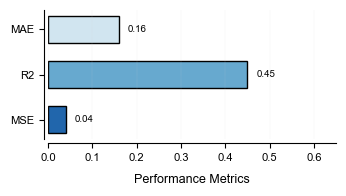

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 设置Nature期刊样式
plt.rcParams.update({
    'font.size': 8,
    'axes.labelsize': 9,
    'axes.titlesize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'font.sans-serif': 'Arial',
    'axes.linewidth': 0.8,
    'lines.linewidth': 1.2,
    'legend.frameon': False,
    'pdf.fonttype': 42,
    'ps.fonttype': 42
})


# 数据准备
metrics = ['MSE', 'R2', 'MAE']
values = [0.04, 0.45, 0.16]
colors = ["#2166ac", "#67a9cf", "#d1e5f0"]  # 蓝色系渐变

# 创建画布
fig, ax = plt.subplots(figsize=(3.5, 2.0))  # Nature标准尺寸

# 绘制水平条形图
y_pos = np.arange(len(metrics))
bars = ax.barh(y_pos, values, 
               color=colors, 
               edgecolor='black',
               linewidth=1,linestyle='-', 
               height=0.6)

# 添加数值标签
for i, (value, color) in enumerate(zip(values, colors)):
    ax.text(value + 0.02, i,
            f"{value:.2f}",
            ha='left', va='center',
            color='black',
            fontsize=7)

# 坐标轴设置
ax.set_yticks(y_pos)
ax.set_yticklabels(metrics)
ax.set_xlim(0, 0.65)
ax.set_xlabel("Performance Metrics", labelpad=8)

# 优化轴线
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position(('outward', 3))
ax.spines['left'].set_position(('outward', 3))

# 网格线设置
ax.grid(True, axis='x', 
        color='lightgray', 
        linestyle=':', 
        linewidth=0.3, 
        alpha=0.7)

# 调整布局
plt.tight_layout()

# 保存高质量图片
plt.savefig("nature_metrics.jpg", 
           dpi=1200,
           bbox_inches='tight')

plt.show()

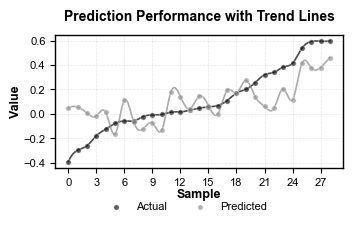

R² = 0.518
MSE = 0.034
RMSE = 0.185
MAE = 0.152
Pearson r = 0.732


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr

# 设置Nature期刊样式参数
plt.rcParams.update({
    'font.size': 7,
    'axes.labelsize': 8,
    'axes.titlesize': 9,
    'xtick.labelsize': 7,
    'ytick.labelsize': 7,
    'font.sans-serif': 'Arial',
    'axes.linewidth': 0.8,
    'lines.linewidth': 1.0,
    'legend.frameon': False,
    'pdf.fonttype': 42,
    'ps.fonttype': 42
})

# 数据加载与处理
df = pd.read_excel("table/all_features/individual_prediction_errors.xlsx", 
                   engine='openpyxl')

# 关键修正：创建严格递增的索引
df = df.sort_values('Actual').reset_index(drop=True)  # 先排序后重置索引

# 计算评估指标
metrics = {
    'R²': r2_score(df['Actual'], df['Predicted']),
    'MSE': mean_squared_error(df['Actual'], df['Predicted']),
    'MAE': mean_absolute_error(df['Actual'], df['Predicted']),
    'Pearson r': pearsonr(df['Actual'], df['Predicted'])[0]
}

# 创建可视化
fig, ax = plt.subplots(figsize=(3.54, 2.36))

# 使用色盲友好配色方案
colors = {
    'actual': '#1a1a1a',  # 蓝色
    'predicted': '#969696'  # 橙色
}

# 生成平滑曲线数据
x_smooth = np.linspace(df.index.min(), df.index.max(), 300)

# 修正后的插值处理
for var, color in zip(['Actual', 'Predicted'], [colors['actual'], colors['predicted']]):
    spl = make_interp_spline(df.index, df[var], k=3)
    y_smooth = spl(x_smooth)
    ax.plot(x_smooth, y_smooth, 
            color=color, 
            lw=1.2, 
            alpha=0.8,
            zorder=1)

# 绘制散点图（保持原代码不变）
ax.scatter(df.index, df['Actual'], 
           c=colors['actual'], alpha=0.7, 
           s=15, edgecolor='w', linewidth=0.4,
           label='Actual', zorder=2)

ax.scatter(df.index, df['Predicted'], 
           c=colors['predicted'], alpha=0.7, 
           s=15, edgecolor='w', linewidth=0.4,
           label='Predicted', zorder=2)

# 8. 图表装饰
plt.title("Prediction Performance with Trend Lines", fontsize=10, pad=10, fontweight='bold')
plt.xlabel("Sample", fontsize=9, labelpad=1, fontweight='bold')
plt.ylabel("Value", fontsize=9, labelpad=1, fontweight='bold')
plt.xticks(np.arange(0, 29, 3), fontsize=8)  # Set X-axis from 0 to 30 with an interval of 2
plt.yticks(fontsize=8)
plt.legend(fontsize=8, frameon=False, bbox_to_anchor=(0.77, -0.18),ncol=2)
plt.grid(alpha=0.3, zorder=0, linewidth=0.5, linestyle='--')

# 9. 加粗外边框线条并设置为黑色
ax = plt.gca()  # Get current axis
ax.spines['top'].set_linewidth(1)
ax.spines['top'].set_color('black')
ax.spines['right'].set_linewidth(1)
ax.spines['right'].set_color('black')
ax.spines['left'].set_linewidth(1)
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(1)
ax.spines['bottom'].set_color('black')

# 10. 优化布局
plt.tight_layout()

# 11. 保存为1200dpi的JPG
plt.savefig('prediction_performance.jpg', dpi=1200, format='jpg')

plt.show()
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# 1. 加载数据
df = pd.read_excel("table/all_features/individual_prediction_errors.xlsx", 
                   engine='openpyxl')

# 2. 创建样本索引
df.reset_index(inplace=True)

# 3. 计算评估指标
metrics = {
    'R²': r2_score(df['Actual'], df['Predicted']),
    'MSE': mean_squared_error(df['Actual'], df['Predicted']),
    'RMSE': np.sqrt(mean_squared_error(df['Actual'], df['Predicted'])),
    'MAE': mean_absolute_error(df['Actual'], df['Predicted']),
    'Pearson r': pearsonr(df['Actual'], df['Predicted'])[0]
}

# 4. 打印评估指标
print(f"R² = {metrics['R²']:.3f}")
print(f"MSE = {metrics['MSE']:.3f}")
print(f"RMSE = {metrics['RMSE']:.3f}")
print(f"MAE = {metrics['MAE']:.3f}")
print(f"Pearson r = {metrics['Pearson r']:.3f}")


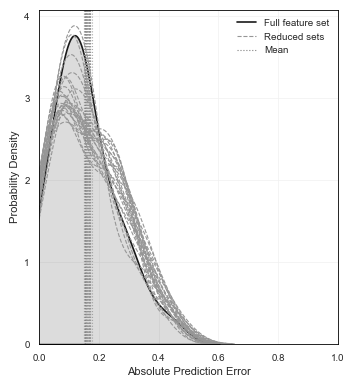

In [20]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 设置Nature期刊样式参数
plt.rcParams.update({
    'font.size': 7,
    'axes.labelsize': 8,
    'axes.titlesize': 9,
    'xtick.labelsize': 7,
    'ytick.labelsize': 7,
    'font.sans-serif': 'Arial',
    'axes.linewidth': 0.8,
    'lines.linewidth': 1.2,
    'legend.frameon': False,
    'pdf.fonttype': 42,
    'ps.fonttype': 42
})

def load_all_errors(base_path):
    """加载所有误差数据并标记来源"""
    file_pattern = os.path.join(base_path, '**', 'individual_prediction_errors.xlsx')
    file_list = glob.glob(file_pattern, recursive=True)
    
    dfs = []
    for file in file_list:
        try:
            df = pd.read_excel(file)
            if 'Error' in df.columns:
                # 转换特征集标签
                dir_name = os.path.basename(os.path.dirname(file))
                df['source'] = 'Full feature set' if dir_name.lower() == 'all_features' else f'Reduced {dir_name.split("_")[-1]}'
                dfs.append(df)
        except Exception as e:
            print(f"Error reading {file}: {str(e)}")
    
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# 数据加载与预处理
base_path = './table'
df_all = load_all_errors(base_path)
df_all['Error'] = df_all['Error'].abs()

# 创建可视化
fig, ax = plt.subplots(figsize=(3.54, 5.8*(2/3)))  # Nature标准尺寸比例

# 使用科学配色方案
palette = {
    'full': '#1a1a1a',        # 黑色
    'reduced': '#969696'      # 灰色
}

# 按特征集分组绘制
for source, group in df_all.groupby('source'):
    is_full = 'Full' in source
    color = palette['full'] if is_full else palette['reduced']
    linestyle = '-' if is_full else '--'
    
    # 计算统计量
    mean_error = group['Error'].mean()
    median_error = group['Error'].median()
    
    # 绘制密度曲线
    sns.kdeplot(
        data=group, 
        x='Error',
        color=color,
        linestyle=linestyle,
        linewidth=1.2 if is_full else 0.8,
        fill=is_full,
        alpha=0.15 if is_full else 0,
        label=source
    )
    
    # 添加均值标记
    ax.axvline(mean_error, 
               color=color, 
               linestyle=':', 
               linewidth=0.8, 
               alpha=0.8)

# 添加统计图例
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color=palette['full'], lw=1.2, label='Full feature set'),
    Line2D([0], [0], color=palette['reduced'], lw=0.8, linestyle='--', label='Reduced sets'),
    Line2D([0], [0], color='gray', linestyle=':', lw=0.8, label='Mean')
]

# 坐标轴设置
ax.set_xlim(0, 1)
ax.set_ylim(0, None)
ax.set_xlabel("Absolute Prediction Error", labelpad=3)
ax.set_ylabel("Probability Density", labelpad=3)

# 刻度优化
ax.xaxis.set_major_locator(plt.MultipleLocator(0.2))
ax.xaxis.set_minor_locator(plt.MultipleLocator(0.05))
ax.yaxis.set_major_locator(plt.MaxNLocator(5))

# 网格和边框
ax.grid(True, axis='both', color='#F0F0F0', linestyle='-', linewidth=0.5)
for spine in ax.spines.values():
    spine.set_color('black')
    spine.set_linewidth(0.6)

# 图例设置
ax.legend(handles=legend_elements, 
          loc='upper right',
          frameon=False,
          borderaxespad=0.5,
          handlelength=2)

# 紧凑布局
plt.tight_layout(pad=1)

# 保存出版级图片
plt.savefig('nature_error_density.jpg', 
            dpi=1200)

plt.show()

### 2.3置换检验

Bootstrap Analysis Results:
                  Removed Feature  Folder Number  \
0                     rm_1750_acc              1   
1                      rm_750_acc              2   
2           stroop_incongruent_rt              3   
3   stroop_interference_effect_rt              4   
4                        nogo_acc              5   
5                     switch_cost              6   
6                       dsbt_span              7   
7                             Age              8   
8                 Education years              9   
9                             BMI             10   
10                            SES             11   
11                         Gender             12   
12                         Ethnic             13   
13                      Residence             14   
14                     Only child             15   
15                 Smoking status             16   
16            Alcohol consumption             17   
17                       Employed   

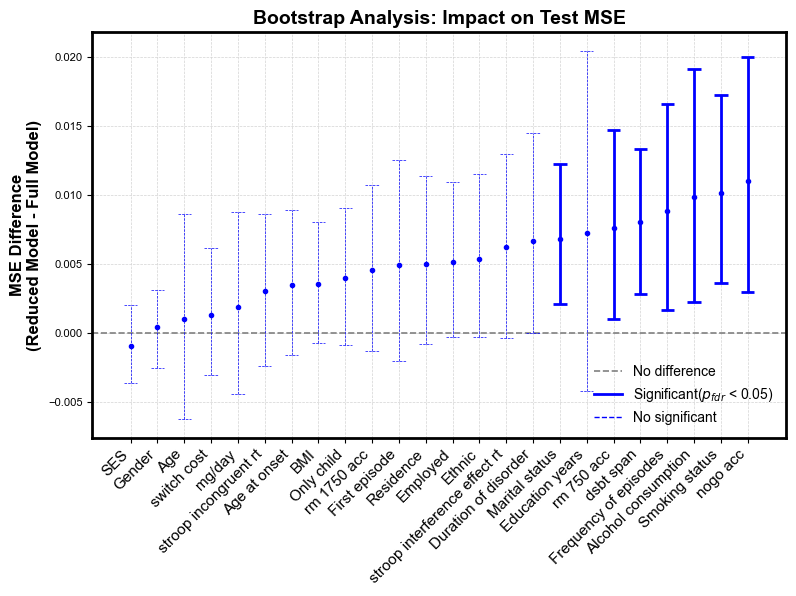

MSE bootstrap analysis plot saved to ./table/bootstrap_metrics_difference_MSE_plot.jpg


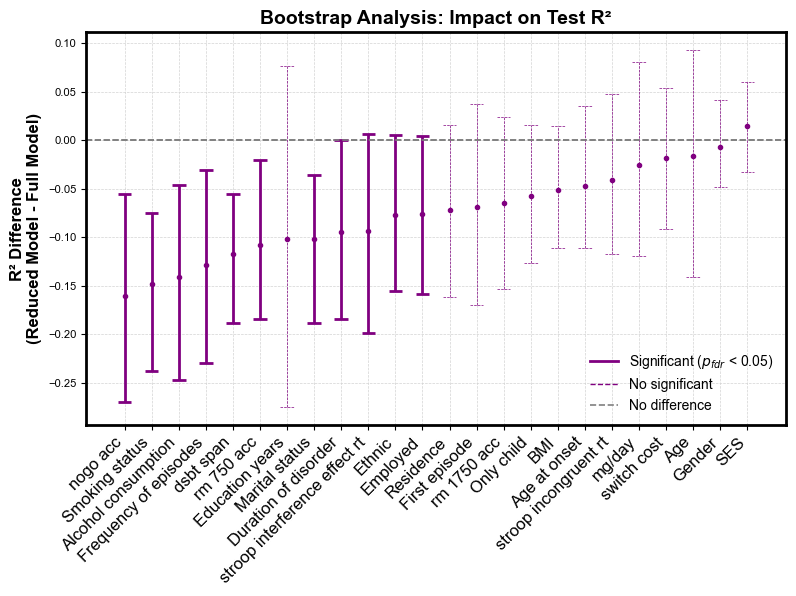

R² bootstrap analysis plot saved to ./table/bootstrap_metrics_difference_R2_plot.jpg


In [20]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.multitest import multipletests

# Set random seed for reproducibility
SEED = 2025
np.random.seed(SEED)

# Define bootstrap function to calculate MSE and R² differences distribution
def bootstrap_metrics_diff(full_y, full_pred, red_y, red_pred, n_bootstrap=1000):
    mse_diffs = []
    r2_diffs = []
    n = len(full_y)
    indices = np.arange(n)
    for _ in range(n_bootstrap):
        sample_idx = np.random.choice(indices, size=n, replace=True)
        # Sample true values and predicted values for full and reduced models
        full_y_sample = full_y[sample_idx]
        full_pred_sample = full_pred[sample_idx]
        red_y_sample = red_y[sample_idx]
        red_pred_sample = red_pred[sample_idx]
        
        # Calculate full model metrics
        mse_full = mean_squared_error(full_y_sample, full_pred_sample)
        r2_full = r2_score(full_y_sample, full_pred_sample)
        
        # Calculate reduced model metrics
        mse_red = mean_squared_error(red_y_sample, red_pred_sample)
        r2_red = r2_score(red_y_sample, red_pred_sample)
        
        mse_diffs.append(mse_red - mse_full)
        r2_diffs.append(r2_red - r2_full)
        
    return {
        'mse_diffs': np.array(mse_diffs),
        'r2_diffs': np.array(r2_diffs)
    }

# -------------------------
# Load full model prediction results
# -------------------------
baseline_file = "./table/all_features/individual_prediction_errors.xlsx"
if not os.path.exists(baseline_file):
    raise FileNotFoundError(f"File not found: {baseline_file}")
baseline_df = pd.read_excel(baseline_file)
# Extract full model true values and predicted values
full_y = baseline_df['Actual'].to_numpy()
full_pred = baseline_df['Predicted'].to_numpy()

# -------------------------
# Load reduced model summary file
# -------------------------
summary_file = "./table/test_metrics_summary.xlsx"
if not os.path.exists(summary_file):
    raise FileNotFoundError(f"File not found: {summary_file}")
summary_df = pd.read_excel(summary_file)

# Helper function: Extract feature name from model name
def parse_feature_name(model_str):
    if "(" in model_str and ")" in model_str:
        feature = model_str.split("(")[-1].split(")")[0].strip()
        feature = feature.replace("at baseline", "").strip()
        return feature
    else:
        return model_str.replace("at baseline", "").strip()

# -------------------------
# Loop through each reduced model for bootstrap analysis
# -------------------------
bootstrap_results = []
n_bootstrap = 3000

for idx, row in summary_df.iterrows():
    model_name = row['Model']
    if model_name.strip() == "All Features":
        continue  # Skip full model row
    
    tokens = model_name.split()
    if tokens[0] != "Reduced":
        continue
    try:
        folder_num = int(tokens[1])
    except Exception as e:
        print(f"Unable to parse folder number from model name {model_name}: {e}")
        continue
    feature_removed = parse_feature_name(model_name)
    
    # Construct the path for reduced model prediction results file
    reduced_file = f"./table/reduce_{folder_num}/individual_prediction_errors.xlsx"
    if not os.path.exists(reduced_file):
        print(f"File {reduced_file} does not exist, skipping {model_name}")
        continue
    reduced_df = pd.read_excel(reduced_file)
    red_y = reduced_df['Actual'].to_numpy()
    red_pred = reduced_df['Predicted'].to_numpy()
    
    # Perform bootstrap analysis for MSE and R²
    boot_results = bootstrap_metrics_diff(full_y, full_pred, red_y, red_pred, n_bootstrap=n_bootstrap)
    
    # Compute mean differences and 95% confidence intervals
    mse_mean_diff = np.mean(boot_results['mse_diffs'])
    mse_lower_ci = np.percentile(boot_results['mse_diffs'], 2.5)
    mse_upper_ci = np.percentile(boot_results['mse_diffs'], 97.5)
    mse_significant = (mse_lower_ci > 0) or (mse_upper_ci < 0)
    
    r2_mean_diff = np.mean(boot_results['r2_diffs'])
    r2_lower_ci = np.percentile(boot_results['r2_diffs'], 2.5)
    r2_upper_ci = np.percentile(boot_results['r2_diffs'], 97.5)
    
    # Compute p-value for R² differences (based on FDR correction)
    p_value_r2 = np.mean(boot_results['r2_diffs'] >= 0)
    _, p_value_r2_fdr, _, _ = multipletests([p_value_r2], alpha=0.05, method='fdr_bh')
    p_value_r2_fdr = p_value_r2_fdr[0]
    
    # Significance based on the FDR-corrected p-value
    r2_significant = p_value_r2_fdr < 0.05
    
    bootstrap_results.append({
        "Removed Feature": feature_removed,
        "Folder Number": folder_num,
        "MSE Difference (Reduced - Full)": mse_mean_diff,
        "MSE 2.5% CI": mse_lower_ci,
        "MSE 97.5% CI": mse_upper_ci,
        "MSE Significant": mse_significant,
        "R2 Difference (Reduced - Full)": r2_mean_diff,
        "R2 2.5% CI": r2_lower_ci,
        "R2 97.5% CI": r2_upper_ci,
        "R2 Significant": r2_significant,
        "R2 p-value (FDR corrected)": p_value_r2_fdr
    })

# Convert bootstrap results to DataFrame and save to Excel
bootstrap_df = pd.DataFrame(bootstrap_results)
print("Bootstrap Analysis Results:")
print(bootstrap_df)
bootstrap_output_file = "./table/bootstrap_metrics_comparison.xlsx"
bootstrap_df.to_excel(bootstrap_output_file, index=False)
print(f"Bootstrap analysis results saved to {bootstrap_output_file}")

# 1. MSE difference plot
df_mse = bootstrap_df.sort_values("MSE Difference (Reduced - Full)")
labels_mse = [s.replace("_", " ").replace("at baseline", "").strip() for s in df_mse["Removed Feature"]]
capwidth = 0.25

fig, ax = plt.subplots(figsize=(8, 6))
x_mse = np.arange(len(df_mse))
y_mse = df_mse["MSE Difference (Reduced - Full)"].values
lower_bound_mse = df_mse["MSE 2.5% CI"].values
upper_bound_mse = df_mse["MSE 97.5% CI"].values

# Add horizontal line at 0 for reference
ax.axhline(0, color='grey', linestyle='--', label="No difference")

for i, x in enumerate(x_mse):
    y_val = y_mse[i]
    lower = lower_bound_mse[i]
    upper = upper_bound_mse[i]
    signif = df_mse.iloc[i]["MSE Significant"]
    ls = '-' if signif else '--'  # Solid line for significant, dashed for non-significant
    lw = 2 if signif else 0.5     # Thicker line for significant
    ax.vlines(x, lower, upper, colors='blue', linestyles=ls, linewidth=lw)
    ax.hlines(upper, x - capwidth, x + capwidth, colors='blue', linestyles=ls, linewidth=lw)
    ax.hlines(lower, x - capwidth, x + capwidth, colors='blue', linestyles=ls, linewidth=lw)
    ax.plot(x, y_val, 'o', color='blue', markersize=3)

# Manually add the legend for dashed (Non-Significant) and solid (Significant) lines
ax.plot([], [], color='blue', lw=2, label='Significant($p_{fdr}$ < 0.05)', linestyle='-')  # Solid line for significant
ax.plot([], [], color='blue', lw=1, label='No significant', linestyle='--')  # Dashed line for non-significant

# Show the legend for all elements
ax.legend(fontsize=10, loc='lower right', frameon=False)

ax.set_xticks(x_mse)
ax.set_xticklabels(labels_mse, rotation=45, ha='right', fontsize=11)
ax.set_ylabel("MSE Difference\n(Reduced Model - Full Model)", fontsize=12, fontweight='bold')
ax.set_title("Bootstrap Analysis: Impact on Test MSE", fontsize=14, fontweight='bold')
ax.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')
plt.tight_layout()
mse_plot_file = "./table/bootstrap_metrics_difference_MSE_plot.jpg"
plt.savefig(mse_plot_file, dpi=1200)
plt.show()
print(f"MSE bootstrap analysis plot saved to {mse_plot_file}")

# 2. R² difference plot
df_r2 = bootstrap_df.sort_values("R2 Difference (Reduced - Full)")
labels_r2 = [s.replace("_", " ").replace("at baseline", "").strip() for s in df_r2["Removed Feature"]]
capwidth = 0.25

fig, ax = plt.subplots(figsize=(8, 6))
x_r2 = np.arange(len(df_r2))
y_r2 = df_r2["R2 Difference (Reduced - Full)"].values
lower_bound_r2 = df_r2["R2 2.5% CI"].values
upper_bound_r2 = df_r2["R2 97.5% CI"].values

ax.axhline(0, color='grey', linestyle='--')

for i, x in enumerate(x_r2):
    y_val = y_r2[i]
    lower = lower_bound_r2[i]
    upper = upper_bound_r2[i]
    signif = df_r2.iloc[i]["R2 Significant"]
    ls = '-' if signif else '--'  # Solid line for significant, dashed for non-significant
    lw = 2 if signif else 0.5     # Thicker line for significant
    label = "Significant (pFDR < 0.05)" if signif else "Non-Significant"
    ax.vlines(x, lower, upper, colors='purple', linestyles=ls, linewidth=lw)
    ax.hlines(upper, x - capwidth, x + capwidth, colors='purple', linestyles=ls, linewidth=lw)
    ax.hlines(lower, x - capwidth, x + capwidth, colors='purple', linestyles=ls, linewidth=lw)
    ax.plot(x, y_val, 'o', color='purple', markersize=3)

# Manually add the legend for dashed (Non-Significant) and solid (Significant) lines
ax.plot([], [], color='purple', lw=2, label='Significant ($p_{fdr}$ < 0.05)', linestyle='-')  # Solid line for significant
ax.plot([], [], color='purple', lw=1, label='No significant', linestyle='--')  # Dashed line for non-significant
ax.axhline(0, color='grey', linestyle='--', label="No difference")  # Horizontal line at 0

ax.set_xticks(x_r2)
ax.set_xticklabels(labels_r2, rotation=45, ha='right', fontsize=12)
ax.set_ylabel("R² Difference\n(Reduced Model - Full Model)", fontsize=12, fontweight='bold')
ax.set_title("Bootstrap Analysis: Impact on Test R²", fontsize=14, fontweight='bold')
ax.legend(fontsize=10, loc='lower right', frameon=False)
ax.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')
plt.tight_layout()
r2_plot_file = "./table/bootstrap_metrics_difference_R2_plot.jpg"
plt.savefig(r2_plot_file, dpi=1200)
plt.show()
print(f"R² bootstrap analysis plot saved to {r2_plot_file}")

Bootstrap Analysis Results:
                  Removed Feature  Folder Number  \
0                     rm_1750_acc              1   
1                      rm_750_acc              2   
2           stroop_incongruent_rt              3   
3   stroop_interference_effect_rt              4   
4                        nogo_acc              5   
5                     switch_cost              6   
6                       dsbt_span              7   
7                             Age              8   
8                 Education years              9   
9                             BMI             10   
10                            SES             11   
11                         Gender             12   
12                         Ethnic             13   
13                      Residence             14   
14                     Only child             15   
15                 Smoking status             16   
16            Alcohol consumption             17   
17                       Employed   

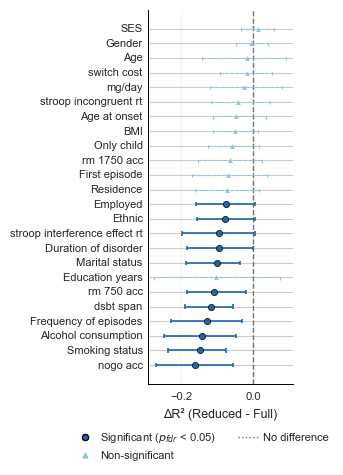

In [10]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.multitest import multipletests

# Set random seed for reproducibility
SEED = 2025
np.random.seed(SEED)

# Define bootstrap function to calculate R² differences distribution
def bootstrap_metrics_diff(full_y, full_pred, red_y, red_pred, n_bootstrap=1000):
    r2_diffs = []
    n = len(full_y)
    indices = np.arange(n)
    for _ in range(n_bootstrap):
        sample_idx = np.random.choice(indices, size=n, replace=True)
        # Sample true values and predicted values for full and reduced models
        full_y_sample = full_y[sample_idx]
        full_pred_sample = full_pred[sample_idx]
        red_y_sample = red_y[sample_idx]
        red_pred_sample = red_pred[sample_idx]
        
        # Calculate full model metrics
        r2_full = r2_score(full_y_sample, full_pred_sample)
        
        # Calculate reduced model metrics
        r2_red = r2_score(red_y_sample, red_pred_sample)
        
        r2_diffs.append(r2_red - r2_full)
        
    return {
        'r2_diffs': np.array(r2_diffs)
    }

# -------------------------
# Load full model prediction results
# -------------------------
baseline_file = "./table/all_features/individual_prediction_errors.xlsx"
if not os.path.exists(baseline_file):
    raise FileNotFoundError(f"File not found: {baseline_file}")
baseline_df = pd.read_excel(baseline_file)
# Extract full model true values and predicted values
full_y = baseline_df['Actual'].to_numpy()
full_pred = baseline_df['Predicted'].to_numpy()

# -------------------------
# Load reduced model summary file
# -------------------------
summary_file = "./table/test_metrics_summary.xlsx"
if not os.path.exists(summary_file):
    raise FileNotFoundError(f"File not found: {summary_file}")
summary_df = pd.read_excel(summary_file)

# Helper function: Extract feature name from model name
def parse_feature_name(model_str):
    if "(" in model_str and ")" in model_str:
        feature = model_str.split("(")[-1].split(")")[0].strip()
        feature = feature.replace("at baseline", "").strip()
        return feature
    else:
        return model_str.replace("at baseline", "").strip()

# -------------------------
# Loop through each reduced model for bootstrap analysis
# -------------------------
bootstrap_results = []
n_bootstrap = 3000

for idx, row in summary_df.iterrows():
    model_name = row['Model']
    if model_name.strip() == "All Features":
        continue  # Skip full model row
    
    tokens = model_name.split()
    if tokens[0] != "Reduced":
        continue
    try:
        folder_num = int(tokens[1])
    except Exception as e:
        print(f"Unable to parse folder number from model name {model_name}: {e}")
        continue
    feature_removed = parse_feature_name(model_name)
    
    # Construct the path for reduced model prediction results file
    reduced_file = f"./table/reduce_{folder_num}/individual_prediction_errors.xlsx"
    if not os.path.exists(reduced_file):
        print(f"File {reduced_file} does not exist, skipping {model_name}")
        continue
    reduced_df = pd.read_excel(reduced_file)
    red_y = reduced_df['Actual'].to_numpy()
    red_pred = reduced_df['Predicted'].to_numpy()
    
    # Perform bootstrap analysis for R²
    boot_results = bootstrap_metrics_diff(full_y, full_pred, red_y, red_pred, n_bootstrap=n_bootstrap)
    
    # Compute mean differences and 95% confidence intervals
    r2_mean_diff = np.mean(boot_results['r2_diffs'])
    r2_lower_ci = np.percentile(boot_results['r2_diffs'], 2.5)
    r2_upper_ci = np.percentile(boot_results['r2_diffs'], 97.5)
    
    # Compute p-value for R² differences (based on FDR correction)
    p_value_r2 = np.mean(boot_results['r2_diffs'] >= 0)
    _, p_value_r2_fdr, _, _ = multipletests([p_value_r2], alpha=0.05, method='fdr_bh')
    p_value_r2_fdr = p_value_r2_fdr[0]
    
    # Significance based on the FDR-corrected p-value
    r2_significant = p_value_r2_fdr < 0.05
    
    bootstrap_results.append({
        "Removed Feature": feature_removed,
        "Folder Number": folder_num,
        "R2 Difference (Reduced - Full)": r2_mean_diff,
        "R2 2.5% CI": r2_lower_ci,
        "R2 97.5% CI": r2_upper_ci,
        "R2 Significant": r2_significant,
        "R2 p-value (FDR corrected)": p_value_r2_fdr
    })

# Convert bootstrap results to DataFrame and save to Excel
bootstrap_df = pd.DataFrame(bootstrap_results)
print("Bootstrap Analysis Results:")
print(bootstrap_df)
bootstrap_output_file = "./table/bootstrap_metrics_comparison_R2_only.xlsx"
bootstrap_df.to_excel(bootstrap_output_file, index=False)
print(f"Bootstrap analysis results saved to {bootstrap_output_file}")
import matplotlib.pyplot as plt
import numpy as np

# 设置Nature期刊样式
plt.rcParams.update({
    'font.size': 8,
    'axes.labelsize': 9,
    'axes.titlesize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'font.sans-serif': 'Arial',
    'axes.linewidth': 0.8,
    'lines.linewidth': 1.2,
    'legend.frameon': False,
    'pdf.fonttype': 42,
    'ps.fonttype': 42
})

# 配色方案（Nature风格蓝色系）
palette = {
    'significant': '#2166AC',  # 深蓝
    'nonsig': '#92C5DE',       # 浅蓝
    'grid': '#F0F0F0',         # 浅灰
    'zero_line': '#737373'     # 中灰
}

# 数据处理
df_r2 = bootstrap_df.sort_values("R2 Difference (Reduced - Full)")
labels_r2 = [s.replace("_", " ").replace("at baseline", "").strip() for s in df_r2["Removed Feature"]]
capwidth = 0.15  # 调整误差条端帽宽度

# 创建画布
fig, ax = plt.subplots(figsize=(3.84, 4.72))  # Nature标准尺寸比例（85mm宽）

# 绘制基准线
ax.axvline(0, color=palette['zero_line'], linestyle='--', lw=1.0, zorder=1)

# 主绘图循环
y_pos = np.arange(len(df_r2))
for i, y in enumerate(y_pos):
    x_val = df_r2["R2 Difference (Reduced - Full)"].iloc[i]
    lower = df_r2["R2 2.5% CI"].iloc[i]
    upper = df_r2["R2 97.5% CI"].iloc[i]
    signif = df_r2.iloc[i]["R2 Significant"]
    
    # 根据显著性设置样式
    line_style = '-' if signif else (0, (3, 1.5))  # 实线/点划线
    line_color = palette['significant'] if signif else palette['nonsig']
    line_width = 1.2 if signif else 0.8
    
    # 绘制误差线
    ax.hlines(y, lower, upper, 
              colors=line_color, 
              linestyles=line_style,
              linewidth=line_width,
              zorder=2)
    
    # 误差条端帽
    ax.vlines([lower, upper], y - capwidth, y + capwidth,
              colors=line_color,
              linestyles=line_style,
              linewidth=line_width,
              zorder=2)
    
    # 中心点标记
    ax.plot(x_val, y, 
            marker='o' if signif else '^',  # 显著用圆形，非显著用三角形
            ms=4.5 if signif else 3.5,
            color=line_color,
            markeredgewidth=0.5,
            markeredgecolor='k' if signif else 'none',
            zorder=3)

# 坐标轴设置
ax.set_yticks(y_pos)
ax.set_yticklabels(labels_r2, 
                   fontsize=8,
                   verticalalignment='center')
ax.set_xlabel("ΔR² (Reduced - Full)", 
              fontsize=9,
              labelpad=4)
ax.xaxis.set_tick_params(pad=2)
ax.yaxis.set_tick_params(pad=0)

# 图例定制
legend_elements = [
    plt.Line2D([0], [0], 
               marker='o', color=palette['significant'], 
               markeredgecolor='k', lw=0,
               markersize=4.5, label='Significant ($p_{fdr}$ < 0.05)'),
    plt.Line2D([0], [0], 
               marker='^', color=palette['nonsig'], 
               lw=0, markersize=3.5,
               label='Non-significant'),
    plt.Line2D([0], [0], 
               color=palette['zero_line'], linestyle=':', lw=1.0,
               label='No difference')
]

ax.legend(handles=legend_elements,
          loc='upper right',
          bbox_to_anchor=(1.28, -0.11),  # 右侧外部
          frameon=False,
          handletextpad=0.3,
          borderaxespad=0.,ncol=2)

# 图形优化
ax.spines[['top', 'right']].set_visible(False)
ax.spines[['left', 'bottom']].set_color('k')
ax.spines[['left', 'bottom']].set_linewidth(0.7)

ax.grid(True, 
        axis='x', 
        color=palette['grid'], 
        linestyle='-', 
        linewidth=0.5,
        zorder=0)

# 紧凑布局
plt.tight_layout(pad=0.8)

# 保存出版级图片
plt.savefig("nature_style_r2_diff.jpg", 
            dpi=1200, 
            bbox_inches='tight')

plt.show()

## 3.多元回归验证

### 3.1识别后的单变量回归结果

回归结果已保存为 regression_results_forest_plot.xlsx


Regression Results:

                                 Predictor  Coefficient  Lower CI  Upper CI  P-Value    R²
                                  Employed       -0.042    -0.151     0.068    0.449 0.006
        stroop_incongruent_rt  at baseline       -0.050    -0.100    -0.000    0.049 0.041
                      Duration of disorder       -0.048    -0.098     0.003    0.064 0.037
                            Marital status        0.014    -0.049     0.078    0.654 0.002
                    rm_750_acc at baseline        0.062     0.012     0.111    0.016 0.062
                     dsbt_span at baseline        0.121     0.076     0.166    0.000 0.239
                       Alcohol consumption        0.004    -0.080     0.087    0.931 0.000
                     Frequency of episodes       -0.011    -0.062     0.040    0.678 0.002
                            Smoking status       -0.013    -0.066     0.041    0.644 0.002
                     n

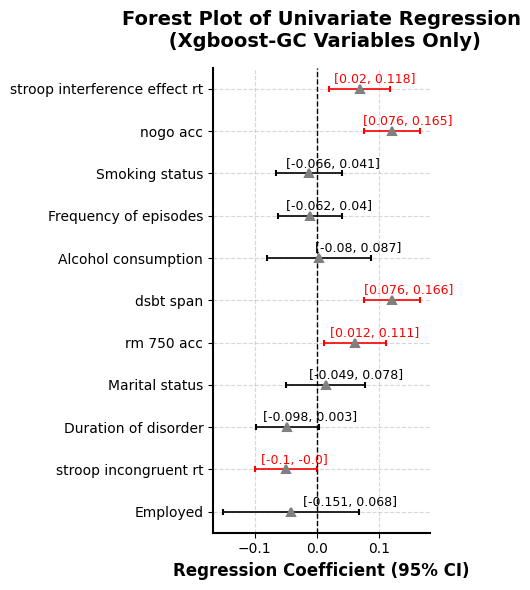

In [13]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np

# 读取 Excel 数据
file_path = "preprocessed_data_filled.xlsx"  # 请确保文件路径正确
df = pd.read_excel(file_path)

# 确保数据包含所需变量
target_var = "prob_change"

predictors = [     'Employed', 'stroop_incongruent_rt  at baseline', 'Duration of disorder',
    'Marital status', 
    'rm_750_acc at baseline',
    'dsbt_span at baseline',
    'Alcohol consumption','Frequency of episodes',  'Smoking status', 
    'nogo_acc  at baseline', 'stroop_interference_effect_rt  at baseline',
]

# 检查缺失的列
missing_columns = [col for col in [target_var] + predictors if col not in df.columns]
if missing_columns:
    raise ValueError(f"Missing columns in dataset: {missing_columns}")

# 存储回归结果
results = []

# 单变量回归分析
for predictor in predictors:
    X = df[predictor]
    X = sm.add_constant(X)  # 添加截距项
    y = df[target_var]

    # 运行 OLS 回归
    model = sm.OLS(y, X, missing='drop').fit()

    # 确保回归模型有多个参数，才能计算置信区间
    if len(model.params) > 1:  # 确保有系数参数
        # 计算 95% 置信区间（获取截距后第一个参数的置信区间）
        ci_lower, ci_upper = model.conf_int().iloc[1]
    else:
        # 如果只有截距项，置信区间无法计算，设置为 NaN
        ci_lower, ci_upper = (None, None)
    
    results.append({
        "Predictor": predictor,
        "Coefficient": round(model.params.iloc[1], 3) if len(model.params) > 1 else round(model.params.iloc[0], 3),  # 回归系数
        "Lower CI": round(ci_lower, 3) if ci_lower is not None else None,  # 置信区间下界
        "Upper CI": round(ci_upper, 3) if ci_upper is not None else None,  # 置信区间上界
        "P-Value": round(model.pvalues.iloc[1], 3) if len(model.params) > 1 else round(model.pvalues.iloc[0], 3),  # P 值
        "R²": round(model.rsquared, 3)  # 决定系数
    })

# 转换为 DataFrame
results_df = pd.DataFrame(results)

# **保存结果到 Excel**
results_df.to_excel("./table/regression_results_forest_plot_单变量.xlsx", index=False)
print("回归结果已保存为 regression_results_forest_plot.xlsx")

# **打印结果为三线表**
print("\n\nRegression Results:\n")
print(results_df.to_string(index=False))

# **优化森林图**
fig, ax = plt.subplots(figsize=(4.5, 6))

# 使用数值型 y 坐标（即每个变量对应其索引），并在后面设置正确的 y tick 标签
for i, row in results_df.iterrows():
    color = "red" if row["P-Value"] < 0.05 else "black"  # 根据 P 值设定颜色
    y_pos = i  # 数值型 y 坐标

    # 绘制误差棒
    ax.errorbar(
        row["Coefficient"], y_pos, 
        xerr=[[row["Coefficient"] - row["Lower CI"]], [row["Upper CI"] - row["Coefficient"]]],
        fmt='^', color="grey", ecolor=color, capsize=2, elinewidth=1.2, markeredgewidth=1.5
    )

    # 在点旁边标注“[下界, 上界]”，y 方向上增加 0.05 个单位
    # 检查 CI 是否有效并避免绘制 NaN 或无效值
    if pd.notna(row["Lower CI"]) and pd.notna(row["Upper CI"]) and \
       not np.isinf(row["Lower CI"]) and not np.isinf(row["Upper CI"]):
        ax.text(
            row["Upper CI"] - 0.09, y_pos + 0.22, 
            f"[{row['Lower CI']}, {row['Upper CI']}]",
            fontsize=9, verticalalignment='center', color=color
        )

# 设置 y 轴刻度和标签，将每个变量名中的 "at baseline" 删除，同时替换下划线为空格并去除多余空格
ax.set_yticks(range(len(results_df)))
ax.set_yticklabels([pred.replace("at baseline", "").replace('_', ' ').strip() 
                    for pred in results_df["Predictor"]])

# 添加参考线（x=0）
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)

# 设置标题和轴标签
ax.set_xlabel("Regression Coefficient (95% CI)", fontsize=12, fontweight='bold')
ax.set_title("Forest Plot of Univariate Regression\n (Xgboost-GC Variables Only)", 
      fontsize=14, fontweight='bold', pad=15)

# 增强网格线可读性
ax.grid(True, linestyle="--", alpha=0.5)
# 隐藏右侧 Y 轴和顶部 X 轴
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# 设置左侧和底部的边框线宽和颜色
for spine in ['left', 'bottom']:
    ax.spines[spine].set_linewidth(1.5)
    ax.spines[spine].set_color('black')
plt.tight_layout()
plt.show()
fig.savefig("./image/forest_plot-GC_Variables_Only-sing_variable.jpg", dpi=1200, bbox_inches='tight')

### 3.2识别后的多变量回归结果

回归结果已保存为 regression_results_forest_plot_multivariable.xlsx


Regression Results:

                                 Predictor  Coefficient  P-Value  Lower CI  Upper CI
                                 Intercept        0.118    0.323    -0.118     0.355
                                  Employed       -0.035    0.475    -0.133     0.062
        stroop_incongruent_rt  at baseline       -0.009    0.749    -0.062     0.045
                      Duration of disorder       -0.007    0.776    -0.058     0.044
                            Marital status        0.020    0.459    -0.034     0.074
                    rm_750_acc at baseline       -0.014    0.624    -0.071     0.043
                     dsbt_span at baseline        0.099    0.000     0.051     0.148
                       Alcohol consumption        0.030    0.472    -0.053     0.113
                     Frequency of episodes        0.035    0.136    -0.011     0.080
                            Smoking status       -0.017    0.544    

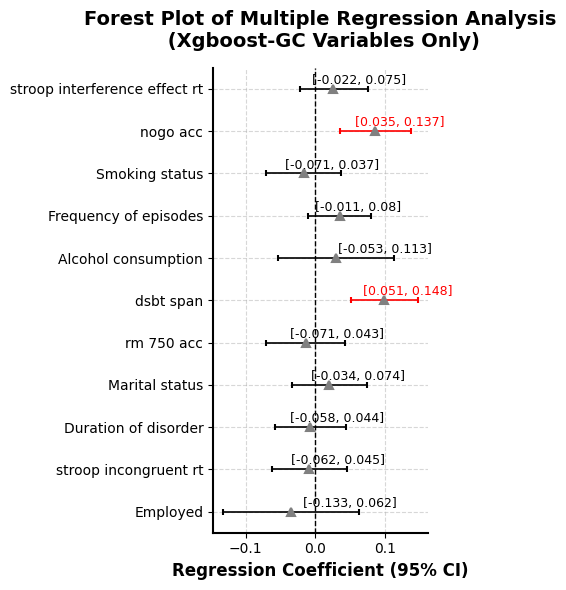

In [14]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# 读取 Excel 数据
file_path = "preprocessed_data_filled.xlsx"  # 请确保文件路径正确
df = pd.read_excel(file_path)

# 确保数据包含所需变量
target_var = "prob_change"
predictors = [
    'Employed', 'stroop_incongruent_rt  at baseline', 'Duration of disorder',
    'Marital status', 
    'rm_750_acc at baseline',
    'dsbt_span at baseline',
    'Alcohol consumption','Frequency of episodes',  'Smoking status', 
    'nogo_acc  at baseline', 'stroop_interference_effect_rt  at baseline',
]

# 检查缺失的列
missing_columns = [col for col in [target_var] + predictors if col not in df.columns]
if missing_columns:
    raise ValueError(f"Missing columns in dataset: {missing_columns}")

# 提取 X 和 Y
X = df[predictors]
X = sm.add_constant(X)  # 添加截距项
y = df[target_var]

# 运行 OLS 多变量回归
model = sm.OLS(y, X, missing='drop').fit()

# 存储回归结果（保留三位小数）
results = {
    "Predictor": ["Intercept"] + predictors,
    "Coefficient": [round(coef, 3) for coef in model.params],
    "P-Value": [round(p, 3) for p in model.pvalues],
    "Lower CI": [round(ci, 3) for ci in model.conf_int()[0]],
    "Upper CI": [round(ci, 3) for ci in model.conf_int()[1]]
}

# 转换为 DataFrame
results_df = pd.DataFrame(results)

# **保存结果到 Excel**
results_df.to_excel("./table/regression_results_forest_plot_multivariabl-多变量oly.xlsx", index=False)
print("回归结果已保存为 regression_results_forest_plot_multivariable.xlsx")

# **打印三线表形式的回归结果**
print("\n\nRegression Results:\n")
print(results_df.to_string(index=False))

# **优化森林图**
fig, ax = plt.subplots(figsize=(4.5,6))

# 使用数值型 y 坐标（索引值），并在后面设置正确的 y tick 标签
for i, row in results_df.iterrows():
    if row["Predictor"] == "Intercept":  # 跳过 Intercept
        continue

    color = "red" if row["P-Value"] < 0.05 else "black"  # 设定颜色
    y_pos = i  # 使用索引值作为 y 轴坐标

    # 绘制误差棒
    ax.errorbar(
        row["Coefficient"], y_pos, 
        xerr=[[row["Coefficient"] - row["Lower CI"]], [row["Upper CI"] - row["Coefficient"]]],
        fmt='^', color="grey", ecolor=color, capsize=2, elinewidth=1.2, markeredgewidth=1.5
    )

    # 在点旁边标注“[下界, 上界]”，y 方向上增加 0.05 个单位
    ax.text(
        row["Upper CI"] - 0.08, y_pos + 0.2, 
        f"[{row['Lower CI']}, {row['Upper CI']}]",
        fontsize=9, verticalalignment='center', color=color
    )

# 设置 y 轴刻度和标签，去除变量名中的 "at baseline" 以及下划线
ax.set_yticks(range(1, len(results_df)))  # 跳过 Intercept
ax.set_yticklabels([
    pred.replace("at baseline", "").replace('_', ' ').strip() 
    for pred in results_df["Predictor"][1:]
])

# 添加参考线（x=0）
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)

# 设置标题和轴标签
ax.set_xlabel("Regression Coefficient (95% CI)", fontsize=12, fontweight='bold')
ax.set_title("Forest Plot of Multiple Regression Analysis\n (Xgboost-GC Variables Only)", fontsize=14, fontweight='bold', pad=15)

# 增强网格线可读性
ax.grid(True, linestyle="--", alpha=0.5)

# 隐藏右侧 Y 轴和顶部 X 轴
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# 设置左侧和底部的边框线宽和颜色
for spine in ['left', 'bottom']:
    ax.spines[spine].set_linewidth(1.5)
    ax.spines[spine].set_color('black')

plt.tight_layout()
plt.show()
fig.savefig("./image/forest_plot_multivariable-GC Variables Only.jpg", dpi=1200, bbox_inches='tight')

### 3.3全变量的多变量回归结果

回归结果已保存为 ./table/regression_results_forest_plot_multivariable-all-全变量.xlsx


Regression Results:

                                 Predictor  Coefficient  P-Value  Lower CI  Upper CI
                   rm_1750_acc at baseline        0.058    0.216    -0.035     0.151
                    rm_750_acc at baseline       -0.081    0.094    -0.177     0.014
        stroop_incongruent_rt  at baseline       -0.004    0.892    -0.058     0.051
stroop_interference_effect_rt  at baseline        0.034    0.184    -0.017     0.086
                     nogo_acc  at baseline        0.088    0.001     0.036     0.141
                  switch_cost  at baseline       -0.024    0.302    -0.071     0.022
                     dsbt_span at baseline        0.079    0.003     0.028     0.130
                                       Age       -0.019    0.441    -0.068     0.030
                           Education years        0.085    0.003     0.031     0.140
                                       BMI        0.

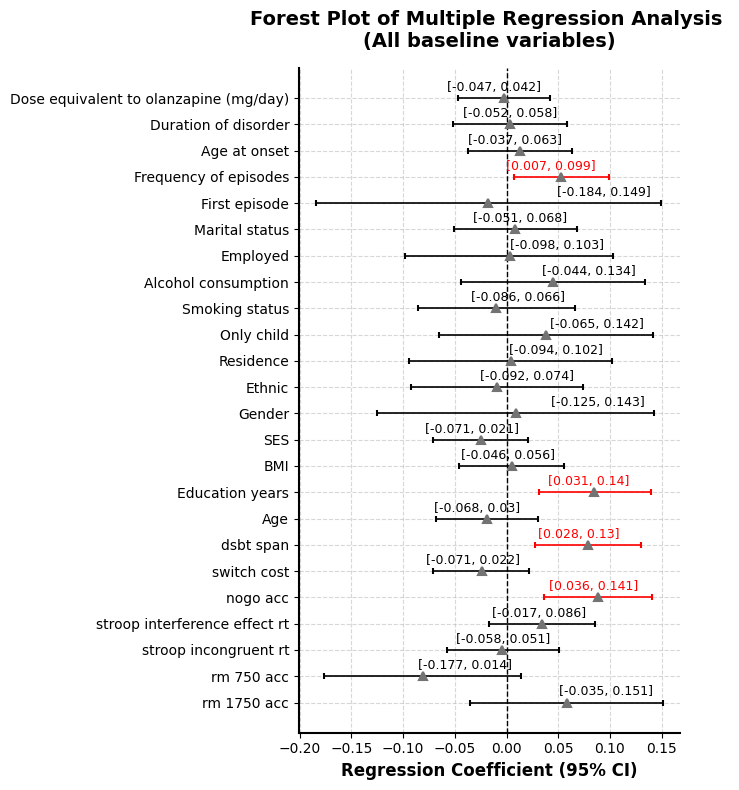

In [8]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# 读取 Excel 数据
file_path = "preprocessed_data_filled.xlsx"  # 请确保文件路径正确
df = pd.read_excel(file_path)

# 定义目标变量和预测变量（请确保名称与 Excel 中的列名完全一致）
target_var = "prob_change"
predictors = [
    'rm_1750_acc at baseline', 'rm_750_acc at baseline',
    'stroop_incongruent_rt  at baseline',
    'stroop_interference_effect_rt  at baseline',
    'nogo_acc  at baseline', 'switch_cost  at baseline',
    'dsbt_span at baseline', 'Age', 'Education years', 
    'BMI', 'SES', 'Gender', 'Ethnic', 'Residence', 'Only child', 
    'Smoking status', 'Alcohol consumption', 'Employed',
    'Marital status', 'First episode', 'Frequency of episodes',
    'Age at onset', 'Duration of disorder',
    'Dose equivalent to olanzapine (mg/day)'
]

# 检查缺失的列
missing_columns = [col for col in [target_var] + predictors if col not in df.columns]
if missing_columns:
    raise ValueError(f"Missing columns in dataset: {missing_columns}")

# 提取 X 和 Y，并添加截距项
X = df[predictors]
X = sm.add_constant(X)  # 添加截距项，通常生成名称为 "const"
y = df[target_var]

# 运行 OLS 多变量回归
model = sm.OLS(y, X, missing='drop').fit()

# 直接基于模型返回的结果构造回归结果 DataFrame，
# 这样可以确保所有数组长度一致（即使用 model.params.index 作为 Predictor 列）
results = {
    "Predictor": model.params.index,
    "Coefficient": [round(coef, 3) for coef in model.params],
    "P-Value": [round(p, 3) for p in model.pvalues],
    "Lower CI": [round(ci, 3) for ci in model.conf_int()[0]],
    "Upper CI": [round(ci, 3) for ci in model.conf_int()[1]]
}

results_df = pd.DataFrame(results)

# **保存结果到 Excel**
output_excel = "./table/regression_results_forest_plot_multivariable-all-全变量.xlsx"
results_df.to_excel(output_excel, index=False)
print(f"回归结果已保存为 {output_excel}")

# **打印三线表形式的回归结果**
print("\n\nRegression Results:\n")
print(results_df.to_string(index=False))

# ------------------------------
# 绘制森林图（跳过截距项，通常名称为 "const"）
# ------------------------------
# 过滤掉截距行
plot_df = results_df[results_df["Predictor"] != "const"]

# 为了绘图使用连续的 y 坐标，重新设置索引
plot_df = plot_df.reset_index(drop=True)

fig, ax = plt.subplots(figsize=(7, 8))

# 遍历每个预测变量绘制误差棒和标注
for i, row in plot_df.iterrows():
    # 根据 P 值设定颜色：P < 0.05 使用红色，否则使用黑色
    color = "red" if row["P-Value"] < 0.05 else "black"
    y_pos = i  # 使用 0,1,2,...

    # 绘制误差棒（误差由下界和上界计算）
    ax.errorbar(
        row["Coefficient"], y_pos, 
        xerr=[[row["Coefficient"] - row["Lower CI"]], [row["Upper CI"] - row["Coefficient"]]],
        fmt='^', color="#737373", ecolor=color, capsize=2, elinewidth=1.2, markeredgewidth=1.5
    )

    # 在点旁边标注置信区间，例如 “[下界, 上界]”
    ax.text(
        row["Upper CI"] - 0.1, y_pos + 0.4, 
        f"[{row['Lower CI']}, {row['Upper CI']}]",
        fontsize=9, verticalalignment='center', color=color
    )

# 设置 y 轴刻度和标签
# 这里去除变量名中的 "at baseline" 以及下划线，并去掉首尾空格
ax.set_yticks(range(len(plot_df)))
ax.set_yticklabels([pred.replace("at baseline", "").replace('_', ' ').strip() 
                    for pred in plot_df["Predictor"]])

# 添加参考线（x=0）
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)

# 设置标题和轴标签
ax.set_xlabel("Regression Coefficient (95% CI)", fontsize=12, fontweight='bold')
ax.set_title("Forest Plot of Multiple Regression Analysis \n(All baseline variables)", 
             fontsize=14, fontweight='bold', pad=15)

# 增强网格线可读性
ax.grid(True, linestyle="--", alpha=0.5)

# 隐藏右侧 Y 轴和顶部 X 轴
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# 设置左侧和底部的边框线宽和颜色
for spine in ['left', 'bottom']:
    ax.spines[spine].set_linewidth(1.5)
    ax.spines[spine].set_color('black')

plt.tight_layout()
plt.show()
fig.savefig("./image/forest_plot_multivariable-GC_Variable-all.jpg", dpi=1200, bbox_inches='tight')

## 全部完成

In [ ]:
print("所有分析已完成！")